# Install ptitprince and load libraries

In [4]:
!pip install ptitprince

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 25.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for ptitprince: filename=ptitprince-0.3.1-py3-none-any.whl size=16216 sha256=e3dfb22d38e63fe9a2ec1811aa619073a5ef0b26ce06ff590965839f073b2eb8
  Stored in directory: /root/.cache/pip/wheels/5d/79/49/b89a41fd3d8780ce2c21c7f2debe45f3c6b08d8aef400e3df1
Successfully built ptitprince


In [5]:
!pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 66.6 MB/s eta 0:00:00


#Load Data

urbanRuralLAI_with_countries_global_ns_veg.csv, urbanRuralLAI_with_countries_veg.csv, ne_110m_admin_0_countries.zip

In [1]:
!unzip ne_110m_admin_0_countries.zip

Archive:  ne_110m_admin_0_countries.zip
  inflating: ne_110m_admin_0_countries.README.html  
 extracting: ne_110m_admin_0_countries.VERSION.txt  
 extracting: ne_110m_admin_0_countries.cpg  
  inflating: ne_110m_admin_0_countries.dbf  
  inflating: ne_110m_admin_0_countries.prj  
  inflating: ne_110m_admin_0_countries.shp  
  inflating: ne_110m_admin_0_countries.shx  


# Maps - WORLD all veg

###urban city

In [6]:
from __future__ import annotations
import math
import re
import sys
from pathlib import Path
from typing import Optional, Tuple, Dict

import numpy as np
import pandas as pd
from scipy.stats import wilcoxon

# --------------------------- CONFIG ---------------------------

FILE_PATH = Path("/content/urbanRuralLAI_with_countries_global_ns_veg.csv")
LAI_SCALE = 10       # set to 1 if LAI already in native units
TOP_N     = 1000

VARIABLE_LABEL = "LAI"

# -------------------- FLEXIBLE COLUMN RESOLUTION -----------------

def _norm(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "", str(s).strip().lower())

def resolve_column(
    df: pd.DataFrame,
    candidates,
    *,
    required: bool = True,
    label: str = ""
) -> Optional[str]:
    if isinstance(candidates, str):
        candidates = [candidates]

    lut = {_norm(c): c for c in df.columns}

    # Exact normalized match
    for cand in candidates:
        k = _norm(cand)
        if k in lut:
            return lut[k]

    # Fuzzy "contains" match
    for c in df.columns:
        nc = _norm(c)
        for cand in candidates:
            if _norm(cand) in nc:
                return c

    if required:
        raise KeyError(
            f"Required column not found for {label or candidates}: "
            f"none of {candidates!r} matched. "
            f"Columns present (first 30): {df.columns[:30].tolist()}"
        )
    return None

def choose_columns(df: pd.DataFrame) -> Tuple[str, str, str, str]:
    ua = resolve_column(
        df,
        ["Urban_Area", "urban_area", "urbanarea", "urban_areakm2", "urban_km2"],
        label="Urban area"
    )
    ba = resolve_column(
        df,
        ["Buffer_area", "buffer_area", "rural_area", "ruralbufferarea", "buffer_areakm2"],
        label="Buffer / rural area"
    )
    lai_u = resolve_column(
        df,
        ["lai_mean_urban", "lai_urban_mean", "lai_urban", "urban_lai_mean"],
        label="Urban LAI"
    )
    lai_r = resolve_column(
        df,
        ["lai_mean_rural", "lai_rural_mean", "lai_rural", "rural_lai_mean"],
        label="Rural LAI"
    )
    return ua, ba, lai_u, lai_r

# --------------------- HELPER FUNCTIONS ------------------------

def _coerce_num(s: pd.Series) -> pd.Series:
    return pd.to_numeric(s, errors="coerce")

def _unweighted_mean_se(x: pd.Series) -> Tuple[float, float, int]:
    x = pd.to_numeric(x, errors="coerce").dropna()
    n = int(x.size)
    if n == 0:
        return (np.nan, np.nan, 0)
    mu = float(x.mean())
    se = float(x.std(ddof=1) / math.sqrt(n)) if n > 1 else np.nan
    return mu, se, n

def _kish_weighted_mean_se(x: pd.Series, w: pd.Series) -> Tuple[float, float]:
    """
    Kish-style weighted mean and SE:
      μ_w   = Σ w x / Σ w
      Var_w = Σ w (x - μ_w)^2 / Σ w
      n_eff = (Σ w)^2 / Σ(w^2)
      SE    = sqrt(Var_w / n_eff)
    """
    x = pd.to_numeric(x, errors="coerce")
    w = pd.to_numeric(w, errors="coerce")
    m = x.notna() & w.notna() & np.isfinite(x) & np.isfinite(w) & (w > 0)
    x = x[m].astype(float)
    w = w[m].astype(float)

    if x.size == 0:
        return (np.nan, np.nan)

    sw = float(w.sum())
    if sw <= 0:
        return (np.nan, np.nan)

    mu_w = float(np.dot(w, x) / sw)

    if x.size == 1:
        return (mu_w, np.nan)

    var_w = float(np.dot(w, (x - mu_w) ** 2) / sw)
    w2 = float(np.dot(w, w))
    if w2 <= 0 or not np.isfinite(var_w):
        return (mu_w, np.nan)

    n_eff = (sw * sw) / w2
    if not np.isfinite(n_eff) or n_eff <= 0:
        return (mu_w, np.nan)

    se_w = float(math.sqrt(var_w / n_eff))
    return mu_w, se_w

def _cohens_d_paired(diff: pd.Series) -> float:
    d = pd.to_numeric(diff, errors="coerce").dropna()
    n = d.size
    if n < 2:
        return float("nan")
    sd = float(d.std(ddof=1))
    if sd <= 0 or not np.isfinite(sd):
        return float("nan")
    return float(d.mean() / sd)

def _rank_biserial_from_diff(diff: pd.Series) -> float:
    """
    Paired rank-biserial for Urban − Rural:

        r_rb = (R_pos − R_neg) / (R_pos + R_neg)

    based on Wilcoxon signed-rank logic (ranks of |diff|, zeros excluded).
    """
    d = pd.to_numeric(diff, errors="coerce")
    d = d[d != 0].dropna()
    n = int(d.size)
    if n == 0:
        return float("nan")

    ranks = d.abs().rank(method="average")
    R_pos = float(ranks[d > 0].sum())
    R_neg = float(ranks[d < 0].sum())
    R_tot = R_pos + R_neg
    if R_tot <= 0:
        return float("nan")

    return float((R_pos - R_neg) / R_tot)

def _pct_diff_breakdown(diff: pd.Series) -> Tuple[float, float, float]:
    """
    From paired diff = Urban − Rural, compute:
      % U>R  = 100 * share(diff > 0)
      % U==R = 100 * share(diff == 0)
      % R>U  = 100 * share(diff < 0)
    """
    d = pd.to_numeric(diff, errors="coerce").dropna()
    n = float(d.size)
    if n == 0:
        return np.nan, np.nan, np.nan
    pct_ugt = float((d > 0).sum() * 100.0 / n)
    pct_ueq = float((d == 0).sum() * 100.0 / n)
    pct_rgt = float((d < 0).sum() * 100.0 / n)
    return pct_ugt, pct_ueq, pct_rgt

def _subset_top_n(df: pd.DataFrame, ua_col: str, n: int) -> pd.DataFrame:
    tmp = df.dropna(subset=[ua_col])
    tmp = tmp[tmp[ua_col] > 0]
    if tmp.empty:
        return tmp
    return tmp.nlargest(min(n, len(tmp)), ua_col, keep="all").copy()

def _fmt_4dp(v):
    if isinstance(v, (float, np.floating)):
        if not np.isfinite(v):
            return ""
        return f"{v:.4f}"
    if isinstance(v, (int, np.integer)):
        return f"{v}"
    if v is None:
        return ""
    return str(v)

def _fmt_2dp(v):
    if isinstance(v, (float, np.floating)):
        if not np.isfinite(v):
            return ""
        return f"{v:.2f}"
    if isinstance(v, (int, np.integer)):
        return f"{float(v):.2f}"
    if v is None:
        return ""
    return str(v)

# --------------------- SCOPE SUMMARY ---------------------------

def summarize_scope(
    df: pd.DataFrame,
    cohort_label: str,
    ua_col: str,
    ba_col: str,
    lai_u_col: str,
    lai_r_col: str,
) -> Optional[Dict]:
    needed = [ua_col, ba_col, lai_u_col, lai_r_col]
    sub = df.copy()
    for c in needed:
        sub[c] = _coerce_num(sub[c])
    sub = sub.dropna(subset=needed)
    sub = sub[(sub[ua_col] > 0) & (sub[ba_col] > 0)]
    if sub.empty:
        return None

    scale = float(LAI_SCALE)
    lai_u = sub[lai_u_col] / scale
    lai_r = sub[lai_r_col] / scale

    # Unweighted
    urb_mu, urb_se, _ = _unweighted_mean_se(lai_u)
    rur_mu, rur_se, _ = _unweighted_mean_se(lai_r)

    # Weighted
    urb_mu_w, urb_se_w = _kish_weighted_mean_se(lai_u, sub[ua_col])
    rur_mu_w, rur_se_w = _kish_weighted_mean_se(lai_r, sub[ba_col])

    # Differences (paired)
    diff = lai_u - lai_r
    d_clean = pd.to_numeric(diff, errors="coerce").dropna()
    n = int(d_clean.size)
    delta   = float(d_clean.mean()) if n > 0 else np.nan
    delta_w = float(urb_mu_w - rur_mu_w) if np.isfinite(urb_mu_w) and np.isfinite(rur_mu_w) else np.nan

    # Paired effect sizes
    d_val = _cohens_d_paired(diff)
    r_rb  = _rank_biserial_from_diff(diff)

    # Wilcoxon signed-rank p-value on paired differences
    try:
        d_nz = d_clean[d_clean != 0]
        if d_nz.size == 0:
            p = np.nan
        else:
            stat, p = wilcoxon(
                d_nz,
                zero_method="wilcox",
                alternative="two-sided",
                mode="auto",
            )
            p = float(p)
    except Exception:
        p = np.nan

    # % U>R, % U==R, % R>U
    pct_ugt, pct_ueq, pct_rgt = _pct_diff_breakdown(diff)

    return {
        "Variable": VARIABLE_LABEL,
        "Cohort": cohort_label,
        "Urban μ": urb_mu,
        "Urban SE": urb_se,
        "Urban μw": urb_mu_w,
        "Urban SEw": urb_se_w,
        "Rural μ": rur_mu,
        "Rural SE": rur_se,
        "Rural μw": rur_mu_w,
        "Rural SEw": rur_se_w,
        "Δ": delta,
        "Δw": delta_w,
        "Cohen's d": d_val,
        "Rank-biserial r": r_rb,
        "p-value": p,
        "% U>R": pct_ugt,
        "% U==R": pct_ueq,
        "% R>U": pct_rgt,
        "n": n,
    }

# ---------------------------- MAIN ----------------------------

def main():
    if not FILE_PATH.is_file():
        print(f"[ERROR] File not found → {FILE_PATH}", file=sys.stderr)
        sys.exit(1)

    try:
        df = pd.read_csv(FILE_PATH, low_memory=False)
    except Exception as e:
        print(f"[ERROR] Failed to read CSV: {e}", file=sys.stderr)
        sys.exit(2)

    # Resolve columns
    try:
        ua_col, ba_col, lai_u_col, lai_r_col = choose_columns(df)
    except KeyError as e:
        print(f"[ERROR] {e}", file=sys.stderr)
        sys.exit(3)

    print("[INFO] Resolved columns:")
    print(f"  Urban_Area    → {ua_col}")
    print(f"  Buffer_area   → {ba_col}")
    print(f"  LAI urban     → {lai_u_col}")
    print(f"  LAI rural     → {lai_r_col}")

    for c in (ua_col, ba_col, lai_u_col, lai_r_col):
        df[c] = _coerce_num(df[c])

    df = df.dropna(subset=[ua_col, ba_col, lai_u_col, lai_r_col])
    df = df[(df[ua_col] > 0) & (df[ba_col] > 0)].copy()

    if df.empty:
        print("[ERROR] No valid rows after cleaning.", file=sys.stderr)
        sys.exit(4)

    # ALL cities
    row_all = summarize_scope(df, "All cities", ua_col, ba_col, lai_u_col, lai_r_col)

    # TOP 1000 (Major cities)
    df_top = _subset_top_n(df, ua_col, TOP_N)
    row_top = summarize_scope(df_top, "Major cities", ua_col, ba_col, lai_u_col, lai_r_col)

    rows = [r for r in (row_top, row_all) if r is not None]  # Major first, then All
    if not rows:
        print("[ERROR] No valid summary rows produced.", file=sys.stderr)
        sys.exit(5)

    summary_df = pd.DataFrame(rows, columns=[
        "Variable", "Cohort",
        "Urban μ", "Urban SE", "Urban μw", "Urban SEw",
        "Rural μ", "Rural SE", "Rural μw", "Rural SEw",
        "Δ", "Δw", "Cohen's d", "Rank-biserial r", "p-value",
        "% U>R", "% U==R", "% R>U",
        "n",
    ])

    float_cols_4dp = [
        "Urban μ", "Urban SE", "Urban μw", "Urban SEw",
        "Rural μ", "Rural SE", "Rural μw", "Rural SEw",
        "Δ", "Δw", "Cohen's d", "Rank-biserial r",
        "p-value",
    ]
    pct_cols = ["% U>R", "% U==R", "% R>U"]

    for c in float_cols_4dp:
        summary_df[c] = pd.to_numeric(summary_df[c], errors="coerce").round(4)

    for c in pct_cols:
        summary_df[c] = pd.to_numeric(summary_df[c], errors="coerce").round(2)

    formatters = {}
    for c in summary_df.columns:
        if c in pct_cols:
            formatters[c] = _fmt_2dp
        elif c in ["Variable", "Cohort"]:
            formatters[c] = str
        else:
            formatters[c] = _fmt_4dp

    print("\n=== LAI: URBAN vs RURAL (All vegetation; All cities & Top 1000) ===")
    print(summary_df.to_string(index=False, formatters=formatters))

    out_csv = FILE_PATH.parent / "T1_LAI.csv"
    try:
        summary_df.to_csv(out_csv, index=False, na_rep="")
        print(f"\n[OK] Summary CSV saved → {out_csv}")
    except Exception as e:
        print(f"[ERROR] Failed to save CSV: {e}", file=sys.stderr)
        sys.exit(6)

if __name__ == "__main__":
    main()


[INFO] Resolved columns:
  Urban_Area    → Urban_Area
  Buffer_area   → Rural_area
  LAI urban     → lai_mean_urban
  LAI rural     → lai_mean_rural

=== LAI: URBAN vs RURAL (All vegetation; All cities & Top 1000) ===
Variable       Cohort Urban μ Urban SE Urban μw Urban SEw Rural μ Rural SE Rural μw Rural SEw       Δ      Δw Cohen's d Rank-biserial r p-value % U>R % U==R % R>U     n
     LAI Major cities  0.3690   0.0100   0.3932    0.0193  1.1577   0.0204   1.1820    0.0370 -0.7887 -0.7888   -1.5618         -0.9845  0.0000  2.50   0.10 97.40  1000
     LAI   All cities  0.5931   0.0018   0.4518    0.0107  1.2497   0.0026   1.2105    0.0165 -0.6566 -0.7587   -1.2596         -0.9567  0.0000  5.62   0.15 94.23 83102

[OK] Summary CSV saved → /content/T1_LAI.csv


[io] Loading: /content/urbanRuralLAI_with_countries_global_ns_veg.csv


/tmp/ipython-input-2168050696.py:49: DtypeWarning: Columns (36,38,39,41,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path)


[warn] Jenks failed or unavailable (No module named 'mapclassify'); falling back to upper_tail_quantile.
[warn] Tied break edges; reducing classes from 16 to 12.
[breaks] method=jenks classes=12 bounds=[0.03, 0.14, 0.20, 0.27, 0.35, 0.43, 0.51, 0.60, 0.67, 0.75, 0.82, 0.96, 0.98] clipped=True
[counts] per-class: [176, 154, 134, 114, 97, 81, 66, 53, 41, 31, 22, 31]


/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


[io] Map saved  →  /content/Fig3A_map.pdf


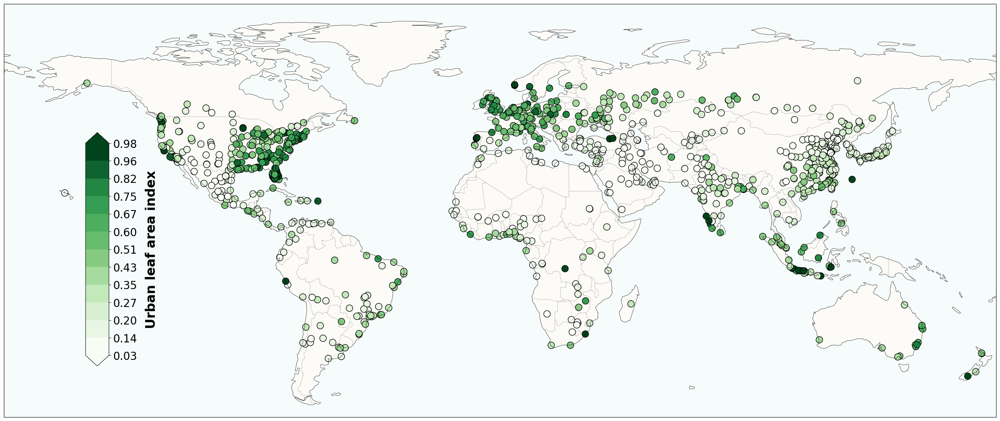

[io] Histogram saved →  /content/Fig3A_hist.pdf


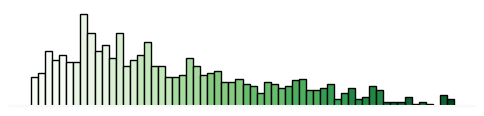

In [7]:
# ─────────────────────────────────────────────────────────────
# IMPORTS
# ─────────────────────────────────────────────────────────────
import sys
from pathlib import Path
from typing import List, Tuple

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap

# ─────────────────────────────────────────────────────────────
# CONFIG
# ─────────────────────────────────────────────────────────────
FILE_PATH   = Path('/content/urbanRuralLAI_with_countries_global_ns_veg.csv')

OUTPUT_MAP  = Path('/content/Fig3A_map.pdf')
OUTPUT_HIST = Path('/content/Fig3A_hist.pdf')

LAI_SCALE         = 10          # undo earlier ×10 scaling
TOP_N             = 1000
NUM_BINS          = 60          # 1D density strip bins
N_CLASSES         = 16          # more classes overall
BREAKS_METHOD     = "jenks"  # {"upper_tail_quantile","quantile","log_equal","jenks"}
WINSOR_LOW        = 0.025        # used for *_quantile methods
WINSOR_HIGH       = 0.975
UPPER_TAIL_FOCUS  = 3.0         # >1 = denser bins near upper tail (try 2–4)

# Expanded sequential green palette (will be resampled to N_CLASSES)
BASE_GREENS = [
    "#f7fcf5", "#edf8e9", "#e3f3de", "#d7efcf", "#c9eabf",
    "#b7e3ac", "#a1d99b", "#8ccc84", "#74c476", "#64b96b",
    "#51ae60", "#41ab5d", "#2f964e", "#238b45", "#166c35",
    "#0a5c2e", "#00441b"
]

# ─────────────────────────────────────────────────────────────
# HELPERS
# ─────────────────────────────────────────────────────────────
def read_input(path: Path) -> gpd.GeoDataFrame:
    if not path.exists():
        sys.exit(f"ERROR: Input file not found at {path}")
    try:
        if path.suffix.lower() == ".csv":
            df = pd.read_csv(path)
            gdf = gpd.GeoDataFrame(
                df,
                geometry=gpd.points_from_xy(df["lon"], df["lat"]),
                crs="EPSG:4326",
            )
        else:
            gdf = gpd.read_file(path)
    except Exception as exc:
        sys.exit(f"ERROR reading file: {exc}")

    req = ["lai_mean_urban", "Urban_Area", "lat", "lon"]
    missing = [c for c in req if c not in gdf.columns]
    if missing:
        sys.exit(f"ERROR: missing columns {missing!r}")

    gdf[req] = gdf[req].apply(pd.to_numeric, errors="coerce")
    gdf = gdf.dropna(subset=req)
    if gdf.empty:
        sys.exit("ERROR: no valid rows after NaN removal.")
    return gdf


def resample_colors(colors: List[str], n: int) -> List[str]:
    if len(colors) == n:
        return colors
    cmap = LinearSegmentedColormap.from_list("greens_resampled", colors, N=256)
    # grab rgb tuples uniformly; rgba->rgb
    return [tuple(np.array(cmap(x))[:3]) for x in np.linspace(0, 1, n)]


def compute_breaks(values: np.ndarray, method: str, n_classes: int,
                   winsor_low: float, winsor_high: float,
                   tail_focus: float) -> Tuple[np.ndarray, bool]:
    """Return (bounds, clipped_flag)."""
    v = np.asarray(values[np.isfinite(values)], float)
    if v.size < 2:
        raise ValueError("Insufficient data to compute breaks.")
    clipped = False

    if method == "quantile":
        qs = np.linspace(0, 1, n_classes + 1)
        bounds = np.quantile(v, qs)

    elif method == "upper_tail_quantile":
        # Winsorize to reduce leverage of extremes
        lo, hi = np.quantile(v, [winsor_low, winsor_high])
        v = np.clip(v, lo, hi)
        clipped = True
        # Bias probability grid toward upper tail: p' = 1 - (1 - p)**k  (k>1)
        p = np.linspace(0, 1, n_classes + 1)
        p_biased = 1.0 - np.power(1.0 - p, tail_focus)
        bounds = np.quantile(v, p_biased)

    elif method == "log_equal":
        vpos = np.clip(v, 1e-6, None)
        lv = np.log1p(vpos)
        lb = np.linspace(lv.min(), lv.max(), n_classes + 1)
        bounds = np.expm1(lb)

    elif method == "jenks":
        try:
            import mapclassify as mc  # optional
            nb = mc.NaturalBreaks(v, k=n_classes, initial=200)
            ub = np.asarray(nb.bins, float)
            bounds = np.concatenate(([v.min()], ub))
        except Exception as exc:
            print(f"[warn] Jenks failed or unavailable ({exc}); falling back to upper_tail_quantile.")
            return compute_breaks(v, "upper_tail_quantile", n_classes,
                                  winsor_low, winsor_high, tail_focus)
    else:
        raise ValueError(f"Unknown breaks method: {method}")

    # Ensure strictly increasing; collapse duplicates if ties
    bounds = np.asarray(bounds, float)
    uniq = np.unique(bounds)
    if uniq.size < bounds.size:
        print(f"[warn] Tied break edges; reducing classes from {n_classes} to {uniq.size - 1}.")
        bounds = uniq
    if bounds.size < 2:
        raise ValueError("Failed to compute valid class bounds.")
    return bounds, clipped


def classify(values: np.ndarray, bounds: np.ndarray) -> np.ndarray:
    return np.digitize(values, bounds[1:-1], right=False)


# ─────────────────────────────────────────────────────────────
# LOAD & PREP
# ─────────────────────────────────────────────────────────────
print(f"[io] Loading: {FILE_PATH}")
gdf = read_input(FILE_PATH)

gdf = gdf.nlargest(TOP_N, "Urban_Area").copy()
if gdf.empty:
    sys.exit(f"ERROR: nlargest({TOP_N}) produced no rows.")
gdf["lai_urban_scaled"] = gdf["lai_mean_urban"] / LAI_SCALE
vals = gdf["lai_urban_scaled"].to_numpy()

# Compute bounds (upper-tail heavy)
bounds, clipped = compute_breaks(
    vals,
    method=BREAKS_METHOD,
    n_classes=N_CLASSES,
    winsor_low=WINSOR_LOW,
    winsor_high=WINSOR_HIGH,
    tail_focus=UPPER_TAIL_FOCUS,
)
n_classes_eff = bounds.size - 1
print(f"[breaks] method={BREAKS_METHOD} classes={n_classes_eff} "
      f"bounds=[{', '.join(f'{b:.2f}' for b in bounds)}] clipped={clipped}")

# Class counts for sanity
cls_counts = np.bincount(classify(vals, bounds), minlength=n_classes_eff)
print(f"[counts] per-class: {cls_counts.tolist()}")

# Colormaps
colors = resample_colors(BASE_GREENS, n_classes_eff)
cmap_disc = ListedColormap(colors, name="lai_disc")
norm_disc = BoundaryNorm(bounds, ncolors=n_classes_eff, clip=False)
cmap_cont = LinearSegmentedColormap.from_list("lai_cont", colors, N=256)

# ─────────────────────────────────────────────────────────────
# MAP
# ─────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(30, 20), subplot_kw={"projection": ccrs.PlateCarree()})
ax.add_feature(cfeature.LAND,  facecolor="#fcfbf7")
ax.add_feature(cfeature.OCEAN, facecolor="lightblue", alpha=0.10)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS,  linewidth=0.5, linestyle=":")

sc = ax.scatter(
    gdf["lon"].values, gdf["lat"].values,
    c=vals, cmap=cmap_disc, norm=norm_disc,
    s=150, edgecolors="black", linewidths=1,
    transform=ccrs.PlateCarree(), alpha=1.0
)

# Colorbar (no mean marker)
cbar_ax = fig.add_axes([0.17, 0.30, 0.02, 0.30])
extend_flag = "both" if clipped else "neither"
cbar = plt.colorbar(sc, cax=cbar_ax, orientation="vertical", extend=extend_flag)
cbar.set_label("Urban leaf area index", fontsize=24, labelpad=15, weight="bold")
cbar.ax.tick_params(labelsize=20)
cbar.set_ticks(bounds)
cbar.set_ticklabels([f"{b:.2f}" for b in bounds])

ax.set_extent([-180, 180, -60, 90])
plt.subplots_adjust(left=0.1, right=0.95, top=0.95, bottom=0.05)

try:
    plt.savefig(OUTPUT_MAP, bbox_inches="tight", format="pdf", transparent=True)
    print(f"[io] Map saved  →  {OUTPUT_MAP.resolve()}")
except Exception as exc:
    print(f"[warn] ERROR saving map: {exc}")
plt.show()

# ─────────────────────────────────────────────────────────────
# HISTOGRAM STRIP (same bounds for coherence)
# ─────────────────────────────────────────────────────────────
def mini_hist_discrete(series: np.ndarray, bounds: np.ndarray, bins: int,
                       cmap_disc: ListedColormap, norm_disc: BoundaryNorm, path: Path) -> None:
    s = series[np.isfinite(series)]
    if s.size == 0:
        print("[hist] No data to plot."); return
    s = s[(s >= bounds[0]) & (s <= bounds[-1])]

    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(
        s,
        bins=np.linspace(bounds[0], bounds[-1], bins + 1),
        edgecolor="black",
        linewidth=1
    )

    # DISCRETE: color by class of bin midpoint under BoundaryNorm
    for patch, left, right in zip(patches, edges[:-1], edges[1:]):
        mid = 0.5 * (left + right)
        patch.set_facecolor(cmap_disc(norm_disc(mid)))

    ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)
    ax.spines["bottom"].set_visible(True)
    ax.spines["bottom"].set_color("#f6fbf7")
    ax.spines["bottom"].set_linewidth(1.5)
    fig.patch.set_alpha(0); ax.patch.set_alpha(0)

    try:
        fig.savefig(path, dpi=400, bbox_inches="tight", format="pdf", transparent=True)
        print(f"[io] Histogram saved →  {path.resolve()}")
    except Exception as exc:
        print(f"[warn] ERROR saving histogram: {exc}")
    plt.show()


mini_hist_discrete(
    vals,
    bounds=bounds,
    bins=NUM_BINS,
    cmap_disc=cmap_disc,
    norm_disc=norm_disc,
    path=OUTPUT_HIST
)


[io] Loading: /content/urbanRuralLAI_with_countries_global_ns_veg.csv


/tmp/ipython-input-3210289212.py:49: DtypeWarning: Columns (36,38,39,41,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path)


[warn] Tied break edges; reducing classes from 16 to 12.
[breaks] method=upper_tail_quantile classes=12 bounds=[0.04, 0.16, 0.28, 0.41, 0.56, 0.70, 0.83, 0.97, 1.13, 1.30, 1.51, 1.76, 1.86] clipped=True
[counts] per-class: [14628, 12802, 11098, 9515, 8055, 6715, 5498, 4403, 3429, 2576, 1846, 2537]
[io] Map saved  →  /content/Fig3A_map_all.pdf


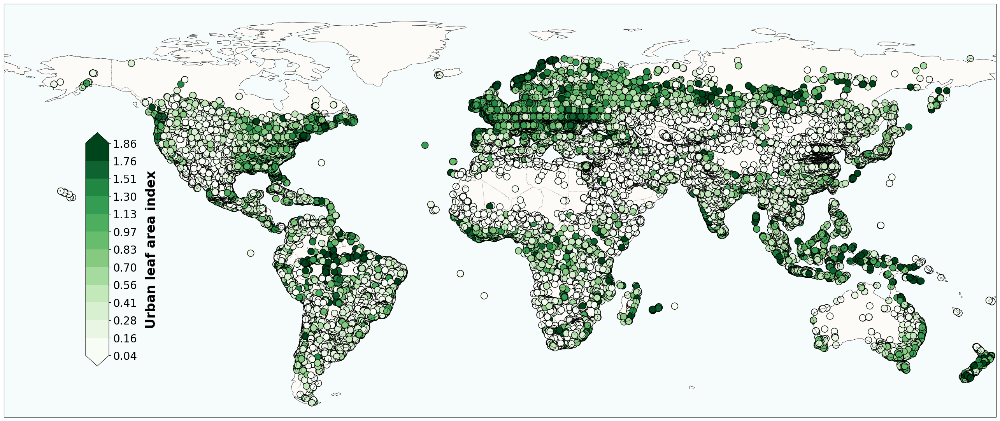

[io] Histogram saved →  /content/Fig3A_hist_all.pdf


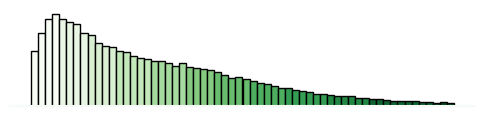

In [8]:
# ─────────────────────────────────────────────────────────────
# IMPORTS
# ─────────────────────────────────────────────────────────────
import sys
from pathlib import Path
from typing import List, Tuple

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap

# ─────────────────────────────────────────────────────────────
# CONFIG
# ─────────────────────────────────────────────────────────────
FILE_PATH   = Path('/content/urbanRuralLAI_with_countries_global_ns_veg.csv')

OUTPUT_MAP  = Path('/content/Fig3A_map_all.pdf')
OUTPUT_HIST = Path('/content/Fig3A_hist_all.pdf')

LAI_SCALE         = 10          # undo earlier ×10 scaling
TOP_N             = 83102
NUM_BINS          = 60          # 1D density strip bins
N_CLASSES         = 16          # more classes overall
BREAKS_METHOD     = "upper_tail_quantile"  # {"upper_tail_quantile","quantile","log_equal","jenks"}
WINSOR_LOW        = 0.025        # used for *_quantile methods
WINSOR_HIGH       = 0.975
UPPER_TAIL_FOCUS  = 3.0         # >1 = denser bins near upper tail (try 2–4)

# Expanded sequential green palette (will be resampled to N_CLASSES)
BASE_GREENS = [
    "#f7fcf5", "#edf8e9", "#e3f3de", "#d7efcf", "#c9eabf",
    "#b7e3ac", "#a1d99b", "#8ccc84", "#74c476", "#64b96b",
    "#51ae60", "#41ab5d", "#2f964e", "#238b45", "#166c35",
    "#0a5c2e", "#00441b"
]

# ─────────────────────────────────────────────────────────────
# HELPERS
# ─────────────────────────────────────────────────────────────
def read_input(path: Path) -> gpd.GeoDataFrame:
    if not path.exists():
        sys.exit(f"ERROR: Input file not found at {path}")
    try:
        if path.suffix.lower() == ".csv":
            df = pd.read_csv(path)
            gdf = gpd.GeoDataFrame(
                df,
                geometry=gpd.points_from_xy(df["lon"], df["lat"]),
                crs="EPSG:4326",
            )
        else:
            gdf = gpd.read_file(path)
    except Exception as exc:
        sys.exit(f"ERROR reading file: {exc}")

    req = ["lai_mean_urban", "Urban_Area", "lat", "lon"]
    missing = [c for c in req if c not in gdf.columns]
    if missing:
        sys.exit(f"ERROR: missing columns {missing!r}")

    gdf[req] = gdf[req].apply(pd.to_numeric, errors="coerce")
    gdf = gdf.dropna(subset=req)
    if gdf.empty:
        sys.exit("ERROR: no valid rows after NaN removal.")
    return gdf


def resample_colors(colors: List[str], n: int) -> List[str]:
    if len(colors) == n:
        return colors
    cmap = LinearSegmentedColormap.from_list("greens_resampled", colors, N=256)
    # grab rgb tuples uniformly; rgba->rgb
    return [tuple(np.array(cmap(x))[:3]) for x in np.linspace(0, 1, n)]


def compute_breaks(values: np.ndarray, method: str, n_classes: int,
                   winsor_low: float, winsor_high: float,
                   tail_focus: float) -> Tuple[np.ndarray, bool]:
    """Return (bounds, clipped_flag)."""
    v = np.asarray(values[np.isfinite(values)], float)
    if v.size < 2:
        raise ValueError("Insufficient data to compute breaks.")
    clipped = False

    if method == "quantile":
        qs = np.linspace(0, 1, n_classes + 1)
        bounds = np.quantile(v, qs)

    elif method == "upper_tail_quantile":
        # Winsorize to reduce leverage of extremes
        lo, hi = np.quantile(v, [winsor_low, winsor_high])
        v = np.clip(v, lo, hi)
        clipped = True
        # Bias probability grid toward upper tail: p' = 1 - (1 - p)**k  (k>1)
        p = np.linspace(0, 1, n_classes + 1)
        p_biased = 1.0 - np.power(1.0 - p, tail_focus)
        bounds = np.quantile(v, p_biased)

    elif method == "log_equal":
        vpos = np.clip(v, 1e-6, None)
        lv = np.log1p(vpos)
        lb = np.linspace(lv.min(), lv.max(), n_classes + 1)
        bounds = np.expm1(lb)

    elif method == "jenks":
        try:
            import mapclassify as mc  # optional
            nb = mc.NaturalBreaks(v, k=n_classes, initial=200)
            ub = np.asarray(nb.bins, float)
            bounds = np.concatenate(([v.min()], ub))
        except Exception as exc:
            print(f"[warn] Jenks failed or unavailable ({exc}); falling back to upper_tail_quantile.")
            return compute_breaks(v, "upper_tail_quantile", n_classes,
                                  winsor_low, winsor_high, tail_focus)
    else:
        raise ValueError(f"Unknown breaks method: {method}")

    # Ensure strictly increasing; collapse duplicates if ties
    bounds = np.asarray(bounds, float)
    uniq = np.unique(bounds)
    if uniq.size < bounds.size:
        print(f"[warn] Tied break edges; reducing classes from {n_classes} to {uniq.size - 1}.")
        bounds = uniq
    if bounds.size < 2:
        raise ValueError("Failed to compute valid class bounds.")
    return bounds, clipped


def classify(values: np.ndarray, bounds: np.ndarray) -> np.ndarray:
    return np.digitize(values, bounds[1:-1], right=False)


# ─────────────────────────────────────────────────────────────
# LOAD & PREP
# ─────────────────────────────────────────────────────────────
print(f"[io] Loading: {FILE_PATH}")
gdf = read_input(FILE_PATH)

gdf = gdf.nlargest(TOP_N, "Urban_Area").copy()
if gdf.empty:
    sys.exit(f"ERROR: nlargest({TOP_N}) produced no rows.")
gdf["lai_urban_scaled"] = gdf["lai_mean_urban"] / LAI_SCALE
vals = gdf["lai_urban_scaled"].to_numpy()

# Compute bounds (upper-tail heavy)
bounds, clipped = compute_breaks(
    vals,
    method=BREAKS_METHOD,
    n_classes=N_CLASSES,
    winsor_low=WINSOR_LOW,
    winsor_high=WINSOR_HIGH,
    tail_focus=UPPER_TAIL_FOCUS,
)
n_classes_eff = bounds.size - 1
print(f"[breaks] method={BREAKS_METHOD} classes={n_classes_eff} "
      f"bounds=[{', '.join(f'{b:.2f}' for b in bounds)}] clipped={clipped}")

# Class counts for sanity
cls_counts = np.bincount(classify(vals, bounds), minlength=n_classes_eff)
print(f"[counts] per-class: {cls_counts.tolist()}")

# Colormaps
colors = resample_colors(BASE_GREENS, n_classes_eff)
cmap_disc = ListedColormap(colors, name="lai_disc")
norm_disc = BoundaryNorm(bounds, ncolors=n_classes_eff, clip=False)
cmap_cont = LinearSegmentedColormap.from_list("lai_cont", colors, N=256)

# ─────────────────────────────────────────────────────────────
# MAP
# ─────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(30, 20), subplot_kw={"projection": ccrs.PlateCarree()})
ax.add_feature(cfeature.LAND,  facecolor="#fcfbf7")
ax.add_feature(cfeature.OCEAN, facecolor="lightblue", alpha=0.10)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS,  linewidth=0.5, linestyle=":")

sc = ax.scatter(
    gdf["lon"].values, gdf["lat"].values,
    c=vals, cmap=cmap_disc, norm=norm_disc,
    s=150, edgecolors="black", linewidths=1,
    transform=ccrs.PlateCarree(), alpha=1.0
)

# Colorbar (no mean marker)
cbar_ax = fig.add_axes([0.17, 0.30, 0.02, 0.30])
extend_flag = "both" if clipped else "neither"
cbar = plt.colorbar(sc, cax=cbar_ax, orientation="vertical", extend=extend_flag)
cbar.set_label("Urban leaf area index", fontsize=24, labelpad=15, weight="bold")
cbar.ax.tick_params(labelsize=20)
cbar.set_ticks(bounds)
cbar.set_ticklabels([f"{b:.2f}" for b in bounds])

ax.set_extent([-180, 180, -60, 90])
plt.subplots_adjust(left=0.1, right=0.95, top=0.95, bottom=0.05)

try:
    plt.savefig(OUTPUT_MAP, bbox_inches="tight", format="pdf", transparent=True)
    print(f"[io] Map saved  →  {OUTPUT_MAP.resolve()}")
except Exception as exc:
    print(f"[warn] ERROR saving map: {exc}")
plt.show()

# ─────────────────────────────────────────────────────────────
# HISTOGRAM STRIP (same bounds for coherence)
# ─────────────────────────────────────────────────────────────
def mini_hist_discrete(series: np.ndarray, bounds: np.ndarray, bins: int,
                       cmap_disc: ListedColormap, norm_disc: BoundaryNorm, path: Path) -> None:
    s = series[np.isfinite(series)]
    if s.size == 0:
        print("[hist] No data to plot."); return
    s = s[(s >= bounds[0]) & (s <= bounds[-1])]

    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(
        s,
        bins=np.linspace(bounds[0], bounds[-1], bins + 1),
        edgecolor="black",
        linewidth=1
    )

    # DISCRETE: color by class of bin midpoint under BoundaryNorm
    for patch, left, right in zip(patches, edges[:-1], edges[1:]):
        mid = 0.5 * (left + right)
        patch.set_facecolor(cmap_disc(norm_disc(mid)))

    ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)
    ax.spines["bottom"].set_visible(True)
    ax.spines["bottom"].set_color("#f6fbf7")
    ax.spines["bottom"].set_linewidth(1.5)
    fig.patch.set_alpha(0); ax.patch.set_alpha(0)

    try:
        fig.savefig(path, dpi=400, bbox_inches="tight", format="pdf", transparent=True)
        print(f"[io] Histogram saved →  {path.resolve()}")
    except Exception as exc:
        print(f"[warn] ERROR saving histogram: {exc}")
    plt.show()


mini_hist_discrete(
    vals,
    bounds=bounds,
    bins=NUM_BINS,
    cmap_disc=cmap_disc,
    norm_disc=norm_disc,
    path=OUTPUT_HIST
)

###urban rural city differences

/tmp/ipython-input-2214159405.py:29: DtypeWarning: Columns (36,38,39,41,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/urbanRuralLAI_with_countries_global_ns_veg.csv')


Dropped 1 rows where lai_difference == 0

LAI-difference stats:
Max   :  0.9805
Min   : -2.5502
Mean  : -0.7895
Median: -0.7347
Std   :  0.5046

Map saved  →  /content/Fig3B_map.pdf


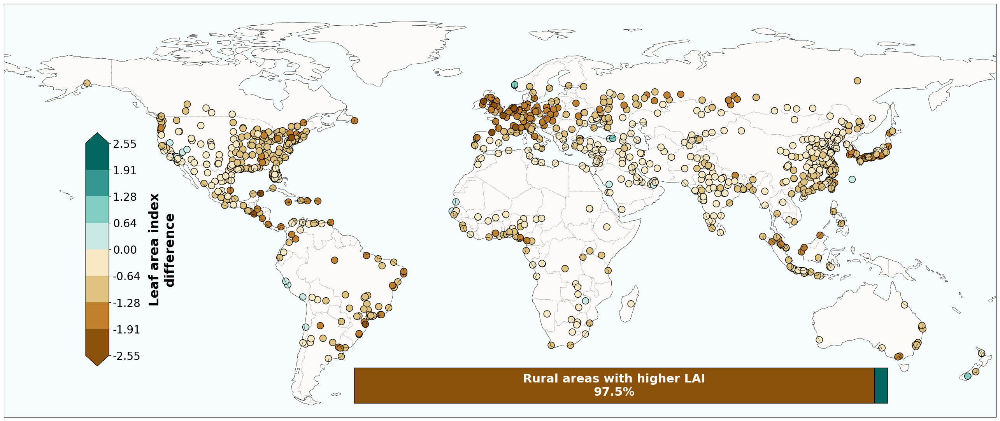

Histogram saved →  /content/Fig3B_hist.pdf


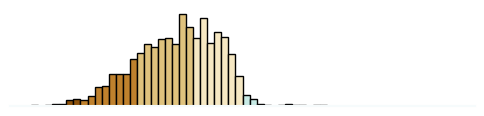

In [9]:

# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import sys
from pathlib import Path

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap

# ------------------------------------------------------------------
# CONFIG
# ------------------------------------------------------------------
OUTPUT_MAP   = Path("/content/Fig3B_map.pdf")
OUTPUT_HIST  = Path("/content/Fig3B_hist.pdf")
LAI_SCALE    = 10          # undo earlier ×10 scaling
TOP_N        = 1000        # keep N largest urban areas; set None to disable
NUM_BINS     = 60          # histogram bins

# ------------------------------------------------------------------
# 0.  FETCH THE SOURCE DATAFRAME
# ------------------------------------------------------------------
try:
    # If 'df' is already in memory, comment the next line and set plot_gdf = df.copy()
    df = pd.read_csv('/content/urbanRuralLAI_with_countries_global_ns_veg.csv')
    plot_gdf = df.copy()
except NameError:
    sys.exit("ERROR: DataFrame 'df' not found in the current namespace.")
except FileNotFoundError:
    sys.exit("ERROR: Source CSV file not found. Please check the path.")

# ------------------------------------------------------------------
# 1.  VALIDATE & CLEAN
# ------------------------------------------------------------------
required = ["lai_mean_urban", "lai_mean_rural", "lat", "lon", "Urban_Area"]
missing  = [c for c in required if c not in plot_gdf.columns]
if missing:
    sys.exit(f"ERROR: Missing columns {missing!r} in the DataFrame.")

num_cols = ["lai_mean_urban", "lai_mean_rural", "Urban_Area"]
plot_gdf[num_cols] = plot_gdf[num_cols].apply(pd.to_numeric, errors="coerce")
plot_gdf = plot_gdf.dropna(subset=required)
if plot_gdf.empty:
    sys.exit("ERROR: DataFrame empty after dropping NaNs.")

# ------------------------------------------------------------------
# 2.  RESCALE LAI & KEEP TOP-N
# ------------------------------------------------------------------
plot_gdf[["lai_mean_urban", "lai_mean_rural"]] /= LAI_SCALE

if TOP_N is not None:
    plot_gdf = plot_gdf.nlargest(TOP_N, "Urban_Area").copy()
    if plot_gdf.empty:
        sys.exit(f"ERROR: No rows returned by nlargest({TOP_N}).")

# ------------------------------------------------------------------
# 3.  DIFFERENCE & DROP EXACT 0s
# ------------------------------------------------------------------
plot_gdf["lai_difference"] = plot_gdf["lai_mean_urban"] - plot_gdf["lai_mean_rural"]
before_drop = len(plot_gdf)
plot_gdf = plot_gdf[plot_gdf["lai_difference"].ne(0)]
print(f"Dropped {before_drop - len(plot_gdf):,} rows where lai_difference == 0")

if plot_gdf.empty:
    sys.exit("ERROR: All rows removed after filtering out zeros.")

# ------------------------------------------------------------------
# 4.  GEO DATAFRAME
# ------------------------------------------------------------------
plot_gdf = gpd.GeoDataFrame(
    plot_gdf,
    geometry=gpd.points_from_xy(plot_gdf["lon"], plot_gdf["lat"]),
    crs="EPSG:4326",
)

# ------------------------------------------------------------------
# 5.  SUMMARY STATS
# ------------------------------------------------------------------
stats = plot_gdf["lai_difference"].agg(["max", "min", "mean", "median", "std"])
print("\nLAI-difference stats:")
for k, v in stats.items():
    print(f"{k.title():<6}: {v: .4f}")

# ------------------------------------------------------------------
# 6.  COLOUR PALETTE & LEGEND BOUNDS (0 as boundary)
# ------------------------------------------------------------------
# Use an EVEN number of colors so 0 is an internal boundary between negative/positive.
DIVERGING_COLS = [
    '#8c510a', '#bf812d', '#dfc27d', '#f6e8c3',  # negatives (rural > urban)
    '#c7eae5', '#80cdc1', '#35978f', '#01665e'   # positives (urban > rural)
]
palette = DIVERGING_COLS
n_col = len(palette)

min_d, max_d = float(stats["min"]), float(stats["max"])
abs_max = max(abs(min_d), abs(max_d))
if abs_max == 0:
    sys.exit("ERROR: All differences are zero; cannot build a diverging scale.")

# Discrete class boundaries spanning [-abs_max, +abs_max]; 0 is one of the boundaries.
bounds = np.linspace(-abs_max, abs_max, n_col + 1)

cmap_disc = ListedColormap(palette)
norm      = BoundaryNorm(bounds, ncolors=n_col, clip=False)
# Continuous version still defined if you want it elsewhere, but not used in the hist
cmap_cont = LinearSegmentedColormap.from_list("lai_cont", palette, N=256)

def _fmt_tick(x: float) -> str:
    # Signed ticks; center shows 0.00
    return "0.00" if np.isclose(x, 0.0) else f"{x:.2f}"

# ------------------------------------------------------------------
# 7.  MAP + PERCENTAGE BAR
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(30, 20),
                       subplot_kw={"projection": ccrs.PlateCarree()})

ax.add_feature(cfeature.LAND,  facecolor="#fcfbf7")
ax.add_feature(cfeature.OCEAN, facecolor="lightblue", alpha=0.1)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS,  linewidth=0.5, linestyle=":")

sc = ax.scatter(
    plot_gdf["lon"], plot_gdf["lat"],
    c=plot_gdf["lai_difference"],
    cmap=cmap_disc, norm=norm,
    s=150, edgecolors="black", linewidths=1,
    transform=ccrs.PlateCarree(), alpha=1,
)

# Colorbar: use class boundaries so 0.00 appears exactly at the center boundary
cbar_ax = fig.add_axes([0.17, 0.3, 0.02, 0.3])
cbar = plt.colorbar(sc, cax=cbar_ax, orientation="vertical",
                    extend="both", boundaries=bounds, spacing="proportional")
cbar.set_label("Leaf area index\ndifference", fontsize=24, labelpad=15, weight="bold")
cbar.ax.tick_params(labelsize=20)

# Ticks at the boundaries (includes 0)
cbar.set_ticks(bounds)
cbar.set_ticklabels([_fmt_tick(t) for t in bounds])

# Map extent
ax.set_extent([-180, 180, -60, 90])

# Percent bar
urban_gt = int((plot_gdf["lai_difference"] > 0).sum())
rural_gt = int((plot_gdf["lai_difference"] < 0).sum())
total    = len(plot_gdf)
urban_pct, rural_pct = (urban_gt / total) * 100.0, (rural_gt / total) * 100.0

bar_ax = fig.add_axes([0.40, 0.25, 0.48, 0.05]); bar_ax.set_axis_off()
# Brown (negatives) then Green (positives)
bar_ax.barh(["Cities"], [rural_pct], color='#8c510a', edgecolor="black", height=0.4)
bar_ax.barh(["Cities"], [urban_pct], color='#01665e', edgecolor="black",
            height=0.4, left=rural_pct)

if rural_pct > 1:
    bar_ax.text(rural_pct / 2, 0, f"Rural areas with higher LAI\n{rural_pct:.1f}%",
                ha="center", va="center", fontsize=22, color="white", weight="bold")

plt.subplots_adjust(left=0.10, right=0.95, top=0.95, bottom=0.05)

try:
    plt.savefig(OUTPUT_MAP, dpi=400, bbox_inches="tight", format="pdf", transparent=True)
    print(f"\nMap saved  →  {OUTPUT_MAP.resolve()}")
except Exception as e:
    print(f"ERROR saving map: {e}")
plt.show()

# ------------------------------------------------------------------
# 8.  DISCRETE HISTOGRAM (shares the same bounds & classes)
# ------------------------------------------------------------------
def frequency_histogram_discrete(series, bounds_arr, cmap_disc_obj, norm_disc_obj,
                                 bins, out_path: Path):
    """
    Minimalist histogram coloured by the SAME discrete classes as the map.

    - Values outside [bounds_arr[0], bounds_arr[-1]] are dropped.
    - Each bar is assigned exactly one of the discrete colors from cmap_disc_obj,
      via BoundaryNorm (same as the map/colorbar).
    """
    data = pd.to_numeric(series, errors="coerce").replace(
        [np.inf, -np.inf], np.nan
    ).dropna()
    data = data[(data >= bounds_arr[0]) & (data <= bounds_arr[-1])]
    if data.empty:
        print("No data inside bounds – histogram skipped.")
        return

    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(
        data,
        bins=np.linspace(bounds_arr[0], bounds_arr[-1], bins + 1),
        edgecolor="black",
        linewidth=1,
    )

    # DISCRETE: color each bar by the class of its midpoint
    for patch, left, right in zip(patches, edges[:-1], edges[1:]):
        mid = 0.5 * (left + right)
        patch.set_facecolor(cmap_disc_obj(norm_disc_obj(mid)))

    ax.set_xticks([]); ax.set_yticks([])
    for s in ax.spines.values():
        s.set_visible(False)
    ax.spines["bottom"].set_visible(True)
    ax.spines["bottom"].set_color("#f6fbfc")
    ax.spines["bottom"].set_linewidth(1.5)
    fig.patch.set_alpha(0); ax.patch.set_alpha(0)

    try:
        fig.savefig(out_path, bbox_inches="tight", format="pdf", transparent=True)
        print(f"Histogram saved →  {out_path.resolve()}")
    except Exception as e:
        print(f"ERROR saving histogram: {e}")
    plt.show()

frequency_histogram_discrete(
    plot_gdf["lai_difference"],
    bounds_arr=bounds,
    cmap_disc_obj=cmap_disc,
    norm_disc_obj=norm,
    bins=NUM_BINS,
    out_path=OUTPUT_HIST
)


/tmp/ipython-input-757727995.py:29: DtypeWarning: Columns (36,38,39,41,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/urbanRuralLAI_with_countries_global_ns_veg.csv')


Dropped 128 rows where lai_difference == 0

LAI-difference stats:
Max   :  2.2766
Min   : -2.9883
Mean  : -0.6577
Median: -0.5897
Std   :  0.5211

Map saved  →  /content/Fig3B_map.pdf


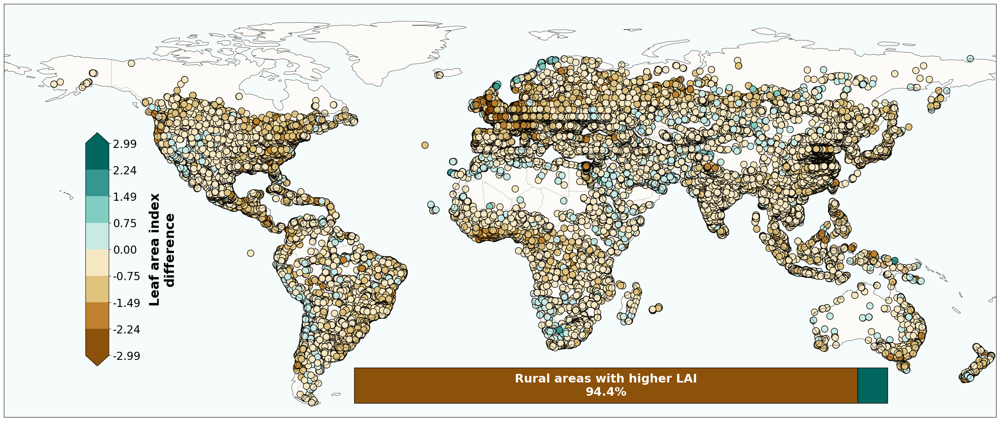

Histogram saved →  /content/Fig3B_hist.pdf


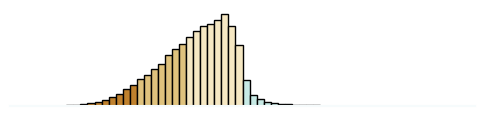

In [10]:
# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import sys
from pathlib import Path

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap

# ------------------------------------------------------------------
# CONFIG
# ------------------------------------------------------------------
OUTPUT_MAP   = Path("/content/Fig3B_map.pdf")
OUTPUT_HIST  = Path("/content/Fig3B_hist.pdf")
LAI_SCALE    = 10          # undo earlier ×10 scaling
TOP_N        = 83102        # keep N largest urban areas; set None to disable
NUM_BINS     = 60          # histogram bins

# ------------------------------------------------------------------
# 0.  FETCH THE SOURCE DATAFRAME
# ------------------------------------------------------------------
try:
    # If 'df' is already in memory, comment the next line and set plot_gdf = df.copy()
    df = pd.read_csv('/content/urbanRuralLAI_with_countries_global_ns_veg.csv')
    plot_gdf = df.copy()
except NameError:
    sys.exit("ERROR: DataFrame 'df' not found in the current namespace.")
except FileNotFoundError:
    sys.exit("ERROR: Source CSV file not found. Please check the path.")

# ------------------------------------------------------------------
# 1.  VALIDATE & CLEAN
# ------------------------------------------------------------------
required = ["lai_mean_urban", "lai_mean_rural", "lat", "lon", "Urban_Area"]
missing  = [c for c in required if c not in plot_gdf.columns]
if missing:
    sys.exit(f"ERROR: Missing columns {missing!r} in the DataFrame.")

num_cols = ["lai_mean_urban", "lai_mean_rural", "Urban_Area"]
plot_gdf[num_cols] = plot_gdf[num_cols].apply(pd.to_numeric, errors="coerce")
plot_gdf = plot_gdf.dropna(subset=required)
if plot_gdf.empty:
    sys.exit("ERROR: DataFrame empty after dropping NaNs.")

# ------------------------------------------------------------------
# 2.  RESCALE LAI & KEEP TOP-N
# ------------------------------------------------------------------
plot_gdf[["lai_mean_urban", "lai_mean_rural"]] /= LAI_SCALE

if TOP_N is not None:
    plot_gdf = plot_gdf.nlargest(TOP_N, "Urban_Area").copy()
    if plot_gdf.empty:
        sys.exit(f"ERROR: No rows returned by nlargest({TOP_N}).")

# ------------------------------------------------------------------
# 3.  DIFFERENCE & DROP EXACT 0s
# ------------------------------------------------------------------
plot_gdf["lai_difference"] = plot_gdf["lai_mean_urban"] - plot_gdf["lai_mean_rural"]
before_drop = len(plot_gdf)
plot_gdf = plot_gdf[plot_gdf["lai_difference"].ne(0)]
print(f"Dropped {before_drop - len(plot_gdf):,} rows where lai_difference == 0")

if plot_gdf.empty:
    sys.exit("ERROR: All rows removed after filtering out zeros.")

# ------------------------------------------------------------------
# 4.  GEO DATAFRAME
# ------------------------------------------------------------------
plot_gdf = gpd.GeoDataFrame(
    plot_gdf,
    geometry=gpd.points_from_xy(plot_gdf["lon"], plot_gdf["lat"]),
    crs="EPSG:4326",
)

# ------------------------------------------------------------------
# 5.  SUMMARY STATS
# ------------------------------------------------------------------
stats = plot_gdf["lai_difference"].agg(["max", "min", "mean", "median", "std"])
print("\nLAI-difference stats:")
for k, v in stats.items():
    print(f"{k.title():<6}: {v: .4f}")

# ------------------------------------------------------------------
# 6.  COLOUR PALETTE & LEGEND BOUNDS (0 as boundary)
# ------------------------------------------------------------------
# Use an EVEN number of colors so 0 is an internal boundary between negative/positive.
DIVERGING_COLS = [
    '#8c510a', '#bf812d', '#dfc27d', '#f6e8c3',  # negatives (rural > urban)
    '#c7eae5', '#80cdc1', '#35978f', '#01665e'   # positives (urban > rural)
]
palette = DIVERGING_COLS
n_col = len(palette)

min_d, max_d = float(stats["min"]), float(stats["max"])
abs_max = max(abs(min_d), abs(max_d))
if abs_max == 0:
    sys.exit("ERROR: All differences are zero; cannot build a diverging scale.")

# Discrete class boundaries spanning [-abs_max, +abs_max]; 0 is one of the boundaries.
bounds = np.linspace(-abs_max, abs_max, n_col + 1)

cmap_disc = ListedColormap(palette)
norm      = BoundaryNorm(bounds, ncolors=n_col, clip=False)
# Continuous version still defined if you want it elsewhere, but not used in the hist
cmap_cont = LinearSegmentedColormap.from_list("lai_cont", palette, N=256)

def _fmt_tick(x: float) -> str:
    # Signed ticks; center shows 0.00
    return "0.00" if np.isclose(x, 0.0) else f"{x:.2f}"

# ------------------------------------------------------------------
# 7.  MAP + PERCENTAGE BAR
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(30, 20),
                       subplot_kw={"projection": ccrs.PlateCarree()})

ax.add_feature(cfeature.LAND,  facecolor="#fcfbf7")
ax.add_feature(cfeature.OCEAN, facecolor="lightblue", alpha=0.1)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS,  linewidth=0.5, linestyle=":")

sc = ax.scatter(
    plot_gdf["lon"], plot_gdf["lat"],
    c=plot_gdf["lai_difference"],
    cmap=cmap_disc, norm=norm,
    s=150, edgecolors="black", linewidths=1,
    transform=ccrs.PlateCarree(), alpha=1,
)

# Colorbar: use class boundaries so 0.00 appears exactly at the center boundary
cbar_ax = fig.add_axes([0.17, 0.3, 0.02, 0.3])
cbar = plt.colorbar(sc, cax=cbar_ax, orientation="vertical",
                    extend="both", boundaries=bounds, spacing="proportional")
cbar.set_label("Leaf area index\ndifference", fontsize=24, labelpad=15, weight="bold")
cbar.ax.tick_params(labelsize=20)

# Ticks at the boundaries (includes 0)
cbar.set_ticks(bounds)
cbar.set_ticklabels([_fmt_tick(t) for t in bounds])

# Map extent
ax.set_extent([-180, 180, -60, 90])

# Percent bar
urban_gt = int((plot_gdf["lai_difference"] > 0).sum())
rural_gt = int((plot_gdf["lai_difference"] < 0).sum())
total    = len(plot_gdf)
urban_pct, rural_pct = (urban_gt / total) * 100.0, (rural_gt / total) * 100.0

bar_ax = fig.add_axes([0.40, 0.25, 0.48, 0.05]); bar_ax.set_axis_off()
# Brown (negatives) then Green (positives)
bar_ax.barh(["Cities"], [rural_pct], color='#8c510a', edgecolor="black", height=0.4)
bar_ax.barh(["Cities"], [urban_pct], color='#01665e', edgecolor="black",
            height=0.4, left=rural_pct)

if rural_pct > 1:
    bar_ax.text(rural_pct / 2, 0, f"Rural areas with higher LAI\n{rural_pct:.1f}%",
                ha="center", va="center", fontsize=22, color="white", weight="bold")

plt.subplots_adjust(left=0.10, right=0.95, top=0.95, bottom=0.05)

try:
    plt.savefig(OUTPUT_MAP, dpi=400, bbox_inches="tight", format="pdf", transparent=True)
    print(f"\nMap saved  →  {OUTPUT_MAP.resolve()}")
except Exception as e:
    print(f"ERROR saving map: {e}")
plt.show()

# ------------------------------------------------------------------
# 8.  DISCRETE HISTOGRAM (shares the same bounds & classes)
# ------------------------------------------------------------------
def frequency_histogram_discrete(series, bounds_arr, cmap_disc_obj, norm_disc_obj,
                                 bins, out_path: Path):
    """
    Minimalist histogram coloured by the SAME discrete classes as the map.

    - Values outside [bounds_arr[0], bounds_arr[-1]] are dropped.
    - Each bar is assigned exactly one of the discrete colors from cmap_disc_obj,
      via BoundaryNorm (same as the map/colorbar).
    """
    data = pd.to_numeric(series, errors="coerce").replace(
        [np.inf, -np.inf], np.nan
    ).dropna()
    data = data[(data >= bounds_arr[0]) & (data <= bounds_arr[-1])]
    if data.empty:
        print("No data inside bounds – histogram skipped.")
        return

    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(
        data,
        bins=np.linspace(bounds_arr[0], bounds_arr[-1], bins + 1),
        edgecolor="black",
        linewidth=1,
    )

    # DISCRETE: color each bar by the class of its midpoint
    for patch, left, right in zip(patches, edges[:-1], edges[1:]):
        mid = 0.5 * (left + right)
        patch.set_facecolor(cmap_disc_obj(norm_disc_obj(mid)))

    ax.set_xticks([]); ax.set_yticks([])
    for s in ax.spines.values():
        s.set_visible(False)
    ax.spines["bottom"].set_visible(True)
    ax.spines["bottom"].set_color("#f6fbfc")
    ax.spines["bottom"].set_linewidth(1.5)
    fig.patch.set_alpha(0); ax.patch.set_alpha(0)

    try:
        fig.savefig(out_path, bbox_inches="tight", format="pdf", transparent=True)
        print(f"Histogram saved →  {out_path.resolve()}")
    except Exception as e:
        print(f"ERROR saving histogram: {e}")
    plt.show()

frequency_histogram_discrete(
    plot_gdf["lai_difference"],
    bounds_arr=bounds,
    cmap_disc_obj=cmap_disc,
    norm_disc_obj=norm,
    bins=NUM_BINS,
    out_path=OUTPUT_HIST
)


###urban rural country differences

Dropped 108 rows with zero LAI
Keeping 166 countries with ≥1 cities
Styled map saved → /content/EDFig2D_map.pdf


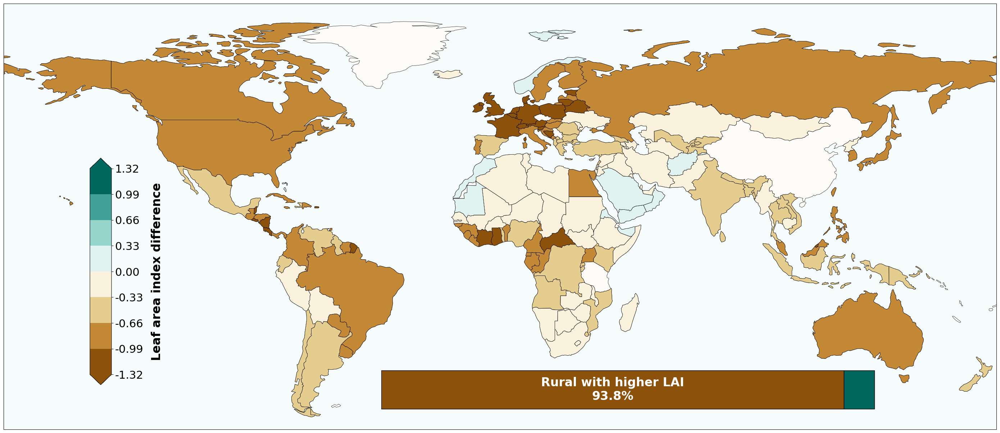

Styled histogram saved → /content/EDFig2D_hist.pdf


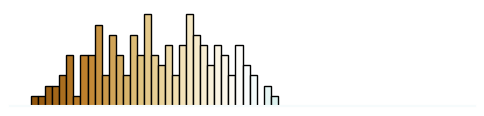

In [11]:
# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from matplotlib.cm import ScalarMappable

# ------------------------------------------------------------------
# CONFIGURATION – adjust paths & parameters here
# ------------------------------------------------------------------
CSV_PATH    = Path('/content/urbanRuralLAI_with_countries_global_ns_veg.csv')
SHAPE_PATH  = Path('/content/ne_110m_admin_0_countries.shp')

OUT_DIR     = Path('/content/')
OUT_MAP     = OUT_DIR / 'EDFig2D_map.pdf'
OUT_HIST    = OUT_DIR / 'EDFig2D_hist.pdf'

LAI_SCALE        = 10        # undo ×10 scaling
MIN_CITIES       = 1         # minimum city count per country
NUM_COLOR_BINS   = 8         # *even* number yields symmetric bins
NUM_HIST_BINS    = 60
EPS_TIE          = 1e-9      # tolerance for declaring a tie (mean_lai_diff ~ 0)

# Diverging palette (brown ↔ white ↔ green, 9 tones incl. centre)
DIVERGING_COLS = [
    '#8c510a', '#bf812d', '#dfc27d', '#f6e8c3',
    '#ffffff',          # exact centre (0)
    '#c7eae5', '#80cdc1', '#35978f', '#01665e'
]
COLOR_RURAL_GREENER = DIVERGING_COLS[0]   # dark brown
COLOR_URBAN_GREENER = DIVERGING_COLS[-1]  # dark green
COLOR_TIES          = '#d9d9d9'           # neutral grey for ties

MAP_TITLE = 'Mean Urban – Rural LAI Difference by Country (scaled ÷10)'

# ------------------------------------------------------------------
# HELPER – standardise names for merging
# ------------------------------------------------------------------
def _std_name(series: pd.Series) -> pd.Series:
    return (series.astype(str).str.lower()
                         .str.replace("&", "and")
                         .str.replace("-", " ")
                         .str.replace("[.,]", "", regex=True)
                         .str.strip())

# ------------------------------------------------------------------
# 1. LOAD CSV + PREP
# ------------------------------------------------------------------
if not CSV_PATH.is_file():
    sys.exit(f"ERROR: CSV not found → {CSV_PATH}")

try:
    df = pd.read_csv(CSV_PATH, low_memory=False)
except Exception as e:
    sys.exit(f"ERROR: failed to read CSV → {e}")

REQ = ['lai_mean_urban', 'lai_mean_rural', 'NAME_EN']
missing = [c for c in REQ if c not in df.columns]
if missing:
    sys.exit(f"ERROR: missing column(s) {missing!r} in CSV")

# Rescale, ensure numeric
for col in ('lai_mean_urban', 'lai_mean_rural'):
    df[col] = pd.to_numeric(df[col], errors='coerce')

df.dropna(subset=REQ, inplace=True)
df['lai_urban_scaled'] = df['lai_mean_urban'] / LAI_SCALE
df['lai_rural_scaled'] = df['lai_mean_rural'] / LAI_SCALE
df['lai_diff'] = df['lai_urban_scaled'] - df['lai_rural_scaled']

# Remove rows with all-zero LAI (rare but safe)
before = len(df)
df = df[(df['lai_urban_scaled'] != 0) | (df['lai_rural_scaled'] != 0)]
print(f"Dropped {before - len(df):,} rows with zero LAI")

# ------------------------------------------------------------------
# 2. REQUIRE MIN_CITIES PER COUNTRY & AGGREGATE
# ------------------------------------------------------------------
city_counts = df['NAME_EN'].value_counts()
countries_ok = city_counts[city_counts >= MIN_CITIES].index
print(f"Keeping {len(countries_ok)} countries with ≥{MIN_CITIES} cities")

lai_country = (df[df['NAME_EN'].isin(countries_ok)]
                 .groupby('NAME_EN', as_index=False)['lai_diff']
                 .mean()
                 .rename(columns={'lai_diff': 'mean_lai_diff'}))

if lai_country.empty:
    sys.exit("ERROR: No countries remain after applying MIN_CITIES.")

# ------------------------------------------------------------------
# 3. LOAD WORLD SHAPEFILE & MERGE
# ------------------------------------------------------------------
if not SHAPE_PATH.is_file():
    sys.exit(f"ERROR: shapefile not found → {SHAPE_PATH}")

try:
    world = gpd.read_file(SHAPE_PATH)
except Exception as e:
    sys.exit(f"ERROR: failed to read shapefile → {e}")

world = world[world.get('ADMIN', '') != 'Antarctica']   # remove Antarctica

lai_country['std_name'] = _std_name(lai_country['NAME_EN'])
world['std_name'] = _std_name(world.get('ADMIN', world.get('NAME_EN')))

merged = world.merge(lai_country[['std_name', 'mean_lai_diff']],
                     how='left', on='std_name').dropna(subset=['mean_lai_diff'])

if merged.empty:
    sys.exit("ERROR: no countries matched between CSV and shapefile.")

# ------------------------------------------------------------------
# 4. DISCRETE DIVERGING COLOUR SCALE
# ------------------------------------------------------------------
vals = merged['mean_lai_diff'].to_numpy()
abs_lim = np.percentile(np.abs(vals), 95)  # clip extreme outliers
abs_lim = max(abs_lim, 0.1)               # avoid zero span

bounds = np.linspace(-abs_lim, abs_lim, NUM_COLOR_BINS + 1)
cmap   = LinearSegmentedColormap.from_list('lai_div', DIVERGING_COLS, N=256)
norm   = BoundaryNorm(bounds, ncolors=256)

# ------------------------------------------------------------------
# 5. CHOROPLETH MAP
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(30, 18),
                       subplot_kw={'projection': ccrs.PlateCarree()})

# Aesthetic base layers
ax.add_feature(cfeature.LAND, facecolor='#fcfbf7', zorder=0)
ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.10, zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

merged.plot(column='mean_lai_diff', cmap=cmap, norm=norm,
            ax=ax, edgecolor='black', linewidth=0.4,
            missing_kwds={'color': 'lightgrey', 'label': 'No data'})

ax.set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())

# Colour-bar – placed left to mirror reference chart
cbar_ax = fig.add_axes([0.13, 0.23, 0.02, 0.35])
sm = ScalarMappable(norm=norm, cmap=cmap); sm._A = []
cbar = plt.colorbar(sm, cax=cbar_ax, orientation='vertical', extend='both')
cbar.set_label('Leaf area index difference', fontsize=24, labelpad=15, fontweight='bold')
cbar.set_ticks(bounds)
cbar.set_ticklabels([f'{b:.2f}' for b in bounds])
cbar.ax.tick_params(labelsize=22)

# ------------------------------------------------------------------
# 5a. INSET STACKED BAR – % COUNTRIES (RURAL-GREENER | TIES | URBAN-GREENER)
# ------------------------------------------------------------------
try:
    stats_series = merged['mean_lai_diff'].dropna().to_numpy()
    total_ctry = stats_series.size
    if total_ctry == 0:
        raise ValueError("No valid country differences to summarise.")

    # classify with tolerance EPS_TIE
    rural_mask = stats_series < -EPS_TIE
    urban_mask = stats_series >  EPS_TIE
    tie_mask   = ~rural_mask & ~urban_mask

    n_rural = int(rural_mask.sum())
    n_urban = int(urban_mask.sum())
    n_ties  = int(tie_mask.sum())

    pct_rural = n_rural / total_ctry * 100.0
    pct_urban = n_urban / total_ctry * 100.0
    pct_ties  = n_ties  / total_ctry * 100.0

    if (pct_rural + pct_urban + pct_ties) <= 0:
        raise ValueError("All country differences are invalid – nothing to plot.")

    # Inset location (tucked under the map, right side)
    bax = fig.add_axes([0.4, 0.19, 0.48, 0.065])  # identical to reference example
    bax.set_axis_off()

    # Left segment: Rural-greener
    bax.barh(["Countries"], [pct_rural], color=COLOR_RURAL_GREENER,
             edgecolor='black', height=0.45, zorder=3)
    # Middle segment: Ties (if any)
    if pct_ties > 0:
        bax.barh(["Countries"], [pct_ties], color=COLOR_TIES,
                 edgecolor='black', height=0.45, left=pct_rural, zorder=3)
        right_start = pct_rural + pct_ties
    else:
        right_start = pct_rural
    # Right segment: Urban-greener
    bax.barh(["Countries"], [pct_urban], color=COLOR_URBAN_GREENER,
             edgecolor='black', height=0.45, left=right_start, zorder=3)

    # Labels (centered in each segment if the segment exists)
    if pct_rural > 0:
        bax.text(pct_rural/2, 0,
                 f"Rural with higher LAI\n{pct_rural:.1f}%",
                 ha='center', va='center', fontsize=24, color='white', weight='bold')
    if pct_ties > 0:
        bax.text(pct_rural + pct_ties/2, 0,
                 f"Tie\n{pct_ties:.1f}% (n={n_ties})",
                 ha='center', va='center', fontsize=24, color='black', weight='bold')
    if pct_urban > 0:
        bax.text(right_start + pct_urban/2, 0,
                 f"",
                 ha='center', va='center', fontsize=24, color='white', weight='bold')

    # # Slim frame line to anchor the graphic visually
    # bax.plot([0, 100], [0.23, 0.23], lw=1.2, color='#f0f0f0')
    # # Add an overall annotation
    # bax.text(0, 0.95,
    #          f"% of countries (n={total_ctry})",
    #          ha='left', va='bottom', fontsize=18, color='black', weight='bold',
    #          transform=bax.transData)

except Exception as e:
    print(f"[WARN] Inset bar skipped: {e}", file=sys.stderr)

# ------------------------------------------------------------------
# 6. MINIMALIST HISTOGRAM (colour-matched)
# ------------------------------------------------------------------
def minimalist_hist(series: pd.Series, bounds_arr, bins, cmap_obj, path):
    series = series[(series >= bounds_arr[0]) & (series <= bounds_arr[-1])]
    if series.empty:
        print("[WARN] Histogram skipped – no data in range."); return

    norm_h = plt.Normalize(vmin=bounds_arr[0], vmax=bounds_arr[-1])
    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(
        series,
        bins=np.linspace(bounds_arr[0], bounds_arr[-1], bins + 1),
        edgecolor='black', linewidth=1
    )

    for p, l, r in zip(patches, edges[:-1], edges[1:]):
        p.set_facecolor(cmap_obj(norm_h((l + r) / 2)))

    # Strip axes for minimalist look
    ax.set_xticks([]); ax.set_yticks([])
    for s in ax.spines.values():
        s.set_visible(False)
    ax.spines['bottom'].set_visible(True)
    ax.spines['bottom'].set_color('#f6fbfc')
    ax.spines['bottom'].set_linewidth(1.5)

    fig.patch.set_alpha(0); ax.patch.set_alpha(0)
    plt.savefig(path, dpi=300, bbox_inches='tight',
                format='png', transparent=True)
    print(f"Styled histogram saved → {Path(path).resolve()}")
    plt.show()

# ------------------------------------------------------------------
# 7. SAVE FIGURE & HISTOGRAM
# ------------------------------------------------------------------
plt.subplots_adjust(left=0.05, right=0.97, top=0.93, bottom=0.05)
OUT_DIR.mkdir(parents=True, exist_ok=True)
plt.savefig(OUT_MAP, dpi=400, bbox_inches='tight',
            format='png', transparent=True)
print(f"Styled map saved → {OUT_MAP.resolve()}")
plt.show()

minimalist_hist(
    merged['mean_lai_diff'],
    bounds_arr=bounds,
    bins=NUM_HIST_BINS,
    cmap_obj=cmap,
    path=OUT_HIST
)


In [21]:
import sys
from pathlib import Path

import numpy as np
import pandas as pd

# ------------------------------------------------------------------
# CONFIGURATION
# ------------------------------------------------------------------
CSV_PATH   = Path("/content/urbanRuralLAI_with_countries_global_ns_veg.csv")
LAI_SCALE  = 10      # to undo ×10 scaling
MIN_CITIES = 1       # minimum cities per country

REQ_COLS = [
    "lai_mean_urban",
    "lai_mean_rural",
    "Urban_Area",
    "Rural_area",
    "NAME_EN"
]

def main():
    # 1. LOAD CSV
    if not CSV_PATH.is_file():
        sys.exit(f"ERROR: CSV not found at '{CSV_PATH}'")
    try:
        df = pd.read_csv(CSV_PATH, low_memory=False)
    except Exception as e:
        sys.exit(f"ERROR: failed to read CSV → {e}")

    # 2. VALIDATE COLUMNS
    missing = [c for c in REQ_COLS if c not in df.columns]
    if missing:
        sys.exit(f"ERROR: missing required column(s): {missing!r}")

    # 3. TYPE COERCION & DROP NaNs
    for col in REQ_COLS:
        if col != "NAME_EN":
            df[col] = pd.to_numeric(df[col], errors="coerce")
    df.dropna(subset=REQ_COLS, inplace=True)
    if df.empty:
        sys.exit("ERROR: no valid rows after dropping NaNs in required columns")

    # 4. RESCALE MEAN LAI & COMPUTE TOTAL LAI
    df["lai_u"] = df["lai_mean_urban"] / LAI_SCALE
    df["lai_r"] = df["lai_mean_rural"] / LAI_SCALE
    df["total_lai_u"] = df["lai_u"] * df["Urban_Area"]
    df["total_lai_r"] = df["lai_r"] * df["Rural_area"]

    # 5. ADJUST AREAS FOR WATER COVER
    df["urban_area_adj"] = df["total_lai_u"]
    df["rural_area_adj"] = df["total_lai_r"]

    # 6. DROP NON‑POSITIVE ADJUSTED AREAS
    mask_bad = (df["urban_area_adj"] <= 0) | (df["rural_area_adj"] <= 0)
    if mask_bad.any():
        print(f"WARNING: dropping {mask_bad.sum()} rows with non‑positive adjusted area")
        df = df.loc[~mask_bad]
    if df.empty:
        sys.exit("ERROR: no data left after dropping non‑positive adjusted areas")

    # 7. RECALCULATE MEAN LAI ON ADJUSTED AREAS
    df["lai_mean_u_adj"] = df["urban_area_adj"]
    df["lai_mean_r_adj"] = df["rural_area_adj"]

    # 8. COMPUTE URBAN–RURAL DIFFERENCE
    df["lai_mean_diff"] = df["lai_mean_u_adj"] - df["lai_mean_r_adj"]

    # 9. FILTER BY MIN_CITIES
    country_counts = df["NAME_EN"].value_counts()
    valid_countries = country_counts[country_counts >= MIN_CITIES].index
    df = df[df["NAME_EN"].isin(valid_countries)]
    if df.empty:
        sys.exit("ERROR: no countries left after applying MIN_CITIES filter")

    # 10. AGGREGATE TO COUNTRY MEAN Δ
    country_means = (
        df.groupby("NAME_EN", as_index=False)["lai_mean_diff"]
          .mean()
          .rename(columns={"lai_mean_diff": "country_mean_diff"})
    )
    n_countries = len(country_means)
    print(f"\nComputed mean ΔLAI (adjusted‑area) for {n_countries} countries.\n")

    # 11. RANKING
    cm_sorted = country_means.sort_values("country_mean_diff", ascending=False)
    top3    = cm_sorted.head(3)
    bottom3 = cm_sorted.tail(3)

    print("="*60)
    print("MEAN URBAN–RURAL LAI DIFFERENCE (ADJUSTED AREA)")
    print("Positive → urban > rural; Negative → rural > urban")
    print("="*60, "\n")

    print("--- Top 3 Countries (urban >> rural) ---")
    print(top3.to_string(index=False), "\n")

    print("--- Bottom 3 Countries (rural >> urban) ---")
    print(bottom3.to_string(index=False), "\n")

    # 12. GLOBAL STATISTICS
    diffs = country_means["country_mean_diff"]
    mean_val = diffs.mean()
    sd_val   = diffs.std(ddof=1)
    vmin, vmax = diffs.min(), diffs.max()
    pct_pos = (diffs > 0).mean() * 100

    print("="*60)
    print("GLOBAL SUMMARY")
    print(f"Mean ΔLAI: {mean_val:.6e} ± {sd_val:.6e} (±1 s.d.)")
    print(f"Range: {vmin:.6e} to {vmax:.6e}")
    print(f"Urban > Rural in {pct_pos:.1f}% of countries")
    print("="*60)

if __name__ == "__main__":
    main()



Computed mean ΔLAI (adjusted‑area) for 166 countries.

MEAN URBAN–RURAL LAI DIFFERENCE (ADJUSTED AREA)
Positive → urban > rural; Negative → rural > urban

--- Top 3 Countries (urban >> rural) ---
   NAME_EN  country_mean_diff
      Oman      132973.324458
Somaliland      110333.765849
   Eritrea      -62630.373952 

--- Bottom 3 Countries (rural >> urban) ---
      NAME_EN  country_mean_diff
Guinea-Bissau      -1.735850e+07
   Costa Rica      -1.803801e+07
        Japan      -1.911308e+07 

GLOBAL SUMMARY
Mean ΔLAI: -5.820415e+06 ± 4.136771e+06 (±1 s.d.)
Range: -1.911308e+07 to 1.329733e+05
Urban > Rural in 1.2% of countries


In [24]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd

# ------------------------------------------------------------------
# CONFIG – paths are set for Google Colab
# ------------------------------------------------------------------
CSV_PATH      = '/content/urbanRuralLAI_with_countries_veg.csv'
SHAPE_PATH    = '/content/ne_110m_admin_0_countries.shp'
LAI_SCALE     = 10     # undo earlier ×10 scaling
MIN_CITIES    = 1      # minimum number of cities per country
ALPHA         = 0.05   # (unused here but kept for compatibility)

# ------------------------------------------------------------------
# 1. LOAD CSV AND PREPARE DATA
# ------------------------------------------------------------------
print(f"Loading data → {CSV_PATH}")
if not Path(CSV_PATH).exists():
    sys.exit("ERROR: CSV file not found. Please upload "
             "'urbanRuralLAI_with_countries_veg.csv' to your Colab session.")

try:
    df = pd.read_csv(CSV_PATH, low_memory=False)
except Exception as e:
    sys.exit(f"ERROR: failed to read CSV: {e}")

# Required columns for area-weighted LAI
required_cols = [
    'NAME_EN',
    'lai_mean_urban',
    'lai_mean_rural',
    'Urban_Area',
    'Rural_area'
]

missing = [c for c in required_cols if c not in df.columns]
if missing:
    sys.exit(f"ERROR: CSV is missing required columns: {missing}")

# Scale LAI back to original units
df['lai_urban_scaled'] = df['lai_mean_urban'] / LAI_SCALE
df['lai_rural_scaled'] = df['lai_mean_rural'] / LAI_SCALE

# Drop rows where urban LAI is 0 (typically unobserved/masked)
df = df[df['lai_urban_scaled'].ne(0)]

# Ensure numeric types for areas and LAI
for col in ['lai_urban_scaled', 'lai_rural_scaled', 'Urban_Area', 'Rural_area']:
    df[col] = pd.to_numeric(df[col], errors='coerce')

df = df.dropna(subset=['lai_urban_scaled', 'lai_rural_scaled',
                       'Urban_Area', 'Rural_area'])

# ------------------------------------------------------------------
# 2. AGGREGATE AREA-WEIGHTED LAI PER COUNTRY (URBAN & RURAL)
# ------------------------------------------------------------------
# Filter countries by minimum number of cities
city_counts = df['NAME_EN'].value_counts()
countries_to_keep = city_counts[city_counts >= MIN_CITIES].index
df_filtered = df[df['NAME_EN'].isin(countries_to_keep)].copy()

def _safe_area_weighted_mean(values: pd.Series, areas: pd.Series) -> float:
    """
    Compute area-weighted mean with basic robustness:
    - Drops NaNs and non-positive areas.
    - Returns np.nan if no valid data.
    """
    try:
        mask = (values.notna() &
                areas.notna() &
                (areas > 0))
        if not mask.any():
            return np.nan
        v = values[mask]
        a = areas[mask]
        denom = a.sum()
        if denom <= 0:
            return np.nan
        return float((v * a).sum() / denom)
    except Exception:
        return np.nan

def _country_agg(group: pd.DataFrame) -> pd.Series:
    """
    Per-country aggregation:
      - Unweighted mean urban/rural LAI
      - Area-weighted mean urban/rural LAI
      - Number of cities contributing
    """
    lai_u = group['lai_urban_scaled']
    lai_r = group['lai_rural_scaled']
    au    = group['Urban_Area']
    ar    = group['Rural_area']

    return pd.Series({
        'n_cities'           : int(len(group)),
        'mean_lai_urban'     : float(lai_u.mean(skipna=True)),
        'mean_lai_rural'     : float(lai_r.mean(skipna=True)),
        'lai_urban_aw'       : _safe_area_weighted_mean(lai_u, au),
        'lai_rural_aw'       : _safe_area_weighted_mean(lai_r, ar),
    })

print("Aggregating per-country LAI (unweighted and area-weighted)...")
country_lai = (
    df_filtered
    .groupby('NAME_EN', as_index=False)
    .apply(_country_agg)
    .reset_index(drop=True)
)

# Keep only countries with positive area-weighted URBAN LAI
country_lai = country_lai[country_lai['lai_urban_aw'] > 0].copy()
print(f"Aggregated data for {len(country_lai):,} countries.")

# ------------------------------------------------------------------
# 3. GET TOP AND BOTTOM 3 COUNTRIES (BY AREA-WEIGHTED URBAN LAI)
# ------------------------------------------------------------------
country_lai_sorted = country_lai.sort_values(by='lai_urban_aw', ascending=False)

top_3_urban = country_lai_sorted.head(3)
bottom_3_urban = country_lai_sorted.tail(3)

print("\n" + "="*50)
print("ANALYSIS 1: AREA-WEIGHTED URBAN LAI (GREENNESS)")
print("="*50)
print("\n--- Top 3 Countries (Highest area-weighted Urban LAI) ---")
print(top_3_urban[['NAME_EN', 'lai_urban_aw', 'n_cities']].to_string(index=False))

print("\n--- Bottom 3 Countries (Lowest area-weighted Urban LAI) ---")
print(bottom_3_urban[['NAME_EN', 'lai_urban_aw', 'n_cities']].to_string(index=False))
print("\n" + "="*50 + "\n")

# (Optional) you can also inspect rural:
print("Example area-weighted rural LAI for top 3 urban countries:")
print(top_3_urban[['NAME_EN', 'lai_rural_aw']].to_string(index=False))

# ------------------------------------------------------------------
# 4. STATISTICAL SUMMARY FOR REPORTING
#    (USING AREA-WEIGHTED URBAN LAI PER COUNTRY)
# ------------------------------------------------------------------
print("Generating full statistical summary (area-weighted urban LAI)...")

if not Path(SHAPE_PATH).exists():
    sys.exit("ERROR: Shapefile not found. Please upload "
             "'ne_110m_admin_0_countries.shp' to your Colab session.")

try:
    world = gpd.read_file(SHAPE_PATH)
except Exception as e:
    sys.exit(f"ERROR: failed to read shapefile: {e}")

# Drop Antarctica
world = world[world['ADMIN'] != 'Antarctica'].copy()

def _std_name(series: pd.Series) -> pd.Series:
    """Standardizes country names for reliable merging."""
    return (series.astype(str)
                  .str.lower()
                  .str.replace("&", "and", regex=False)
                  .str.replace("-", " ", regex=False)
                  .str.replace(".", "", regex=False)
                  .str.replace(",", "", regex=False)
                  .str.strip())

country_lai['std_name'] = _std_name(country_lai['NAME_EN'])
world['std_name']       = _std_name(world['ADMIN'])

merged = (
    world
    .merge(country_lai[['std_name', 'lai_urban_aw']],
           how='left', on='std_name')
    .dropna(subset=['lai_urban_aw'])
)

n_final_countries = len(merged)
final_vals = merged['lai_urban_aw'].astype(float)

mean_val   = final_vals.mean()
std_val    = final_vals.std(ddof=1)
median_val = final_vals.median()
min_val    = final_vals.min()
max_val    = final_vals.max()

print(f"\nOverall statistics (area-weighted URBAN LAI) for {n_final_countries} countries:")
print(f"Mean ± s.d.: {mean_val:.2f} ± {std_val:.2f}")
print(f"Median    : {median_val:.2f}")
print(f"Range     : {min_val:.2f} to {max_val:.2f}")


Loading data → /content/urbanRuralLAI_with_countries_veg.csv
Aggregating per-country LAI (unweighted and area-weighted)...
Aggregated data for 166 countries.

ANALYSIS 1: AREA-WEIGHTED URBAN LAI (GREENNESS)

--- Top 3 Countries (Highest area-weighted Urban LAI) ---
         NAME_EN  lai_urban_aw  n_cities
          Norway      2.573561     461.0
Papua New Guinea      1.591177      31.0
     Puerto Rico      1.231924     126.0

--- Bottom 3 Countries (Lowest area-weighted Urban LAI) ---
     NAME_EN  lai_urban_aw  n_cities
Saudi Arabia      0.039808     267.0
       Qatar      0.037268      27.0
      Kuwait      0.011719      17.0


Example area-weighted rural LAI for top 3 urban countries:
         NAME_EN  lai_rural_aw
          Norway      2.579254
Papua New Guinea      2.021870
     Puerto Rico      2.701999
Generating full statistical summary (area-weighted urban LAI)...

Overall statistics (area-weighted URBAN LAI) for 160 countries:
Mean ± s.d.: 0.43 ± 0.33
Median    : 0.34
Rang

/tmp/ipython-input-599205087.py:115: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_country_agg)


In [25]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import sys
from pathlib import Path
import numpy as np
import pandas as pd

# ------------------------------------------------------------------
# CONFIG
# ------------------------------------------------------------------
CSV_PATH   = Path("/content/urbanRuralLAI_with_countries_veg.csv")
LAI_SCALE  = 10
MIN_CITIES = 1
REQ        = ["lai_mean_urban", "lai_mean_rural", "NAME_EN",
              "Urban_Area", "Rural_area"]  # added areas

# ------------------------------------------------------------------
# 1. LOAD & CLEAN DATA
# ------------------------------------------------------------------
print(f"Loading data → {CSV_PATH}")
if not CSV_PATH.exists():
    sys.exit("ERROR: CSV file not found. Please upload "
             "'urbanRuralLAI_with_countries_veg.csv' to your Colab session.")

try:
    df = pd.read_csv(CSV_PATH)
except Exception as e:
    sys.exit(f"ERROR: failed to read CSV: {e}")

# Check required columns
missing = [c for c in REQ if c not in df.columns]
if missing:
    sys.exit(f"ERROR: CSV is missing required columns: {missing}")

# Drop NaNs in required cols
df = df.dropna(subset=REQ).copy()

# Ensure numeric types
for col in ["lai_mean_urban", "lai_mean_rural", "Urban_Area", "Rural_area"]:
    df[col] = pd.to_numeric(df[col], errors="coerce")
df = df.dropna(subset=["lai_mean_urban", "lai_mean_rural", "Urban_Area", "Rural_area"])

# Remove non-positive areas (degenerate weights)
df = df[(df["Urban_Area"] > 0) & (df["Rural_area"] > 0)].copy()

# Rescale & compute per-row ΔLAI
df["lai_u"]    = df["lai_mean_urban"] / LAI_SCALE
df["lai_r"]    = df["lai_mean_rural"] / LAI_SCALE
df["lai_diff"] = df["lai_u"] - df["lai_r"]

# Combined area weight for Δ (urban + rural) – consistent with other scripts
df["w_area"] = df["Urban_Area"] + df["Rural_area"]

# Require ≥ MIN_CITIES per country
city_counts = df["NAME_EN"].value_counts()
eligible    = city_counts[city_counts >= MIN_CITIES].index
df = df[df["NAME_EN"].isin(eligible)].copy()

if df.empty:
    sys.exit("ERROR: No countries left after applying MIN_CITIES filter.")

# ------------------------------------------------------------------
# 2. AGGREGATE TO COUNTRY MEANS (UNWEIGHTED + AREA-WEIGHTED)
# ------------------------------------------------------------------
def _safe_area_weighted_mean(values: pd.Series, weights: pd.Series) -> float:
    """
    Robust area-weighted mean:
      - drops NaNs and non-positive weights
      - returns np.nan if nothing valid
    """
    try:
        mask = (
            values.notna()
            & weights.notna()
            & (weights > 0)
        )
        if not mask.any():
            return np.nan
        v = values[mask]
        w = weights[mask]
        denom = w.sum()
        if denom <= 0:
            return np.nan
        return float((v * w).sum() / denom)
    except Exception:
        return np.nan

def _country_agg(group: pd.DataFrame) -> pd.Series:
    """Per-country unweighted & area-weighted ΔLAI."""
    return pd.Series({
        "n_cities"           : int(len(group)),
        "country_mean_diff"  : float(group["lai_diff"].mean(skipna=True)),                 # unweighted mean
        "country_mean_diff_aw": _safe_area_weighted_mean(group["lai_diff"], group["w_area"])  # area-weighted
    })

country_means = (
    df.groupby("NAME_EN", as_index=False)
      .apply(_country_agg)
      .reset_index(drop=True)
)

# Drop countries with NaN area-weighted mean (just in case)
country_means = country_means.dropna(subset=["country_mean_diff_aw"]).copy()

print(f"Aggregated data for {len(country_means):,} countries.")

# ------------------------------------------------------------------
# 3. GET TOP AND BOTTOM 3 COUNTRIES (BY AREA-WEIGHTED ΔLAI)
# ------------------------------------------------------------------
country_means_sorted = country_means.sort_values(
    by="country_mean_diff_aw", ascending=False
)

top_3_diff    = country_means_sorted.head(3)
bottom_3_diff = country_means_sorted.tail(3)

print("\n" + "="*70)
print("ANALYSIS 2: AREA-WEIGHTED URBAN–RURAL LAI DIFFERENCE (ΔLAI)")
print("A positive value means cities are greener than the countryside.")
print("="*70)

print("\n--- Top 3 Countries (Cities MUCH GREENER than rural areas) ---")
print(
    top_3_diff[["NAME_EN", "n_cities",
                "country_mean_diff", "country_mean_diff_aw"]]
    .to_string(index=False)
)

print("\n--- Bottom 3 Countries (Rural areas MUCH GREENER than cities) ---")
print(
    bottom_3_diff[["NAME_EN", "n_cities",
                   "country_mean_diff", "country_mean_diff_aw"]]
    .to_string(index=False)
)
print("\n" + "="*70 + "\n")

# ------------------------------------------------------------------
# 4. STATISTICAL SUMMARY FOR REPORTING (AREA-WEIGHTED ΔLAI)
# ------------------------------------------------------------------
print("Generating full statistical summary (area-weighted ΔLAI)...")

vals = country_means["country_mean_diff_aw"].astype(float)
mean = vals.mean()
sd   = vals.std(ddof=1)
vmin = vals.min()
vmax = vals.max()
prop_positive = (vals > 0).mean() * 100

print(f"\nOverall statistics for {len(country_means)} countries:")
print(f"The mean country-level area-weighted ΔLAI was {mean:.2f} ± {sd:.2f} (mean ± s.d.).")
print(f"Country ΔLAI (area-weighted) ranged from {vmin:.2f} to {vmax:.2f}.")
print(f"Urban LAI exceeded rural values in {prop_positive:.1f}% of countries (area-weighted).")

# Optional: save table for downstream use
# OUT_TABLE = Path("/content/country_lai_diff_area_weighted.csv")
# country_means.to_csv(OUT_TABLE, index=False)
# print(f"\nSaved country table → {OUT_TABLE}")


Loading data → /content/urbanRuralLAI_with_countries_veg.csv


/tmp/ipython-input-361762899.py:30: DtypeWarning: Columns (37,39,40,42,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(CSV_PATH)


Aggregated data for 169 countries.

ANALYSIS 2: AREA-WEIGHTED URBAN–RURAL LAI DIFFERENCE (ΔLAI)
A positive value means cities are greener than the countryside.

--- Top 3 Countries (Cities MUCH GREENER than rural areas) ---
   NAME_EN  n_cities  country_mean_diff  country_mean_diff_aw
    Norway     461.0           0.197806              0.084902
      Oman      68.0           0.143797              0.056690
Somaliland      14.0           0.067667              0.036532

--- Bottom 3 Countries (Rural areas MUCH GREENER than cities) ---
       NAME_EN  n_cities  country_mean_diff  country_mean_diff_aw
   Netherlands     515.0          -1.614039             -1.667781
United Kingdom    1225.0          -1.527826             -1.670915
    Luxembourg      24.0          -1.610505             -1.735839


Generating full statistical summary (area-weighted ΔLAI)...

Overall statistics for 169 countries:
The mean country-level area-weighted ΔLAI was -0.66 ± 0.45 (mean ± s.d.).
Country ΔLAI (area-wei

/tmp/ipython-input-361762899.py:102: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_country_agg)


###urban country

Keeping 167 countries with ≥3 cities for analysis.


/tmp/ipython-input-320143122.py:154: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .groupby('NAME_EN', as_index=False).apply(_aggregate_country))



Top 3 — weighted URBAN LAI (μ̄_u)
     NAME_EN  n_cities  lai_urban_country
      Norway     461.0           2.573561
 Puerto Rico     126.0           1.231924
Sierra Leone      25.0           1.086273

Bottom 3 — weighted URBAN LAI (μ̄_u)
      NAME_EN  n_cities  lai_urban_country
         Fiji       3.0           0.000000
New Caledonia       3.0           0.000000
       Kuwait      18.0           0.011676

Top 3 — weighted RURAL LAI (μ̄_r)
    NAME_EN  n_cities  lai_rural_country
Puerto Rico     126.0           2.701999
    Ireland      97.0           2.619091
 Luxembourg      24.0           2.608939

Bottom 3 — weighted RURAL LAI (μ̄_r)
      NAME_EN  n_cities  lai_rural_country
         Fiji       3.0           0.000000
New Caledonia       3.0           0.000000
   Mauritania      47.0           0.046366

Most positive 3 — weighted (urban − rural) LAI (μ̄_Δ)
   NAME_EN  n_cities  lai_diff_country
    Norway     461.0          0.084902
      Oman      68.0          0.056690
Somali

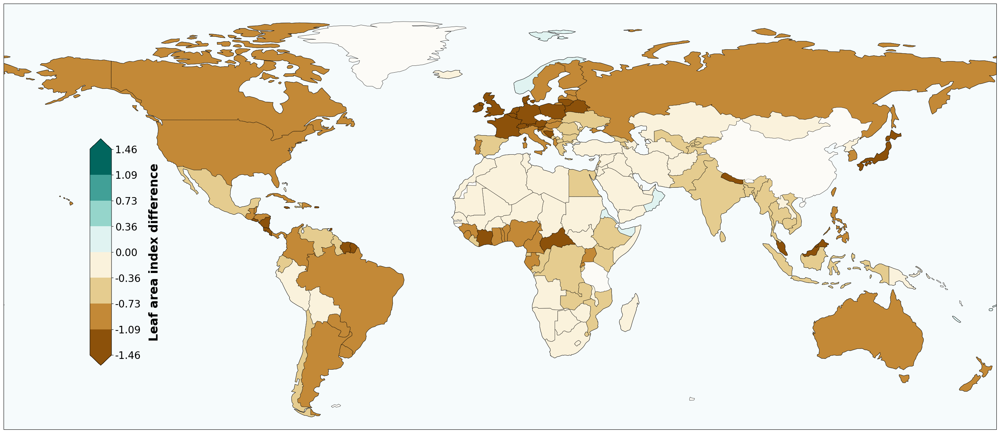

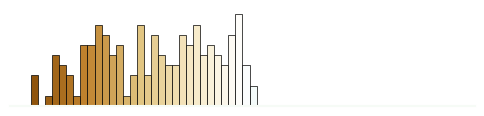

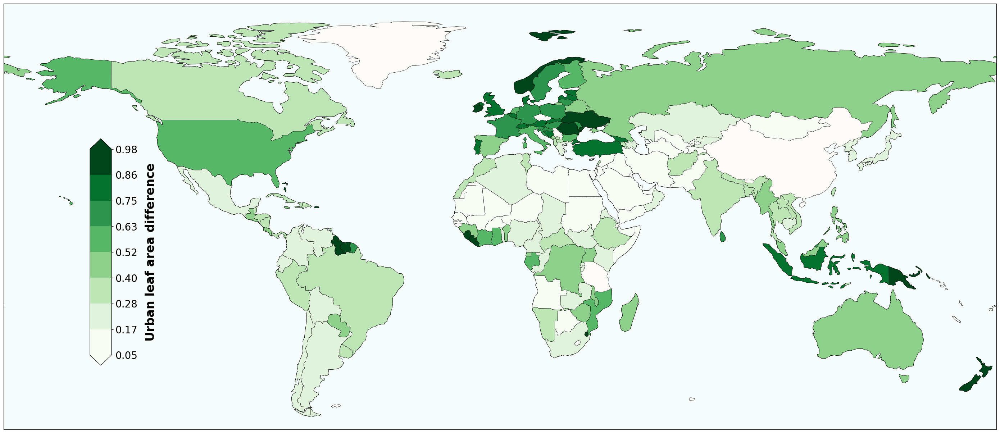

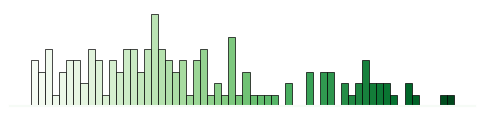

In [26]:
# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from matplotlib.cm import ScalarMappable

# ------------------------------ CONFIG ---------------------------------------
CSV_PATH    = Path('/content/urbanRuralLAI_with_countries_veg.csv')
SHAPE_PATH  = Path('/content/ne_110m_admin_0_countries.shp')

OUT_DIR        = Path('/content/')
OUT_MAP_DIFF   = str(OUT_DIR / 'Sup_LAI_country_diff_Map.pdf')
OUT_HIST_DIFF  = str(OUT_DIR / 'Sup_LAI_country_diff_Hist.pdf')
OUT_MAP_UABS   = str(OUT_DIR / 'Sup_LAI_country_abs_Map.pdf')
OUT_HIST_UABS  = str(OUT_DIR / 'Sup_LAI_country_abs_Hist.pdf')

LAI_SCALE       = 10   # set to 1 if your LAI is already unscaled
MIN_CITIES      = 3
NUM_COLOR_BINS  = 8
NUM_HIST_BINS   = 60

# Palettes (diverging for diff, sequential for absolute)
DIVERGING_COLS  = ['#8c510a','#bf812d','#dfc27d','#f6e8c3','#ffffff','#c7eae5','#80cdc1','#35978f','#01665e']
SEQUENTIAL_COLS = ['#f7fcf5','#e5f5e0','#c7e9c0','#a1d99b','#74c476','#41ab5d','#238b45','#006d2c','#00441b']

# ------------------------------ HELPERS --------------------------------------
def _std_name(series: pd.Series) -> pd.Series:
    return (series.str.lower()
                 .str.replace("&","and", regex=False)
                 .str.replace("-", " ", regex=False)
                 .str.replace(".", "",  regex=False)
                 .str.replace(",", "",  regex=False)
                 .str.strip())

def _kish_weighted_mean_se(x: np.ndarray, w: np.ndarray):
    """Return (mu_w, se_w, n_eff, n_raw, W_sum)."""
    x = np.asarray(x, float); w = np.asarray(w, float)
    m = np.isfinite(x) & np.isfinite(w) & (w > 0)
    x, w = x[m], w[m]
    n_raw = int(x.size)
    if n_raw == 0:
        return (np.nan, np.nan, 0.0, 0, 0.0)
    W = float(w.sum())
    mu_w = float((w * x).sum() / W)
    w2 = float((w * w).sum())
    n_eff = (W * W) / w2 if w2 > 0 else 0.0
    var_w = float((w * (x - mu_w) ** 2).sum() / W)
    se_w = float(np.sqrt(var_w / max(n_eff, 1.0))) if np.isfinite(var_w) else np.nan
    return (mu_w, se_w, n_eff, n_raw, W)

def _build_discrete_norm(bounds, colors):
    cmap = LinearSegmentedColormap.from_list('custom', colors, N=256)
    norm = BoundaryNorm(bounds, ncolors=256)
    return cmap, norm

def _styled_map(world_gdf, column, bounds, colors, out_path, label):
    cmap, norm = _build_discrete_norm(bounds, colors)
    fig, ax = plt.subplots(figsize=(30, 18),
                           subplot_kw={'projection': ccrs.PlateCarree()})
    ax.add_feature(cfeature.LAND, facecolor='#fcfbf7')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')

    world_gdf.plot(column=column, cmap=cmap, norm=norm,
                   ax=ax, edgecolor='black', linewidth=0.4,
                   missing_kwds={'color':'lightgrey','label':'No data'})

    ax.set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
    cbar_ax = fig.add_axes([0.13, 0.27, 0.02, 0.35])
    sm = ScalarMappable(norm=norm, cmap=cmap); sm._A = []
    cbar = plt.colorbar(sm, cax=cbar_ax, orientation='vertical', extend='both')
    cbar.set_label(label, fontsize=24, labelpad=15, fontweight='bold')
    cbar.set_ticks(bounds)
    cbar.set_ticklabels([f'{b:.2f}' for b in bounds])
    cbar.ax.tick_params(labelsize=20)

    plt.subplots_adjust(left=0.05, right=0.97, top=0.95, bottom=0.05)
    OUT_DIR.mkdir(parents=True, exist_ok=True)
    plt.savefig(out_path, dpi=400, bbox_inches='tight', format='pdf', transparent=True)
    plt.show()

def _minimalist_hist(series: pd.Series, bounds_arr, bins, colors, out_path):
    series = series[(series >= bounds_arr[0]) & (series <= bounds_arr[-1])]
    if series.empty:
        print("No data in histogram range – skipped."); return
    cmap, _ = _build_discrete_norm(bounds_arr, colors)
    norm_h = plt.Normalize(vmin=bounds_arr[0], vmax=bounds_arr[-1])
    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(series,
                                     bins=np.linspace(bounds_arr[0], bounds_arr[-1], bins + 1),
                                     edgecolor='black', linewidth=0.5)
    for p, l, r in zip(patches, edges[:-1], edges[1:]):
        p.set_facecolor(cmap(norm_h((l + r) / 2)))
    ax.set_xticks([]); ax.set_yticks([])
    for s in ax.spines.values(): s.set_visible(False)
    ax.spines['bottom'].set_visible(True); ax.spines['bottom'].set_color('#f6fbf6'); ax.spines['bottom'].set_linewidth(1.5)
    fig.patch.set_alpha(0); ax.patch.set_alpha(0)
    plt.savefig(out_path, dpi=400, bbox_inches='tight', format='pdf', transparent=True)
    plt.show()

# ------------------------------ LOAD & PREP ----------------------------------
if not CSV_PATH.is_file():
    sys.exit(f"ERROR: CSV not found → {CSV_PATH}")
df = pd.read_csv(CSV_PATH, low_memory=False)

REQ = ["lai_mean_urban","lai_mean_rural","Urban_Area","Rural_area","NAME_EN"]
missing = [c for c in REQ if c not in df.columns]
if missing:
    sys.exit(f"ERROR: missing column(s) {missing!r} in CSV")

for col in ["lai_mean_urban","lai_mean_rural","Urban_Area","Rural_area"]:
    df[col] = pd.to_numeric(df[col], errors='coerce')

df.dropna(subset=REQ, inplace=True)
df = df[(df["Urban_Area"] > 0) & (df["Rural_area"] > 0)].copy()

# Undo ×10 scale (if applicable)
df['lai_urban'] = df['lai_mean_urban'] / float(LAI_SCALE)
df['lai_rural'] = df['lai_mean_rural'] / float(LAI_SCALE)

# City-level values and weights
df['diff']   = df['lai_urban'] - df['lai_rural']
df['w_diff'] = df['Urban_Area'] + df['Rural_area']  # for diff weighting

# ------------------------- COUNTRY AGGREGATION (WEIGHTED) ---------------------
counts = df['NAME_EN'].value_counts()
countries_ok = counts[counts >= MIN_CITIES].index
print(f"Keeping {len(countries_ok)} countries with ≥{MIN_CITIES} cities for analysis.")

def _aggregate_country(g: pd.DataFrame) -> pd.Series:
    mu_u, se_u, n_eff_u, _, W_u = _kish_weighted_mean_se(g['lai_urban'].to_numpy(),
                                                         g['Urban_Area'].to_numpy())
    mu_r, se_r, n_eff_r, _, W_r = _kish_weighted_mean_se(g['lai_rural'].to_numpy(),
                                                         g['Rural_area'].to_numpy())
    mu_d, se_d, n_eff_d, n_raw, W_d = _kish_weighted_mean_se(g['diff'].to_numpy(),
                                                             g['w_diff'].to_numpy())
    return pd.Series({
        'lai_urban_country' : mu_u,  'lai_urban_se_country' : se_u, 'urban_neff_country' : n_eff_u, 'urban_W' : W_u,
        'lai_rural_country' : mu_r,  'lai_rural_se_country' : se_r, 'rural_neff_country' : n_eff_r, 'rural_W' : W_r,
        'lai_diff_country'  : mu_d,  'lai_diff_se_country'  : se_d, 'diff_neff_country'  : n_eff_d, 'diff_W'  : W_d,
        'n_cities'          : int(n_raw)
    })

country = (df[df['NAME_EN'].isin(countries_ok)]
           .groupby('NAME_EN', as_index=False).apply(_aggregate_country))

if country.empty:
    sys.exit("ERROR: No countries after weighted aggregation.")

# ------------------ PRINT REQUESTED TOP/BOTTOM SUMMARIES ----------------------
def _print_table(title: str, subdf: pd.DataFrame, cols: list[str]):
    print(f"\n{title}")
    print(subdf[cols].to_string(index=False))

# Top/Bottom by weighted urban LAI
urban_cols = ['NAME_EN','n_cities','lai_urban_country']
top3_urban = country.nlargest(3, 'lai_urban_country')[urban_cols]
bot3_urban = country.nsmallest(3, 'lai_urban_country')[urban_cols]
_print_table("Top 3 — weighted URBAN LAI (μ̄_u)", top3_urban, urban_cols)
_print_table("Bottom 3 — weighted URBAN LAI (μ̄_u)", bot3_urban, urban_cols)

# Top/Bottom by weighted rural LAI
rural_cols = ['NAME_EN','n_cities','lai_rural_country']
top3_rural = country.nlargest(3, 'lai_rural_country')[rural_cols]
bot3_rural = country.nsmallest(3, 'lai_rural_country')[rural_cols]
_print_table("Top 3 — weighted RURAL LAI (μ̄_r)", top3_rural, rural_cols)
_print_table("Bottom 3 — weighted RURAL LAI (μ̄_r)", bot3_rural, rural_cols)

# Most positive / most negative by weighted difference (urban − rural)
diff_cols = ['NAME_EN','n_cities','lai_diff_country']
pos3_diff = country.nlargest(3, 'lai_diff_country')[diff_cols]
neg3_diff = country.nsmallest(3, 'lai_diff_country')[diff_cols]
_print_table("Most positive 3 — weighted (urban − rural) LAI (μ̄_Δ)", pos3_diff, diff_cols)
_print_table("Most negative 3 — weighted (urban − rural) LAI (μ̄_Δ)", neg3_diff, diff_cols)

# ------------------ ACROSS-COUNTRY WEIGHTED SUMMARY (console) ----------------
u_series, u_wts = country['lai_urban_country'].astype(float), country['urban_W'].astype(float)
r_series, r_wts = country['lai_rural_country'].astype(float), country['rural_W'].astype(float)
d_series, d_wts = country['lai_diff_country'].astype(float), country['diff_W'].astype(float)

mu_u_w, se_u_w, n_eff_u_all, _, _ = _kish_weighted_mean_se(u_series.to_numpy(), u_wts.to_numpy())
mu_r_w, se_r_w, n_eff_r_all, _, _ = _kish_weighted_mean_se(r_series.to_numpy(), r_wts.to_numpy())
mu_d_w, se_d_w, n_eff_d_all, _, _ = _kish_weighted_mean_se(d_series.to_numpy(), d_wts.to_numpy())

print("\nAcross-country weighted means (console):")
print(f"  Urban μ̄_u={mu_u_w:.6f} (SE={se_u_w:.4f}, n_eff={n_eff_u_all:.1f})")
print(f"  Rural μ̄_r={mu_r_w:.6f} (SE={se_r_w:.4f}, n_eff={n_eff_r_all:.1f})")
print(f"  Diff  μ̄_Δ={mu_d_w:.6f} (SE={se_d_w:.4f}, n_eff={n_eff_d_all:.1f})")

# ------------------------------ MAPS (optional) ------------------------------
if not SHAPE_PATH.is_file():
    sys.exit(f"ERROR: shapefile not found → {SHAPE_PATH}")

world = gpd.read_file(SHAPE_PATH)
world = world[world.get('ADMIN', '') != 'Antarctica']
country['std_name'] = _std_name(country['NAME_EN'])
world['std_name']   = _std_name(world.get('ADMIN', world.get('NAME_EN')))

# Difference map (urban − rural)
merged_diff = world.merge(country[['std_name','lai_diff_country']], how='left', on='std_name').dropna(subset=['lai_diff_country'])
if not merged_diff.empty:
    vals_d = merged_diff['lai_diff_country'].to_numpy()
    abs_lim_d = max(np.percentile(np.abs(vals_d), 95), 0.1)
    bounds_d = np.linspace(-abs_lim_d, abs_lim_d, NUM_COLOR_BINS + 1)
    _styled_map(merged_diff, 'lai_diff_country', bounds_d, DIVERGING_COLS,
                out_path=OUT_MAP_DIFF, label='Leaf area index difference')
    _minimalist_hist(merged_diff['lai_diff_country'], bounds_d, NUM_HIST_BINS, DIVERGING_COLS, OUT_HIST_DIFF)
else:
    print("[WARN] No countries matched the shapefile for difference map.")

# Urban absolute LAI map
merged_uabs = world.merge(country[['std_name','lai_urban_country']], how='left', on='std_name').dropna(subset=['lai_urban_country'])
if not merged_uabs.empty:
    vals_u = merged_uabs['lai_urban_country'].to_numpy()
    low_u, high_u = np.percentile(vals_u, 5), np.percentile(vals_u, 95)
    bounds_u = np.linspace(low_u, high_u, NUM_COLOR_BINS + 1)
    _styled_map(merged_uabs, 'lai_urban_country', bounds_u, SEQUENTIAL_COLS,
                out_path=OUT_MAP_UABS, label='Urban leaf area difference')
    _minimalist_hist(merged_uabs['lai_urban_country'], bounds_u, NUM_HIST_BINS, SEQUENTIAL_COLS, OUT_HIST_UABS)
else:
    print("[WARN] No countries matched the shapefile for urban absolute map.")


Keeping 167 countries with ≥3 cities for analysis.


/tmp/ipython-input-105356683.py:288: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_aggregate_country)



Top 3 — weighted URBAN LAI (μ̄_u)
     NAME_EN  n_cities  lai_urban_country
      Norway     461.0           2.573561
 Puerto Rico     126.0           1.231924
Sierra Leone      25.0           1.086273

Bottom 3 — weighted URBAN LAI (μ̄_u)
      NAME_EN  n_cities  lai_urban_country
         Fiji       3.0           0.000000
New Caledonia       3.0           0.000000
       Kuwait      18.0           0.011676

Top 3 — weighted RURAL LAI (μ̄_r)
    NAME_EN  n_cities  lai_rural_country
Puerto Rico     126.0           2.701999
    Ireland      97.0           2.619091
 Luxembourg      24.0           2.608939

Bottom 3 — weighted RURAL LAI (μ̄_r)
      NAME_EN  n_cities  lai_rural_country
         Fiji       3.0           0.000000
New Caledonia       3.0           0.000000
   Mauritania      47.0           0.046366

Most positive 3 — DW (urban − rural) LAI (Δ_DW)
   NAME_EN  n_cities  lai_diff_country_dw
      Oman      68.0             0.051790
Somaliland      14.0             0.023705
   

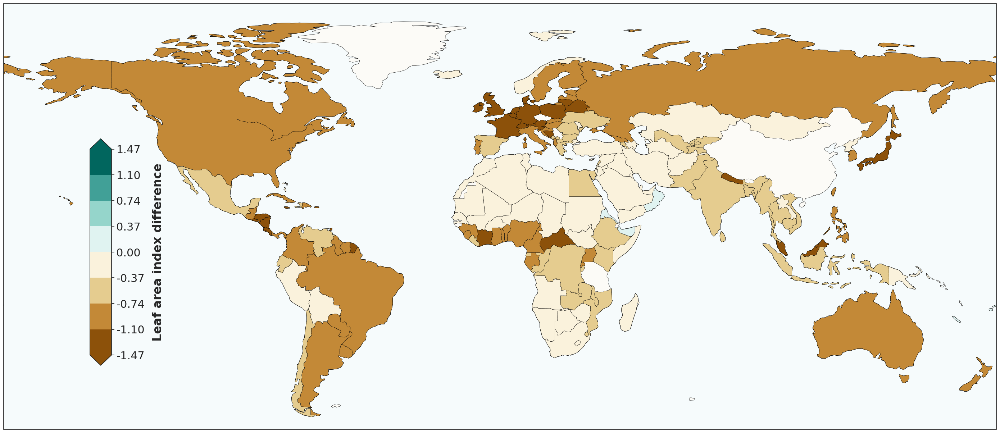

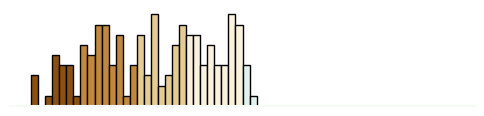

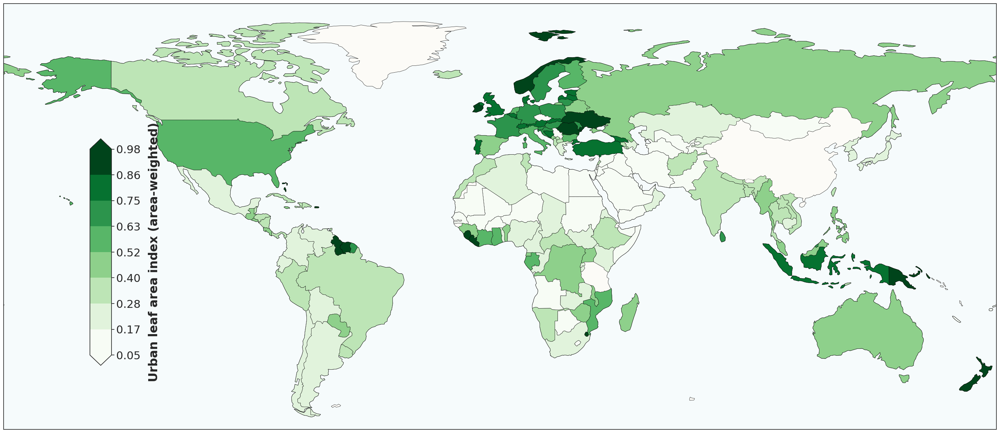

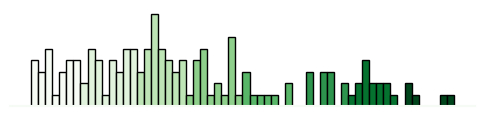

In [35]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Country-level LAI (Urban vs Rural) — DW country differences
-----------------------------------------------------------
- Reads per-city LAI (urban and rural) with areas and country names.
- Computes per-country area-weighted urban and rural LAI:
      μ_u,c = Σ(A_urban_i * LAI_u_i) / Σ(A_urban_i)
      μ_r,c = Σ(A_rural_i * LAI_r_i) / Σ(A_rural_i)
- Defines DW country gap as:
      Δ_DW,c = μ_u,c − μ_r,c
- Also computes WD (weighted mean of per-city gaps) as a diagnostic:
      Δ_WD,c = Σ(w_i * (LAI_u_i − LAI_r_i)) / Σ(w_i),
      w_i = A_urban_i + A_rural_i
- Prints top/bottom country summaries.
- Draws maps and minimalist histograms for:
      • DW country gap (urban − rural)
      • Urban absolute LAI
"""

# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import sys
from pathlib import Path

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from matplotlib.cm import ScalarMappable

# ------------------------------ CONFIG ---------------------------------------
CSV_PATH    = Path('/content/urbanRuralLAI_with_countries_veg.csv')
SHAPE_PATH  = Path('/content/ne_110m_admin_0_countries.shp')

OUT_DIR        = Path('/content/')
OUT_MAP_DIFF   = str(OUT_DIR / 'Sup_LAI_country_diff_Map.pdf')
OUT_HIST_DIFF  = str(OUT_DIR / 'Sup_LAI_country_diff_Hist.pdf')
OUT_MAP_UABS   = str(OUT_DIR / 'Sup_LAI_country_abs_Map.pdf')
OUT_HIST_UABS  = str(OUT_DIR / 'Sup_LAI_country_abs_Hist.pdf')

LAI_SCALE       = 10   # set to 1 if your LAI is already unscaled
MIN_CITIES      = 3
NUM_COLOR_BINS  = 8
NUM_HIST_BINS   = 60

# Palettes (diverging for diff, sequential for absolute)
DIVERGING_COLS  = [
    '#8c510a','#bf812d','#dfc27d','#f6e8c3',
    '#ffffff',
    '#c7eae5','#80cdc1','#35978f','#01665e'
]
SEQUENTIAL_COLS = [
    '#f7fcf5','#e5f5e0','#c7e9c0','#a1d99b',
    '#74c476','#41ab5d','#238b45','#006d2c','#00441b'
]

# ------------------------------ HELPERS --------------------------------------
def _std_name(series: pd.Series) -> pd.Series:
    return (series.astype(str)
                  .str.lower()
                  .str.replace("&","and", regex=False)
                  .str.replace("-", " ", regex=False)
                  .str.replace(".", "",  regex=False)
                  .str.replace(",", "",  regex=False)
                  .str.strip())

def _kish_weighted_mean_se(x: np.ndarray, w: np.ndarray):
    """
    Kish-weighted mean & SE on a 1D array:
      μ_w   = Σ w x / Σ w
      Var_w = Σ w (x - μ_w)^2 / Σ w
      n_eff = (Σ w)^2 / Σ w^2
      SE_w  = sqrt(Var_w / n_eff)
    Returns (mu_w, se_w, n_eff, n_raw, W_sum).
    """
    x = np.asarray(x, float)
    w = np.asarray(w, float)
    m = np.isfinite(x) & np.isfinite(w) & (w > 0)
    x = x[m]
    w = w[m]
    n_raw = int(x.size)
    if n_raw == 0:
        return (np.nan, np.nan, 0.0, 0, 0.0)

    W = float(w.sum())
    if W <= 0:
        return (np.nan, np.nan, 0.0, n_raw, W)

    mu_w = float((w * x).sum() / W)
    w2   = float((w * w).sum())
    n_eff = (W * W) / w2 if w2 > 0 else 0.0

    var_w = float((w * (x - mu_w) ** 2).sum() / W)
    if not np.isfinite(var_w):
        return (mu_w, np.nan, n_eff, n_raw, W)

    se_w = float(np.sqrt(max(var_w, 0.0) / max(n_eff, 1.0))) if n_eff > 0 else np.nan
    return (mu_w, se_w, n_eff, n_raw, W)

def _build_discrete_norm(bounds, colors):
    cmap = LinearSegmentedColormap.from_list('custom', colors, N=256)
    norm = BoundaryNorm(bounds, ncolors=256)
    return cmap, norm

def _styled_map(world_gdf, column, bounds, colors, out_path, label):
    cmap, norm = _build_discrete_norm(bounds, colors)
    fig, ax = plt.subplots(figsize=(30, 18),
                           subplot_kw={'projection': ccrs.PlateCarree()})
    ax.add_feature(cfeature.LAND, facecolor='#fcfbf7')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')

    world_gdf.plot(column=column, cmap=cmap, norm=norm,
                   ax=ax, edgecolor='black', linewidth=0.4,
                   missing_kwds={'color':'lightgrey','label':'No data'})

    ax.set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())

    cbar_ax = fig.add_axes([0.13, 0.27, 0.02, 0.35])
    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, cax=cbar_ax, orientation='vertical', extend='both')
    cbar.set_label(label, fontsize=24, labelpad=15, fontweight='bold')
    cbar.set_ticks(bounds)
    cbar.set_ticklabels([f'{b:.2f}' for b in bounds])
    cbar.ax.tick_params(labelsize=22)

    plt.subplots_adjust(left=0.05, right=0.97, top=0.95, bottom=0.05)
    OUT_DIR.mkdir(parents=True, exist_ok=True)
    plt.savefig(out_path, dpi=400, bbox_inches='tight', format='pdf', transparent=True)
    plt.show()

def _minimalist_hist(series: pd.Series, bounds_arr, bins, colors, out_path):
    """
    Many bins, but colors are DISCRETE:
    - x range clipped to [bounds_arr[0], bounds_arr[-1]]
    - bars are binned finely
    - each bar's color is mapped to one of the discrete classes defined by bounds_arr
      (so multiple bars share the same color, matching the map classes).
    """
    s = pd.to_numeric(series, errors="coerce").dropna()
    s = s[(s >= bounds_arr[0]) & (s <= bounds_arr[-1])]
    if s.empty:
        print("No data in histogram range – skipped.")
        return

    cmap, norm = _build_discrete_norm(bounds_arr, colors)
    n_classes = len(bounds_arr) - 1

    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(
        s,
        bins=np.linspace(bounds_arr[0], bounds_arr[-1], bins + 1),
        edgecolor='black',
        linewidth=1
    )

    # Discrete color per class: many bars, but only (n_classes) unique colors
    for p, left, right in zip(patches, edges[:-1], edges[1:]):
        mid = 0.5 * (left + right)

        # Find class index 0..n_classes-1 based on bounds
        idx = np.searchsorted(bounds_arr, mid, side='right') - 1
        idx = max(0, min(idx, n_classes - 1))

        # Use the midpoint of that class for colormap lookup
        class_mid = 0.5 * (bounds_arr[idx] + bounds_arr[idx + 1])
        p.set_facecolor(cmap(norm(class_mid)))

    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.spines['bottom'].set_visible(True)
    ax.spines['bottom'].set_color('#f6fbf6')
    ax.spines['bottom'].set_linewidth(1.5)
    fig.patch.set_alpha(0)
    ax.patch.set_alpha(0)

    OUT_DIR.mkdir(parents=True, exist_ok=True)
    plt.savefig(out_path, dpi=400, bbox_inches='tight', format='pdf', transparent=True)
    plt.show()

def _print_table(title: str, subdf: pd.DataFrame, cols: list[str]):
    print(f"\n{title}")
    print(subdf[cols].to_string(index=False))

# ------------------------------ LOAD & PREP ----------------------------------
if not CSV_PATH.is_file():
    sys.exit(f"ERROR: CSV not found → {CSV_PATH}")

df = pd.read_csv(CSV_PATH, low_memory=False)

REQ = ["lai_mean_urban", "lai_mean_rural", "Urban_Area", "Rural_area", "NAME_EN"]
missing = [c for c in REQ if c not in df.columns]
if missing:
    sys.exit(f"ERROR: missing column(s) {missing!r} in CSV")

for col in ["lai_mean_urban", "lai_mean_rural", "Urban_Area", "Rural_area"]:
    df[col] = pd.to_numeric(df[col], errors='coerce')

df.dropna(subset=REQ, inplace=True)
df = df[(df["Urban_Area"] > 0) & (df["Rural_area"] > 0)].copy()
if df.empty:
    sys.exit("ERROR: no valid rows after cleaning supports.")

# Undo ×10 scale (if applicable)
df['lai_urban'] = df['lai_mean_urban'] / float(LAI_SCALE)
df['lai_rural'] = df['lai_mean_rural'] / float(LAI_SCALE)

# City-level values and weights
df['diff']   = df['lai_urban'] - df['lai_rural']
df['w_diff'] = df['Urban_Area'] + df['Rural_area']  # WD weights (diagnostic)

# ------------------------- COUNTRY AGGREGATION -------------------------------
counts = df['NAME_EN'].value_counts()
countries_ok = counts[counts >= MIN_CITIES].index
print(f"Keeping {len(countries_ok)} countries with ≥{MIN_CITIES} cities for analysis.")

df_c = df[df['NAME_EN'].isin(countries_ok)].copy()
if df_c.empty:
    sys.exit("ERROR: No countries meet MIN_CITIES criterion.")

def _aggregate_country(g: pd.DataFrame) -> pd.Series:
    # Area-weighted urban LAI (per country)
    mu_u, se_u, n_eff_u, n_raw_u, W_u = _kish_weighted_mean_se(
        g['lai_urban'].to_numpy(),
        g['Urban_Area'].to_numpy()
    )
    # Area-weighted rural LAI (per country)
    mu_r, se_r, n_eff_r, n_raw_r, W_r = _kish_weighted_mean_se(
        g['lai_rural'].to_numpy(),
        g['Rural_area'].to_numpy()
    )
    # WD diagnostic: weighted mean of per-city gaps
    mu_d_wd, se_d_wd, n_eff_d, n_raw_d, W_d = _kish_weighted_mean_se(
        g['diff'].to_numpy(),
        g['w_diff'].to_numpy()
    )

    # DW country gap: difference of area-weighted means
    if np.isfinite(mu_u) and np.isfinite(mu_r):
        diff_dw = float(mu_u - mu_r)
        # Approximate SE for DW as sqrt(se_u^2 + se_r^2) (ignores cov; conservative)
        if np.isfinite(se_u) and np.isfinite(se_r):
            se_dw = float(np.sqrt(se_u**2 + se_r**2))
        else:
            se_dw = np.nan
    else:
        diff_dw = np.nan
        se_dw   = np.nan

    n_cities = int(max(n_raw_u, n_raw_r, n_raw_d))

    return pd.Series({
        'lai_urban_country'       : mu_u,
        'lai_urban_se_country'    : se_u,
        'urban_neff_country'      : n_eff_u,
        'urban_W'                 : W_u,

        'lai_rural_country'       : mu_r,
        'lai_rural_se_country'    : se_r,
        'rural_neff_country'      : n_eff_r,
        'rural_W'                 : W_r,

        # DW (primary)
        'lai_diff_country_dw'     : diff_dw,
        'lai_diff_se_country_dw'  : se_dw,

        # WD diagnostic
        'lai_diff_country_wd'     : mu_d_wd,
        'lai_diff_se_country_wd'  : se_d_wd,
        'diff_neff_country_wd'    : n_eff_d,
        'diff_W_wd'               : W_d,

        'n_cities'                : n_cities
    })

country = (
    df_c
    .groupby('NAME_EN', as_index=False)
    .apply(_aggregate_country)
)

if country.empty:
    sys.exit("ERROR: No countries after weighted aggregation.")

# ------------------ PRINT REQUESTED TOP/BOTTOM SUMMARIES ----------------------
# Top/Bottom by weighted URBAN LAI
urban_cols = ['NAME_EN', 'n_cities', 'lai_urban_country']
top3_urban = country.nlargest(3, 'lai_urban_country')[urban_cols]
bot3_urban = country.nsmallest(3, 'lai_urban_country')[urban_cols]
_print_table("Top 3 — weighted URBAN LAI (μ̄_u)", top3_urban, urban_cols)
_print_table("Bottom 3 — weighted URBAN LAI (μ̄_u)", bot3_urban, urban_cols)

# Top/Bottom by weighted RURAL LAI
rural_cols = ['NAME_EN', 'n_cities', 'lai_rural_country']
top3_rural = country.nlargest(3, 'lai_rural_country')[rural_cols]
bot3_rural = country.nsmallest(3, 'lai_rural_country')[rural_cols]
_print_table("Top 3 — weighted RURAL LAI (μ̄_r)", top3_rural, rural_cols)
_print_table("Bottom 3 — weighted RURAL LAI (μ̄_r)", bot3_rural, rural_cols)

# Most positive / most negative by DW difference (urban − rural)
diff_cols = ['NAME_EN', 'n_cities', 'lai_diff_country_dw']
pos3_diff = country.nlargest(3, 'lai_diff_country_dw')[diff_cols]
neg3_diff = country.nsmallest(3, 'lai_diff_country_dw')[diff_cols]
_print_table("Most positive 3 — DW (urban − rural) LAI (Δ_DW)", pos3_diff, diff_cols)
_print_table("Most negative 3 — DW (urban − rural) LAI (Δ_DW)", neg3_diff, diff_cols)

# ------------------ ACROSS-COUNTRY WEIGHTED SUMMARY (console) ----------------
# Treat each country-level μ as a value and weight by its total area.
u_series = country['lai_urban_country'].astype(float)
u_wts    = country['urban_W'].astype(float)

r_series = country['lai_rural_country'].astype(float)
r_wts    = country['rural_W'].astype(float)

# Combined area for diff weights across countries
d_series_dw = country['lai_diff_country_dw'].astype(float)
d_wts_dw    = (country['urban_W'].astype(float) + country['rural_W'].astype(float))

mu_u_w, se_u_w, n_eff_u_all, _, _ = _kish_weighted_mean_se(u_series.to_numpy(), u_wts.to_numpy())
mu_r_w, se_r_w, n_eff_r_all, _, _ = _kish_weighted_mean_se(r_series.to_numpy(), r_wts.to_numpy())

if np.isfinite(mu_u_w) and np.isfinite(mu_r_w):
    mu_d_w_dw = float(mu_u_w - mu_r_w)
    if np.isfinite(se_u_w) and np.isfinite(se_r_w):
        se_d_w_dw = float(np.sqrt(se_u_w**2 + se_r_w**2))
    else:
        se_d_w_dw = np.nan
else:
    mu_d_w_dw = np.nan
    se_d_w_dw = np.nan

# Optional: WD across countries on DW gaps, weighted by combined area
mu_d_w_wd, se_d_w_wd, n_eff_d_all_wd, _, _ = _kish_weighted_mean_se(
    d_series_dw.to_numpy(),
    d_wts_dw.to_numpy()
)

print("\nAcross-country weighted means (pixel-weighted over countries):")
print(f"  Urban μ̄_u={mu_u_w:.6f} (SE={se_u_w:.4f}, n_eff={n_eff_u_all:.1f})")
print(f"  Rural μ̄_r={mu_r_w:.6f} (SE={se_r_w:.4f}, n_eff={n_eff_r_all:.1f})")
print(f"  DW gap μ̄_Δ_DW={mu_d_w_dw:.6f} (SE={se_d_w_dw:.4f})")
print(f"  WD (country gaps) μ̄_Δ_WD={mu_d_w_wd:.6f} (SE={se_d_w_wd:.4f}, n_eff={n_eff_d_all_wd:.1f})")

# ------------------------------ MAPS -----------------------------------------
if not SHAPE_PATH.is_file():
    sys.exit(f"ERROR: shapefile not found → {SHAPE_PATH}")

world = gpd.read_file(SHAPE_PATH)
# Drop Antarctica if present (handle ADMIN or NAME_EN)
if 'ADMIN' in world.columns:
    world = world[world['ADMIN'] != 'Antarctica']
if 'NAME_EN' in world.columns:
    world = world[world['NAME_EN'] != 'Antarctica']

country['std_name'] = _std_name(country['NAME_EN'])
name_src = 'ADMIN' if 'ADMIN' in world.columns else 'NAME_EN'
world['std_name'] = _std_name(world[name_src])

# DW difference map (urban − rural)
merged_diff = world.merge(country[['std_name', 'lai_diff_country_dw']],
                          how='left', on='std_name').dropna(subset=['lai_diff_country_dw'])
if not merged_diff.empty:
    vals_d   = merged_diff['lai_diff_country_dw'].to_numpy()
    abs_lim_d = max(float(np.percentile(np.abs(vals_d), 95)), 0.1)
    bounds_d = np.linspace(-abs_lim_d, abs_lim_d, NUM_COLOR_BINS + 1)
    _styled_map(merged_diff, 'lai_diff_country_dw', bounds_d, DIVERGING_COLS,
                out_path=OUT_MAP_DIFF, label='Leaf area index difference')
    _minimalist_hist(merged_diff['lai_diff_country_dw'], bounds_d, NUM_HIST_BINS,
                     DIVERGING_COLS, OUT_HIST_DIFF)
else:
    print("[WARN] No countries matched the shapefile for DW difference map.")

# Urban absolute LAI map
merged_uabs = world.merge(country[['std_name', 'lai_urban_country']],
                          how='left', on='std_name').dropna(subset=['lai_urban_country'])
if not merged_uabs.empty:
    vals_u = merged_uabs['lai_urban_country'].to_numpy()
    low_u, high_u = np.percentile(vals_u, 5), np.percentile(vals_u, 95)
    bounds_u = np.linspace(low_u, high_u, NUM_COLOR_BINS + 1)
    _styled_map(merged_uabs, 'lai_urban_country', bounds_u, SEQUENTIAL_COLS,
                out_path=OUT_MAP_UABS, label='Urban leaf area index (area-weighted)')
    _minimalist_hist(merged_uabs['lai_urban_country'], bounds_u, NUM_HIST_BINS,
                     SEQUENTIAL_COLS, OUT_HIST_UABS)
else:
    print("[WARN] No countries matched the shapefile for urban absolute map.")


Keeping 167 countries with ≥3 cities for analysis.


/tmp/ipython-input-3755629354.py:297: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_aggregate_country)



Top 3 — weighted URBAN LAI (μ̄_u)
     NAME_EN  n_cities  lai_urban_country
      Norway     461.0           2.573561
 Puerto Rico     126.0           1.231924
Sierra Leone      25.0           1.086273

Bottom 3 — weighted URBAN LAI (μ̄_u)
      NAME_EN  n_cities  lai_urban_country
         Fiji       3.0           0.000000
New Caledonia       3.0           0.000000
       Kuwait      18.0           0.011676

Top 3 — weighted RURAL LAI (μ̄_r)
    NAME_EN  n_cities  lai_rural_country
Puerto Rico     126.0           2.701999
    Ireland      97.0           2.619091
 Luxembourg      24.0           2.608939

Bottom 3 — weighted RURAL LAI (μ̄_r)
      NAME_EN  n_cities  lai_rural_country
         Fiji       3.0           0.000000
New Caledonia       3.0           0.000000
   Mauritania      47.0           0.046366

Most positive 3 — DW (urban − rural) LAI (Δ_DW)
   NAME_EN  n_cities  lai_diff_country_dw
      Oman      68.0             0.051790
Somaliland      14.0             0.023705
   

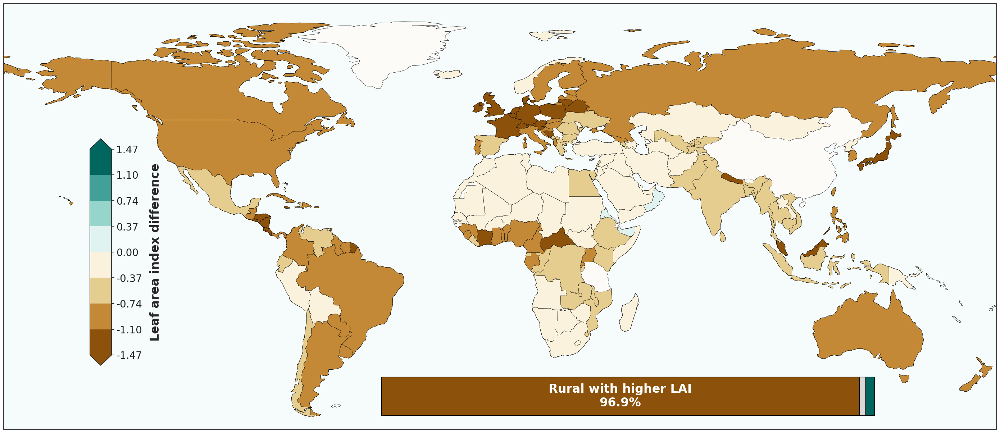

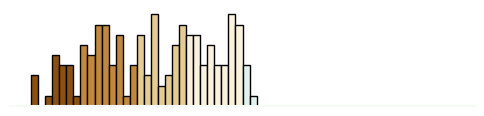

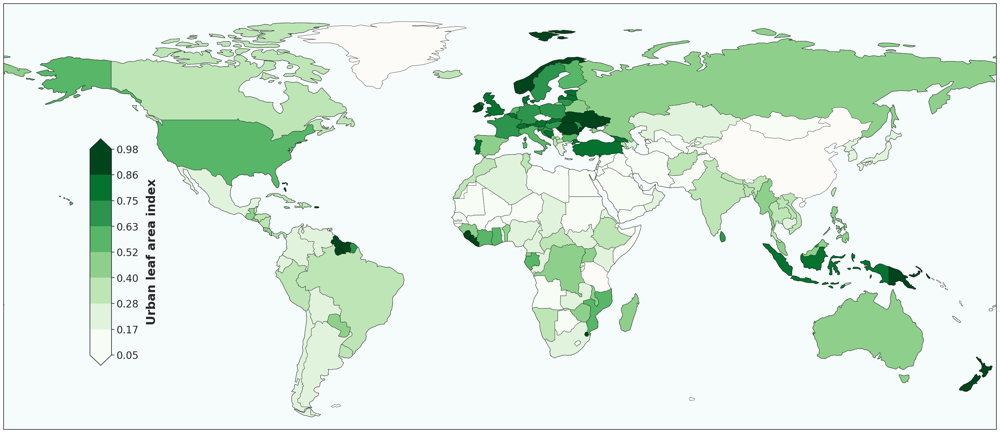

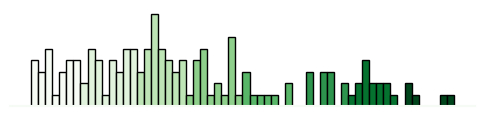

In [37]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Country-level LAI (Urban vs Rural) — DW country differences
-----------------------------------------------------------
- Reads per-city LAI (urban and rural) with areas and country names.
- Computes per-country area-weighted urban and rural LAI:
      μ_u,c = Σ(A_urban_i * LAI_u_i) / Σ(A_urban_i)
      μ_r,c = Σ(A_rural_i * LAI_r_i) / Σ(A_rural_i)
- Defines DW country gap as:
      Δ_DW,c = μ_u,c − μ_r,c
- Also computes WD (weighted mean of per-city gaps) as a diagnostic:
      Δ_WD,c = Σ(w_i * (LAI_u_i − LAI_r_i)) / Σ(w_i),
      w_i = A_urban_i + A_rural_i
- Prints top/bottom country summaries.
- Draws:
      • DW difference map + stacked bar inset (% rural>urban / ties / urban>rural)
      • Minimalist histogram of DW gaps (discrete colors)
      • Urban absolute LAI map + histogram
"""

# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import sys
from pathlib import Path

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from matplotlib.cm import ScalarMappable

# ------------------------------ CONFIG ---------------------------------------
CSV_PATH    = Path('/content/urbanRuralLAI_with_countries_veg.csv')
SHAPE_PATH  = Path('/content/ne_110m_admin_0_countries.shp')

OUT_DIR        = Path('/content/')
OUT_MAP_DIFF   = str(OUT_DIR / 'Sup_LAI_country_diff_Map.pdf')
OUT_HIST_DIFF  = str(OUT_DIR / 'Sup_LAI_country_diff_Hist.pdf')
OUT_MAP_UABS   = str(OUT_DIR / 'Sup_LAI_country_abs_Map.pdf')
OUT_HIST_UABS  = str(OUT_DIR / 'Sup_LAI_country_abs_Hist.pdf')

LAI_SCALE       = 10   # set to 1 if your LAI is already unscaled
MIN_CITIES      = 3
NUM_COLOR_BINS  = 8
NUM_HIST_BINS   = 60
EPS_TIE         = 1e-9  # tolerance for "ties" in DW gap

# Palettes (diverging for diff, sequential for absolute)
DIVERGING_COLS  = [
    '#8c510a','#bf812d','#dfc27d','#f6e8c3',
    '#ffffff',
    '#c7eae5','#80cdc1','#35978f','#01665e'
]
SEQUENTIAL_COLS = [
    '#f7fcf5','#e5f5e0','#c7e9c0','#a1d99b',
    '#74c476','#41ab5d','#238b45','#006d2c','#00441b'
]

COLOR_RURAL_GREENER = DIVERGING_COLS[0]
COLOR_URBAN_GREENER = DIVERGING_COLS[-1]
COLOR_TIES          = "#d9d9d9"

# ------------------------------ HELPERS --------------------------------------
def _std_name(series: pd.Series) -> pd.Series:
    return (series.astype(str)
                  .str.lower()
                  .str.replace("&","and", regex=False)
                  .str.replace("-", " ", regex=False)
                  .str.replace(".", "",  regex=False)
                  .str.replace(",", "",  regex=False)
                  .str.strip())

def _kish_weighted_mean_se(x: np.ndarray, w: np.ndarray):
    """
    Kish-weighted mean & SE on a 1D array:
      μ_w   = Σ w x / Σ w
      Var_w = Σ w (x - μ_w)^2 / Σ w
      n_eff = (Σ w)^2 / Σ w^2
      SE_w  = sqrt(Var_w / n_eff)
    Returns (mu_w, se_w, n_eff, n_raw, W_sum).
    """
    x = np.asarray(x, float)
    w = np.asarray(w, float)
    m = np.isfinite(x) & np.isfinite(w) & (w > 0)
    x = x[m]
    w = w[m]
    n_raw = int(x.size)
    if n_raw == 0:
        return (np.nan, np.nan, 0.0, 0, 0.0)

    W = float(w.sum())
    if W <= 0:
        return (np.nan, np.nan, 0.0, n_raw, W)

    mu_w = float((w * x).sum() / W)
    w2   = float((w * w).sum())
    n_eff = (W * W) / w2 if w2 > 0 else 0.0

    var_w = float((w * (x - mu_w) ** 2).sum() / W)
    if not np.isfinite(var_w):
        return (mu_w, np.nan, n_eff, n_raw, W)

    se_w = float(np.sqrt(max(var_w, 0.0) / max(n_eff, 1.0))) if n_eff > 0 else np.nan
    return (mu_w, se_w, n_eff, n_raw, W)

def _build_discrete_norm(bounds, colors):
    cmap = LinearSegmentedColormap.from_list('custom', colors, N=256)
    norm = BoundaryNorm(bounds, ncolors=256)
    return cmap, norm

def _styled_map(world_gdf, column, bounds, colors, out_path, label):
    """
    General map (used for urban absolute map).
    """
    cmap, norm = _build_discrete_norm(bounds, colors)
    fig, ax = plt.subplots(figsize=(30, 18),
                           subplot_kw={'projection': ccrs.PlateCarree()})
    ax.add_feature(cfeature.LAND, facecolor='#fcfbf7')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')

    world_gdf.plot(column=column, cmap=cmap, norm=norm,
                   ax=ax, edgecolor='black', linewidth=0.4,
                   missing_kwds={'color':'lightgrey','label':'No data'})

    ax.set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())

    cbar_ax = fig.add_axes([0.13, 0.27, 0.02, 0.35])
    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, cax=cbar_ax, orientation='vertical', extend='both')
    cbar.set_label(label, fontsize=24, labelpad=15, fontweight='bold')
    cbar.set_ticks(bounds)
    cbar.set_ticklabels([f'{b:.2f}' for b in bounds])
    cbar.ax.tick_params(labelsize=20)

    plt.subplots_adjust(left=0.05, right=0.97, top=0.95, bottom=0.05)
    OUT_DIR.mkdir(parents=True, exist_ok=True)
    plt.savefig(out_path, dpi=400, bbox_inches='tight', format='pdf', transparent=True)
    plt.show()

def _minimalist_hist(series: pd.Series, bounds_arr, bins, colors, out_path):
    """
    Many bins, but colors are DISCRETE:
    - x range clipped to [bounds_arr[0], bounds_arr[-1]]
    - bars are binned finely
    - each bar's color is mapped to one of the discrete classes defined by bounds_arr
      (so multiple bars share the same color, matching the map classes).
    """
    s = pd.to_numeric(series, errors="coerce").dropna()
    s = s[(s >= bounds_arr[0]) & (s <= bounds_arr[-1])]
    if s.empty:
        print("No data in histogram range – skipped.")
        return

    cmap, norm = _build_discrete_norm(bounds_arr, colors)
    n_classes = len(bounds_arr) - 1

    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(
        s,
        bins=np.linspace(bounds_arr[0], bounds_arr[-1], bins + 1),
        edgecolor='black',
        linewidth=1
    )

    # Discrete color per class: many bars, but only (n_classes) unique colors
    for p, left, right in zip(patches, edges[:-1], edges[1:]):
        mid = 0.5 * (left + right)

        # Find class index 0..n_classes-1 based on bounds
        idx = np.searchsorted(bounds_arr, mid, side='right') - 1
        idx = max(0, min(idx, n_classes - 1))

        # Use the midpoint of that class for colormap lookup
        class_mid = 0.5 * (bounds_arr[idx] + bounds_arr[idx + 1])
        p.set_facecolor(cmap(norm(class_mid)))

    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.spines['bottom'].set_visible(True)
    ax.spines['bottom'].set_color('#f6fbf6')
    ax.spines['bottom'].set_linewidth(1.5)
    fig.patch.set_alpha(0)
    ax.patch.set_alpha(0)

    OUT_DIR.mkdir(parents=True, exist_ok=True)
    plt.savefig(out_path, dpi=400, bbox_inches='tight', format='pdf', transparent=True)
    plt.show()

def _print_table(title: str, subdf: pd.DataFrame, cols: list[str]):
    print(f"\n{title}")
    print(subdf[cols].to_string(index=False))

# ------------------------------ LOAD & PREP ----------------------------------
if not CSV_PATH.is_file():
    sys.exit(f"ERROR: CSV not found → {CSV_PATH}")

df = pd.read_csv(CSV_PATH, low_memory=False)

REQ = ["lai_mean_urban", "lai_mean_rural", "Urban_Area", "Rural_area", "NAME_EN"]
missing = [c for c in REQ if c not in df.columns]
if missing:
    sys.exit(f"ERROR: missing column(s) {missing!r} in CSV")

for col in ["lai_mean_urban", "lai_mean_rural", "Urban_Area", "Rural_area"]:
    df[col] = pd.to_numeric(df[col], errors='coerce')

df.dropna(subset=REQ, inplace=True)
df = df[(df["Urban_Area"] > 0) & (df["Rural_area"] > 0)].copy()
if df.empty:
    sys.exit("ERROR: no valid rows after cleaning supports.")

# Undo ×10 scale (if applicable)
df['lai_urban'] = df['lai_mean_urban'] / float(LAI_SCALE)
df['lai_rural'] = df['lai_mean_rural'] / float(LAI_SCALE)

# City-level values and weights
df['diff']   = df['lai_urban'] - df['lai_rural']
df['w_diff'] = df['Urban_Area'] + df['Rural_area']  # WD weights (diagnostic)

# ------------------------- COUNTRY AGGREGATION -------------------------------
counts = df['NAME_EN'].value_counts()
countries_ok = counts[counts >= MIN_CITIES].index
print(f"Keeping {len(countries_ok)} countries with ≥{MIN_CITIES} cities for analysis.")

df_c = df[df['NAME_EN'].isin(countries_ok)].copy()
if df_c.empty:
    sys.exit("ERROR: No countries meet MIN_CITIES criterion.")

def _aggregate_country(g: pd.DataFrame) -> pd.Series:
    # Area-weighted urban LAI (per country)
    mu_u, se_u, n_eff_u, n_raw_u, W_u = _kish_weighted_mean_se(
        g['lai_urban'].to_numpy(),
        g['Urban_Area'].to_numpy()
    )
    # Area-weighted rural LAI (per country)
    mu_r, se_r, n_eff_r, n_raw_r, W_r = _kish_weighted_mean_se(
        g['lai_rural'].to_numpy(),
        g['Rural_area'].to_numpy()
    )
    # WD diagnostic: weighted mean of per-city gaps
    mu_d_wd, se_d_wd, n_eff_d, n_raw_d, W_d = _kish_weighted_mean_se(
        g['diff'].to_numpy(),
        g['w_diff'].to_numpy()
    )

    # DW country gap: difference of area-weighted means
    if np.isfinite(mu_u) and np.isfinite(mu_r):
        diff_dw = float(mu_u - mu_r)
        # Approximate SE for DW as sqrt(se_u^2 + se_r^2) (ignores cov; conservative)
        if np.isfinite(se_u) and np.isfinite(se_r):
            se_dw = float(np.sqrt(se_u**2 + se_r**2))
        else:
            se_dw = np.nan
    else:
        diff_dw = np.nan
        se_dw   = np.nan

    n_cities = int(max(n_raw_u, n_raw_r, n_raw_d))

    return pd.Series({
        'lai_urban_country'       : mu_u,
        'lai_urban_se_country'    : se_u,
        'urban_neff_country'      : n_eff_u,
        'urban_W'                 : W_u,

        'lai_rural_country'       : mu_r,
        'lai_rural_se_country'    : se_r,
        'rural_neff_country'      : n_eff_r,
        'rural_W'                 : W_r,

        # DW (primary)
        'lai_diff_country_dw'     : diff_dw,
        'lai_diff_se_country_dw'  : se_dw,

        # WD diagnostic
        'lai_diff_country_wd'     : mu_d_wd,
        'lai_diff_se_country_wd'  : se_d_wd,
        'diff_neff_country_wd'    : n_eff_d,
        'diff_W_wd'               : W_d,

        'n_cities'                : n_cities
    })

country = (
    df_c
    .groupby('NAME_EN', as_index=False)
    .apply(_aggregate_country)
)

if country.empty:
    sys.exit("ERROR: No countries after weighted aggregation.")

# ------------------ PRINT REQUESTED TOP/BOTTOM SUMMARIES ----------------------
# Top/Bottom by weighted URBAN LAI
urban_cols = ['NAME_EN', 'n_cities', 'lai_urban_country']
top3_urban = country.nlargest(3, 'lai_urban_country')[urban_cols]
bot3_urban = country.nsmallest(3, 'lai_urban_country')[urban_cols]
_print_table("Top 3 — weighted URBAN LAI (μ̄_u)", top3_urban, urban_cols)
_print_table("Bottom 3 — weighted URBAN LAI (μ̄_u)", bot3_urban, urban_cols)

# Top/Bottom by weighted RURAL LAI
rural_cols = ['NAME_EN', 'n_cities', 'lai_rural_country']
top3_rural = country.nlargest(3, 'lai_rural_country')[rural_cols]
bot3_rural = country.nsmallest(3, 'lai_rural_country')[rural_cols]
_print_table("Top 3 — weighted RURAL LAI (μ̄_r)", top3_rural, rural_cols)
_print_table("Bottom 3 — weighted RURAL LAI (μ̄_r)", bot3_rural, rural_cols)

# Most positive / most negative by DW difference (urban − rural)
diff_cols = ['NAME_EN', 'n_cities', 'lai_diff_country_dw']
pos3_diff = country.nlargest(3, 'lai_diff_country_dw')[diff_cols]
neg3_diff = country.nsmallest(3, 'lai_diff_country_dw')[diff_cols]
_print_table("Most positive 3 — DW (urban − rural) LAI (Δ_DW)", pos3_diff, diff_cols)
_print_table("Most negative 3 — DW (urban − rural) LAI (Δ_DW)", neg3_diff, diff_cols)

# ------------------ ACROSS-COUNTRY WEIGHTED SUMMARY (console) ----------------
# Treat each country-level μ as a value and weight by its total area.
u_series = country['lai_urban_country'].astype(float)
u_wts    = country['urban_W'].astype(float)

r_series = country['lai_rural_country'].astype(float)
r_wts    = country['rural_W'].astype(float)

# Combined area for diff weights across countries
d_series_dw = country['lai_diff_country_dw'].astype(float)
d_wts_dw    = (country['urban_W'].astype(float) + country['rural_W'].astype(float))

mu_u_w, se_u_w, n_eff_u_all, _, _ = _kish_weighted_mean_se(u_series.to_numpy(), u_wts.to_numpy())
mu_r_w, se_r_w, n_eff_r_all, _, _ = _kish_weighted_mean_se(r_series.to_numpy(), r_wts.to_numpy())

if np.isfinite(mu_u_w) and np.isfinite(mu_r_w):
    mu_d_w_dw = float(mu_u_w - mu_r_w)
    if np.isfinite(se_u_w) and np.isfinite(se_r_w):
        se_d_w_dw = float(np.sqrt(se_u_w**2 + se_r_w**2))
    else:
        se_d_w_dw = np.nan
else:
    mu_d_w_dw = np.nan
    se_d_w_dw = np.nan

# Optional: WD across countries on DW gaps, weighted by combined area
mu_d_w_wd, se_d_w_wd, n_eff_d_all_wd, _, _ = _kish_weighted_mean_se(
    d_series_dw.to_numpy(),
    d_wts_dw.to_numpy()
)

print("\nAcross-country weighted means (pixel-weighted over countries):")
print(f"  Urban μ̄_u={mu_u_w:.6f} (SE={se_u_w:.4f}, n_eff={n_eff_u_all:.1f})")
print(f"  Rural μ̄_r={mu_r_w:.6f} (SE={se_r_w:.4f}, n_eff={n_eff_r_all:.1f})")
print(f"  DW gap μ̄_Δ_DW={mu_d_w_dw:.6f} (SE={se_d_w_dw:.4f})")
print(f"  WD (country gaps) μ̄_Δ_WD={mu_d_w_wd:.6f} (SE={se_d_w_wd:.4f}, n_eff={n_eff_d_all_wd:.1f})")

# ------------------------------ MAPS -----------------------------------------
if not SHAPE_PATH.is_file():
    sys.exit(f"ERROR: shapefile not found → {SHAPE_PATH}")

world = gpd.read_file(SHAPE_PATH)
# Drop Antarctica if present (handle ADMIN or NAME_EN)
if 'ADMIN' in world.columns:
    world = world[world['ADMIN'] != 'Antarctica']
if 'NAME_EN' in world.columns:
    world = world[world['NAME_EN'] != 'Antarctica']

country['std_name'] = _std_name(country['NAME_EN'])
name_src = 'ADMIN' if 'ADMIN' in world.columns else 'NAME_EN'
world['std_name'] = _std_name(world[name_src])

# ---------------- DW difference map (urban − rural) + inset ------------------
merged_diff = world.merge(country[['std_name', 'lai_diff_country_dw']],
                          how='left', on='std_name').dropna(subset=['lai_diff_country_dw'])
if not merged_diff.empty:
    vals_d   = merged_diff['lai_diff_country_dw'].to_numpy()
    abs_lim_d = max(float(np.percentile(np.abs(vals_d), 95)), 0.1)
    bounds_d = np.linspace(-abs_lim_d, abs_lim_d, NUM_COLOR_BINS + 1)

    cmap_diff, norm_diff = _build_discrete_norm(bounds_d, DIVERGING_COLS)

    fig, ax = plt.subplots(figsize=(30, 18),
                           subplot_kw={'projection': ccrs.PlateCarree()})
    ax.add_feature(cfeature.LAND, facecolor='#fcfbf7')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')

    merged_diff.plot(
        column='lai_diff_country_dw',
        cmap=cmap_diff,
        norm=norm_diff,
        ax=ax,
        edgecolor='black',
        linewidth=0.4,
        missing_kwds={'color': 'lightgrey', 'label': 'No data'}
    )

    ax.set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())

    # Colorbar
    cbar_ax = fig.add_axes([0.13, 0.27, 0.02, 0.35])
    sm = ScalarMappable(norm=norm_diff, cmap=cmap_diff)
    sm.set_array([])
    cbar = plt.colorbar(sm, cax=cbar_ax, orientation='vertical', extend='both')
    cbar.set_label('Leaf area index difference', fontsize=24,
                   labelpad=15, fontweight='bold')
    cbar.set_ticks(bounds_d)
    cbar.set_ticklabels([f'{b:.2f}' for b in bounds_d])
    cbar.ax.tick_params(labelsize=20)

    # Inset stacked bar: % countries rural greener / ties / urban greener
    try:
        diffs = merged_diff["lai_diff_country_dw"].dropna().to_numpy()
        n_tot = diffs.size
        rural_mask = diffs < -EPS_TIE
        urban_mask = diffs >  EPS_TIE
        tie_mask   = ~(rural_mask | urban_mask)

        n_rural = int(rural_mask.sum())
        n_urban = int(urban_mask.sum())
        n_ties  = int(tie_mask.sum())

        pct_rural = 100.0 * n_rural / n_tot if n_tot > 0 else 0.0
        pct_urban = 100.0 * n_urban / n_tot if n_tot > 0 else 0.0
        pct_ties  = 100.0 * n_ties  / n_tot if n_tot > 0 else 0.0

        # Inset location (tucked under the map, right side)
        bax = fig.add_axes([0.4, 0.19, 0.48, 0.065])  # identical to reference example
        bax.set_axis_off()

        # Left segment: Rural-greener
        bax.barh(["Countries"], [pct_rural], color=COLOR_RURAL_GREENER,
                 edgecolor='black', height=0.45, zorder=3)
        # Middle segment: Ties (if any)
        if pct_ties > 0:
            bax.barh(["Countries"], [pct_ties], color=COLOR_TIES,
                     edgecolor='black', height=0.45, left=pct_rural, zorder=3)
            right_start = pct_rural + pct_ties
        else:
            right_start = pct_rural
        # Right segment: Urban-greener
        bax.barh(["Countries"], [pct_urban], color=COLOR_URBAN_GREENER,
                 edgecolor='black', height=0.45, left=right_start, zorder=3)

        # Labels (centered in each segment if the segment exists)
        if pct_rural > 0:
            bax.text(pct_rural/2, 0,
                     f"Rural with higher LAI\n{pct_rural:.1f}%",
                     ha='center', va='center', fontsize=24,
                     color='white', weight='bold')
        if pct_ties > 0:
            bax.text(pct_rural + pct_ties/2, 0,
                     f"",
                     ha='center', va='center', fontsize=24,
                     color='black', weight='bold')
        if pct_urban > 0:
            bax.text(right_start + pct_urban/2, 0,
                     f"",
                     ha='center', va='center', fontsize=24,
                     color='white', weight='bold')
    except Exception as e:
        print(f"[WARN] Inset bar skipped: {e}", file=sys.stderr)

    plt.subplots_adjust(left=0.05, right=0.97, top=0.95, bottom=0.05)
    OUT_DIR.mkdir(parents=True, exist_ok=True)
    plt.savefig(OUT_MAP_DIFF, dpi=400, bbox_inches='tight', format='pdf', transparent=True)
    plt.show()

    # Matching discrete-color histogram
    _minimalist_hist(
        merged_diff['lai_diff_country_dw'],
        bounds_d,
        NUM_HIST_BINS,
        DIVERGING_COLS,
        OUT_HIST_DIFF
    )
else:
    print("[WARN] No countries matched the shapefile for DW difference map.")

# ------------------------ Urban absolute LAI map -----------------------------
merged_uabs = world.merge(country[['std_name', 'lai_urban_country']],
                          how='left', on='std_name').dropna(subset=['lai_urban_country'])
if not merged_uabs.empty:
    vals_u = merged_uabs['lai_urban_country'].to_numpy()
    low_u, high_u = np.percentile(vals_u, 5), np.percentile(vals_u, 95)
    bounds_u = np.linspace(low_u, high_u, NUM_COLOR_BINS + 1)
    _styled_map(merged_uabs, 'lai_urban_country', bounds_u, SEQUENTIAL_COLS,
                out_path=OUT_MAP_UABS, label='Urban leaf area index')
    _minimalist_hist(merged_uabs['lai_urban_country'], bounds_u,
                     NUM_HIST_BINS, SEQUENTIAL_COLS, OUT_HIST_UABS)
else:
    print("[WARN] No countries matched the shapefile for urban absolute map.")


Loading data → /content/urbanRuralLAI_with_countries_veg.csv
Dropped 183 zero‑LAI rows
Filtering countries with fewer than 1 cities...
Dropped 0 countries.
Aggregated countries remaining: 166
Loading world shape → /content/ne_110m_admin_0_countries.shp
Styled map saved → /content/EDFig2C_map.pdf


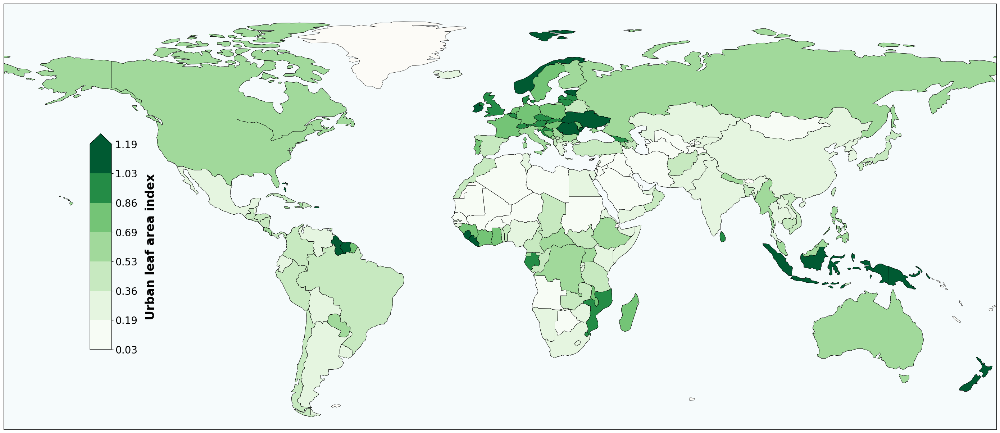

Styled histogram saved → /content/EDFig2C_hist.pdf


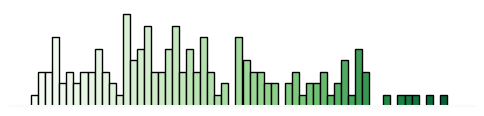

In [27]:
# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import os
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from matplotlib.cm import ScalarMappable

# ------------------------------------------------------------------
# CONFIG – adjust paths / parameters here
# ------------------------------------------------------------------
CSV_PATH      = '/content/urbanRuralLAI_with_countries_veg.csv'
SHAPE_PATH    = '/content/ne_110m_admin_0_countries.shp'

# --- MODIFICATION 1: Changed output filenames to use .png extension ---
OUT_DIR     = Path('/content/')
# --- MODIFICATION 1: Changed output file extensions to .png ---
OUT_MAP     = OUT_DIR / 'EDFig2C_map.pdf'
OUT_HIST    = OUT_DIR / 'EDFig2C_hist.pdf'

LAI_SCALE     = 10     # undo earlier ×10 scaling
MIN_CITIES    = 1     # minimum number of cities per country
NUM_COLOR_BINS = 8     # number of discrete colour classes
NUM_HIST_BINS  = 60    # histogram resolution

# sequential green palette – light → dark
GREEN_COLS = ['#f7fcf5', '#e5f5e0', '#c7e9c0',
              '#a1d99b', '#74c476', '#238b45', '#005a32']

# ------------------------------------------------------------------
# HELPER: standardise names for merging
# ------------------------------------------------------------------
def _std_name(series: pd.Series) -> pd.Series:
    # Added regex=True for future compatibility with pandas
    return (series.str.lower()
                  .str.replace("&", "and", regex=False)
                  .str.replace("-", " ", regex=False)
                  .str.replace(".", "", regex=False)
                  .str.replace(",", "", regex=False)
                  .str.strip())

# ------------------------------------------------------------------
# 1. LOAD CSV
# ------------------------------------------------------------------
print(f"Loading data → {CSV_PATH}")
try:
    df = pd.read_csv(CSV_PATH, low_memory=False)
except Exception as exc:
    sys.exit(f"ERROR reading CSV: {exc}")

REQ = ['lai_mean_urban', 'Urban_Area', 'NAME_EN']
missing = [c for c in REQ if c not in df.columns]
if missing:
    sys.exit(f"ERROR: missing columns {missing!r}")

df['lai_urban_scaled'] = df['lai_mean_urban'] / LAI_SCALE
before = len(df)
df = df[df['lai_urban_scaled'].ne(0)]
print(f"Dropped {before - len(df):,} zero‑LAI rows")

# ------------------------------------------------------------------
# 2. AGGREGATE MEAN LAI PER COUNTRY
# ------------------------------------------------------------------
city_counts = df['NAME_EN'].value_counts()
countries_to_keep = city_counts[city_counts >= MIN_CITIES].index
num_countries_before = len(city_counts)
num_countries_after = len(countries_to_keep)

print(f"Filtering countries with fewer than {MIN_CITIES} cities...")
print(f"Dropped {num_countries_before - num_countries_after} countries.")

df_filtered = df[df['NAME_EN'].isin(countries_to_keep)]

country_lai = (df_filtered.groupby('NAME_EN', as_index=False)
                 ['lai_urban_scaled']
                 .mean()
                 .rename(columns={'lai_urban_scaled': 'mean_lai_urban'}))

country_lai = country_lai[country_lai['mean_lai_urban'] > 0]
print(f"Aggregated countries remaining: {len(country_lai):,}")

# ------------------------------------------------------------------
# 3. READ WORLD SHAPEFILE
# ------------------------------------------------------------------
print(f"Loading world shape → {SHAPE_PATH}")
try:
    world = gpd.read_file(SHAPE_PATH)
except Exception as exc:
    sys.exit(f"ERROR reading shapefile: {exc}")

if 'ADMIN' in world.columns:
    world = world[world['ADMIN'] != 'Antarctica']
if 'NAME_EN' in world.columns:
    world = world[world['NAME_EN'] != 'Antarctica']

country_lai['std_name'] = _std_name(country_lai['NAME_EN'])
if 'NAME_EN' in world.columns:
    world['std_name'] = _std_name(world['NAME_EN'])
else:
    world['std_name'] = _std_name(world['ADMIN'])

merged = (world.merge(country_lai[['std_name', 'mean_lai_urban']],
                      how='left', on='std_name')
               .dropna(subset=['mean_lai_urban']))

if merged.empty:
    sys.exit("ERROR: no matching countries after merge.")

# ------------------------------------------------------------------
# 4. COLOUR SCALE
# ------------------------------------------------------------------
vals = merged['mean_lai_urban'].values
v_min = vals.min()
v_max = np.percentile(vals, 95)

bounds = np.linspace(v_min, v_max, NUM_COLOR_BINS)
cmap   = LinearSegmentedColormap.from_list('lai_green', GREEN_COLS, N=256)
norm   = BoundaryNorm(bounds, ncolors=256)

# ------------------------------------------------------------------
# 5. CHOROPLETH (STYLED)
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(30, 20),
                       subplot_kw={'projection': ccrs.PlateCarree()})

# --- Style Update: Match land/ocean colors and line widths ---
ax.add_feature(cfeature.LAND, facecolor='#fcfbf7')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.1)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

merged.plot(
    column='mean_lai_urban', cmap=cmap, norm=norm,
    ax=ax, edgecolor='black', linewidth=0.4,
    missing_kwds={'color': 'lightgrey', 'label': 'No data'}
)

ax.set_extent([-180, 180, -60, 90])

# --- Style Update: Adjust color bar position ---
cbar_ax = fig.add_axes([0.13, 0.3, 0.02, 0.3])
sm = ScalarMappable(norm=norm, cmap=cmap); sm._A = []
cbar = plt.colorbar(sm, cax=cbar_ax, orientation='vertical', extend='max')
cbar.set_label('Urban leaf area index', fontsize=24, labelpad=15, fontweight='bold')
cbar.set_ticks(bounds); cbar.set_ticklabels([f'{b:.2f}' for b in bounds])
cbar.ax.tick_params(labelsize=20)

plt.subplots_adjust(left=0.05, right=0.97, top=0.92, bottom=0.05)

# Using pathlib for cleaner path handling
output_path = Path(OUT_MAP)
output_path.parent.mkdir(parents=True, exist_ok=True)

# --- MODIFICATION 2: Changed format to 'png' ---
plt.savefig(output_path, dpi=400, bbox_inches='tight', format='png', transparent=True)
print(f"Styled map saved → {output_path}")
plt.show()

# ------------------------------------------------------------------
# 6. HISTOGRAM (minimalist, colour‑matched)
# ------------------------------------------------------------------
def minimalist_hist(series: pd.Series, low: float, high: float,
                    bins: int, cmap_obj, path: str):
    series = series[(series >= low) & (series <= high)]
    if series.empty:
        print("No data within histogram bounds – skipped."); return

    norm_h = plt.Normalize(vmin=low, vmax=high)
    fig, ax = plt.subplots(figsize=(6, 1.25))
    counts, edges, patches = ax.hist(series,
                                     bins=np.linspace(low, high, bins + 1),
                                     edgecolor='black')
    for p, l, r in zip(patches, edges[:-1], edges[1:]):
        p.set_facecolor(cmap_obj(norm_h((l + r) / 2)))

    ax.set_xticks([]); ax.set_yticks([])
    for s in ax.spines.values(): s.set_visible(False)
    ax.spines['bottom'].set_visible(True)
    ax.spines['bottom'].set_color('#f6fbfc')
    ax.spines['bottom'].set_linewidth(1.5)
    fig.patch.set_alpha(0); ax.patch.set_alpha(0)

    output_path = Path(path)
    output_path.parent.mkdir(parents=True, exist_ok=True)

    # --- MODIFICATION 3: Changed format to 'png' ---
    plt.savefig(output_path, dpi=300, bbox_inches='tight', format='png', transparent=True)
    print(f"Styled histogram saved → {output_path}")
    plt.show()

minimalist_hist(merged['mean_lai_urban'],
                low=bounds[0], high=bounds[-1],
                bins=NUM_HIST_BINS, cmap_obj=cmap, path=OUT_HIST)

#GNGS all veg

In [29]:
from __future__ import annotations
import math
import sys
from pathlib import Path
from typing import Dict, List, Optional, Tuple

import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu

# ────────────────────────── CONFIG ──────────────────────────

CSV_PATH   = Path("/content/urbanRuralLAI_with_countries_global_ns_veg.csv")
GROUP_COL  = "GlobalNS"
URBAN_AREA = "Urban_Area"
RURAL_AREA = "Rural_area"     # must match your LAI weighted script
LAI_U_COL  = "lai_mean_urban"
LAI_R_COL  = "lai_mean_rural"
LAI_SCALE  = 10.0             # set to 1 if LAI already in final units
TOP_N      = 1000
SAVE_DIR   = "/content/lai_ns_outputs"  # None → default to CSV dir

MAP_NS = {
    "North": "Global North",
    "South": "Global South",
    "Global North": "Global North",
    "Global South": "Global South",
}
REGION_ORDER = ["Global North", "Global South"]


# ────────────────────────── HELPERS ──────────────────────────

def _coerce_num(s: pd.Series) -> pd.Series:
    return pd.to_numeric(s, errors="coerce")


def _unweighted_mean_se(x: pd.Series) -> Tuple[float, float, int]:
    x = _coerce_num(x).dropna()
    n = int(x.size)
    if n == 0:
        return np.nan, np.nan, 0
    mu = float(x.mean())
    se = float(x.std(ddof=1) / math.sqrt(n)) if n > 1 else np.nan
    return mu, se, n


def _kish_weighted_mean_se(x: pd.Series, w: pd.Series) -> Tuple[float, float]:
    """
    Kish-weighted mean & SE:
        μ_w   = Σ w x / Σ w
        Var_w = Σ w (x - μ_w)^2 / Σ w
        n_eff = (Σ w)^2 / Σ w^2
        SE_w  = sqrt(Var_w / n_eff)
    """
    x = _coerce_num(x)
    w = _coerce_num(w)
    m = x.notna() & w.notna() & np.isfinite(x) & np.isfinite(w) & (w > 0)
    x = x[m].to_numpy(float)
    w = w[m].to_numpy(float)

    if x.size == 0:
        return np.nan, np.nan

    W = float(w.sum())
    if W <= 0:
        return np.nan, np.nan

    mu_w = float(np.dot(w, x) / W)
    w2 = float(np.dot(w, w))
    if w2 <= 0:
        return mu_w, np.nan

    n_eff = (W * W) / w2
    var_w = float(np.dot(w, (x - mu_w) ** 2) / W)
    if not (np.isfinite(var_w) and np.isfinite(n_eff) and n_eff > 0 and var_w >= 0):
        return mu_w, np.nan

    se_w = float(math.sqrt(var_w / n_eff))
    return mu_w, se_w


def _rank_biserial_from_mwu(U: float, n1: int, n2: int) -> Optional[float]:
    if not np.isfinite(U) or n1 <= 0 or n2 <= 0:
        return None
    return 1.0 - 2.0 * (U / (n1 * n2))


def _fmt4(v):
    if v is None or v == "":
        return ""
    if isinstance(v, (float, np.floating)):
        if not np.isfinite(v):
            return ""
        return f"{v:.4f}"
    if isinstance(v, (int, np.integer)):
        return f"{v:,d}"
    return str(v)


# ───────────────────── DATA PREPARATION ─────────────────────

def _prepare_dataframe(csv_path: Path) -> pd.DataFrame:
    if not csv_path.is_file():
        raise FileNotFoundError(f"CSV not found: {csv_path}")

    df = pd.read_csv(csv_path, low_memory=False)

    # Check required columns
    needed = [GROUP_COL, LAI_U_COL, LAI_R_COL, URBAN_AREA, RURAL_AREA]
    missing = [c for c in needed if c not in df.columns]
    if missing:
        raise KeyError(f"Missing required column(s): {missing}")

    # Coerce numeric
    for c in [LAI_U_COL, LAI_R_COL, URBAN_AREA, RURAL_AREA]:
        df[c] = _coerce_num(df[c])

    # Map to Global North / Global South
    df[GROUP_COL] = df[GROUP_COL].map(MAP_NS)
    df = df[df[GROUP_COL].isin(REGION_ORDER)].copy()

    # Basic cleaning: positive areas and valid LAI
    df = df.dropna(subset=[GROUP_COL, LAI_U_COL, LAI_R_COL, URBAN_AREA, RURAL_AREA])
    df = df[(df[URBAN_AREA] > 0) & (df[RURAL_AREA] > 0)].copy()
    if df.empty:
        raise ValueError("No valid rows after area and LAI filtering.")

    # Final LAI units
    scale = float(LAI_SCALE) if LAI_SCALE not in (None, 0) else 1.0
    df["LAI_urban"] = df[LAI_U_COL] / scale
    df["LAI_rural"] = df[LAI_R_COL] / scale

    # Paired difference for tests
    df["diff"] = df["LAI_urban"] - df["LAI_rural"]

    return df


def _subset_top_n(df: pd.DataFrame, n: int) -> pd.DataFrame:
    if n is None or n <= 0:
        return df.copy()
    tmp = df.dropna(subset=[URBAN_AREA])
    tmp = tmp[tmp[URBAN_AREA] > 0]
    if tmp.empty:
        return pd.DataFrame(columns=df.columns)
    n = min(n, len(tmp))
    return tmp.nlargest(n, URBAN_AREA, keep="all").copy()


# ───────────────────── REGION-LEVEL STATS ───────────────────

def _compute_region_stats(df: pd.DataFrame, cohort_label: str) -> pd.DataFrame:
    """
    For each Region in REGION_ORDER:
      compute Urban/Rural μ, SE, μw, SEw, Δ, Δw, U>R/U<R/U==R, n.
    """
    rows: List[Dict] = []

    for region in REGION_ORDER:
        sub = df[df[GROUP_COL] == region]

        # Urban stats (LAI_urban)
        u_mu, u_se, u_n = _unweighted_mean_se(sub["LAI_urban"])
        u_mu_w, u_se_w = _kish_weighted_mean_se(sub["LAI_urban"], sub[URBAN_AREA])

        # Rural stats (LAI_rural)
        r_mu, r_se, r_n = _unweighted_mean_se(sub["LAI_rural"])
        r_mu_w, r_se_w = _kish_weighted_mean_se(sub["LAI_rural"], sub[RURAL_AREA])

        # Within-region Δ
        delta = (u_mu - r_mu) if np.isfinite(u_mu) and np.isfinite(r_mu) else np.nan
        delta_w = (u_mu_w - r_mu_w) if np.isfinite(u_mu_w) and np.isfinite(r_mu_w) else np.nan

        # U>R, U<R, U==R
        d = _coerce_num(sub["diff"]).dropna()
        n_diff = int(d.size)
        if n_diff > 0:
            pct_ur = float((d > 0).mean() * 100.0)
            pct_ul = float((d < 0).mean() * 100.0)
            pct_eq = float((d == 0).mean() * 100.0)
        else:
            pct_ur = pct_ul = pct_eq = np.nan

        rows.append({
            "Variable": "LAI",
            "Region": region,
            "Cohort": cohort_label,
            "Urban μ": u_mu,
            "Urban SE": u_se,
            "Urban μw": u_mu_w,
            "Urban SEw": u_se_w,
            "Rural μ": r_mu,
            "Rural SE": r_se,
            "Rural μw": r_mu_w,
            "Rural SEw": r_se_w,
            "Δ": delta,
            "Δw": delta_w,
            "U>R": pct_ur,
            "U<R": pct_ul,
            "U==R": pct_eq,
            "n": u_n,
        })

    return pd.DataFrame(rows)


def _mwu_on_diff_regions(df: pd.DataFrame) -> Dict[str, float]:
    """
    MWU on diff (LAI_urban − LAI_rural) between Global North vs Global South.
    """
    a = _coerce_num(df[df[GROUP_COL] == "Global North"]["diff"]).dropna()
    b = _coerce_num(df[df[GROUP_COL] == "Global South"]["diff"]).dropna()

    if a.empty or b.empty:
        return {"U": np.nan, "p": np.nan, "r_rb": np.nan}

    try:
        U, p = mannwhitneyu(a, b, alternative="two-sided")
    except Exception:
        return {"U": np.nan, "p": np.nan, "r_rb": np.nan}

    r_rb = _rank_biserial_from_mwu(float(U), int(a.size), int(b.size))
    return {
        "U": float(U),
        "p": float(p),
        "r_rb": float(r_rb) if (r_rb is not None and np.isfinite(r_rb)) else np.nan,
    }


# ───────────────────── BUILD SUMMARY TABLE ───────────────────

def _build_summary(df_all: pd.DataFrame, top_n: int) -> pd.DataFrame:
    # All cities
    stats_all = _compute_region_stats(df_all, "All cities")
    mwu_all = _mwu_on_diff_regions(df_all)

    # Major cities
    df_top = _subset_top_n(df_all, top_n)
    have_top = not df_top.empty
    if have_top:
        stats_top = _compute_region_stats(df_top, "Major cities")
        mwu_top = _mwu_on_diff_regions(df_top)
    else:
        stats_top = pd.DataFrame()
        mwu_top = {"U": np.nan, "p": np.nan, "r_rb": np.nan}

    rows: List[Dict] = []

    def add_block(stats_df: pd.DataFrame, cohort_label: str, mwu: Dict[str, float]):
        if stats_df.empty:
            return

        for _, r in stats_df.iterrows():
            region = r["Region"]
            attach = (region == "Global North")  # attach MWU only once per cohort

            rows.append({
                "Variable": r["Variable"],
                "Region": region,
                "Cohort": cohort_label,
                "Urban μ": r["Urban μ"],
                "Urban SE": r["Urban SE"],
                "Urban μw": r["Urban μw"],
                "Urban SEw": r["Urban SEw"],
                "Rural μ": r["Rural μ"],
                "Rural SE": r["Rural SE"],
                "Rural μw": r["Rural μw"],
                "Rural SEw": r["Rural SEw"],
                "Δ": r["Δ"],
                "Δw": r["Δw"],
                "U>R": r["U>R"],
                "U<R": r["U<R"],
                "U==R": r["U==R"],
                "n": int(r["n"]) if np.isfinite(r["n"]) else "",
                "U-statistic": mwu["U"] if attach else "",
                "p-value": mwu["p"] if attach else "",
                "Rank-biserial r": mwu["r_rb"] if attach else "",
            })

    add_block(stats_all, "All cities", mwu_all)
    if have_top:
        add_block(stats_top, "Major cities", mwu_top)

    if not rows:
        raise RuntimeError("No LAI summary rows generated.")

    summary_df = pd.DataFrame(rows, columns=[
        "Variable", "Region", "Cohort",
        "Urban μ", "Urban SE", "Urban μw", "Urban SEw",
        "Rural μ", "Rural SE", "Rural μw", "Rural SEw",
        "Δ", "Δw",
        "U>R", "U<R", "U==R",
        "n",
        "U-statistic", "p-value", "Rank-biserial r",
    ])

    # Rounding
    cols_4 = [
        "Urban μ", "Urban SE", "Urban μw", "Urban SEw",
        "Rural μ", "Rural SE", "Rural μw", "Rural SEw",
        "Δ", "Δw",
        "U-statistic", "p-value", "Rank-biserial r",
    ]
    for c in cols_4:
        summary_df[c] = pd.to_numeric(summary_df[c], errors="coerce").round(4)

    for c in ["U>R", "U<R", "U==R"]:
        summary_df[c] = pd.to_numeric(summary_df[c], errors="coerce").round(2)

    # Sort for readability
    summary_df["Region"] = pd.Categorical(summary_df["Region"], REGION_ORDER, ordered=True)
    summary_df["Cohort"] = pd.Categorical(
        summary_df["Cohort"],
        ["All cities", "Major cities"],
        ordered=True,
    )
    summary_df.sort_values(["Variable", "Cohort", "Region"], inplace=True)
    summary_df.reset_index(drop=True, inplace=True)

    return summary_df


# ────────────────────────── MAIN / RUN ──────────────────────────

def main():
    try:
        df_all = _prepare_dataframe(CSV_PATH)
        print(f"[OK] Loaded {df_all.shape[0]:,} rows × {df_all.shape[1]:,} cols after cleaning.")

        summary_df = _build_summary(df_all, TOP_N)

        # Console pretty table
        print("\n=== LAI — Global North vs South (Urban/Rural as columns) ===")
        with pd.option_context("display.max_rows", None,
                               "display.max_columns", None):
            print(summary_df.to_string(
                index=False,
                formatters={col: _fmt4 for col in summary_df.columns}
            ))

        # CSV for copy-paste
        out_csv = summary_df.to_csv(index=False, float_format="%.4f", na_rep="")
        print("\n=== LAI NS SUMMARY TABLE CSV (copy/paste) ===")
        print(out_csv)

        # Save
        out_dir = Path(SAVE_DIR) if SAVE_DIR else CSV_PATH.parent
        try:
            out_dir.mkdir(parents=True, exist_ok=True)
            out_path = out_dir / "lai_all_ns_urban_rural_style_table.csv"
            summary_df.to_csv(out_path, index=False, float_format="%.4f", na_rep="")
            print(f"[OK] Summary CSV saved → {out_path}")
        except Exception as e:
            print(f"[WARN] Could not save CSV to '{out_dir}': {e}", file=sys.stderr)

    except (FileNotFoundError, KeyError, ValueError) as e:
        print(f"[ERROR] {e}", file=sys.stderr)
        sys.exit(1)
    except Exception as e:
        print(f"[ERROR] Unexpected failure: {e.__class__.__name__}: {e}", file=sys.stderr)
        raise


if __name__ == "__main__":
    main()


[OK] Loaded 80,341 rows × 184 cols after cleaning.

=== LAI — Global North vs South (Urban/Rural as columns) ===
Variable       Region       Cohort Urban μ Urban SE Urban μw Urban SEw Rural μ Rural SE Rural μw Rural SEw       Δ      Δw    U>R     U<R   U==R      n    U-statistic p-value Rank-biserial r
     LAI Global North   All cities  0.7412   0.0030   0.5569    0.0184  1.6578   0.0043   1.5149    0.0315 -0.9166 -0.9580 3.4500 96.4500 0.1000 30,621 412265521.5000  0.0000          0.4584
     LAI Global South   All cities  0.4932   0.0022   0.3619    0.0116  0.9988   0.0028   0.9787    0.0154 -0.5056 -0.6168 6.6800 93.1700 0.1500 49,720            NaN     NaN             NaN
     LAI Global North Major cities  0.4948   0.0150   0.4666    0.0243  1.4781   0.0330   1.3811    0.0603 -0.9833 -0.9145 3.3400 96.4200 0.2400    419     76639.0000  0.0000          0.3704
     LAI Global South Major cities  0.2756   0.0117   0.3146    0.0268  0.9396   0.0218   0.9859    0.0392 -0.6640 -0.6713 

Valid rows after cleaning: 80,341 of 83,102

─ Statistics on urban − rural LAI Δ (all cities, scaled ÷10) ─
Mann-Whitney U p-value : 0.0000e+00
Kolmogorov-Smirnov p   : 0.0000e+00
Cohen’s d (effect size): -0.828


/tmp/ipython-input-1168581897.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


Figure saved → /content/drive/MyDrive/UrbanVegetation/FiguresV3/Fig3C.pdf


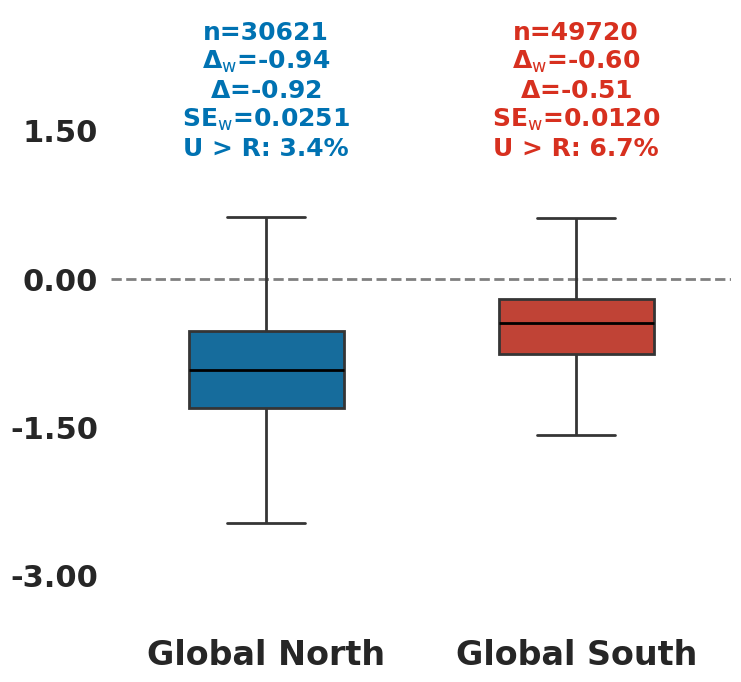

In [30]:
# ------------------------------------------------------------------
# IMPORTS
# ------------------------------------------------------------------
import os
import sys
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator, FormatStrFormatter
from scipy.stats import mannwhitneyu, ks_2samp

# ------------------------------------------------------------------
# CONFIG
# ------------------------------------------------------------------
LAI_DIVISOR = 10.0  # requested scaling factor (apply before Δ)
OUTFIG = '/content/drive/MyDrive/UrbanVegetation/FiguresV3/Fig3C.pdf'
PALETTE = {'Global North': '#0072B2', 'Global South': '#d7301f'}

# ------------------------------------------------------------------
# HELPERS
# ------------------------------------------------------------------
def _safe_pct(series_bool: pd.Series) -> float:
    """Return 100 * mean of a boolean Series, robust to empties."""
    n = series_bool.size
    if n == 0:
        return float("nan")
    return float(series_bool.mean() * 100.0)

def _ext_from_path(path: str) -> str:
    """Return lowercased extension without dot (default 'png')."""
    ext = os.path.splitext(path)[1].lower().strip(".")
    return ext if ext in {"png", "pdf", "svg"} else "png"

def _kish_weighted_mean_se(x: np.ndarray, w: np.ndarray):
    """
    Kish-weighted mean and SE:
      μ_w   = Σ w x / Σ w
      Var_w = Σ w (x - μ_w)^2 / Σ w
      n_eff = (Σ w)^2 / Σ w^2
      SE_w  = sqrt(Var_w / n_eff)
    Returns (mu_w, se_w, n_eff, n_raw, sum_w)
    """
    x = np.asarray(x, dtype=float)
    w = np.asarray(w, dtype=float)
    m = np.isfinite(x) & np.isfinite(w) & (w > 0)
    x, w = x[m], w[m]
    n_raw = int(x.size)
    if n_raw == 0:
        return (np.nan, np.nan, 0.0, 0, 0.0)
    W = float(w.sum())
    mu = float(np.dot(w, x) / W)
    var_w = float(np.dot(w, (x - mu) ** 2) / W)
    w2 = float(np.dot(w, w))
    n_eff = (W * W) / w2 if w2 > 0 else 0.0
    se = float(np.sqrt(var_w / max(n_eff, 1.0))) if np.isfinite(var_w) else np.nan
    return (mu, se, n_eff, n_raw, W)

def _compute_limits(values: np.ndarray, include_zero: bool = True, pad_frac: float = 0.10):
    """Compute nice y-limits with padding; optionally force-include 0."""
    v = np.asarray(values, dtype=float)
    v = v[np.isfinite(v)]
    if v.size == 0:
        return (-1.0, 1.0)  # fallback
    vmin, vmax = float(np.min(v)), float(np.max(v))
    if include_zero:
        vmin = min(vmin, 0.0)
        vmax = max(vmax, 0.0)
    rng = vmax - vmin
    if rng <= 0:
        rng = max(abs(vmin), abs(vmax), 1.0)  # avoid zero-range
    pad = pad_frac * rng
    return (vmin - pad, vmax + pad)

# ------------------------------------------------------------------
# 1) PLOTTER — fixed design, dynamic y-axis & annotations
# ------------------------------------------------------------------
def _boxplot(df: pd.DataFrame,
             value_col: str,
             group_col: str,
             palette: dict,
             outfile: str,
             ann_stats: dict,
             pct_by_group: dict,
             pct_decimals: int = 1,
             yticks_decimals: int = 2) -> None:
    """
    Two-box plot with fixed x-axis order: Global North | Global South.
    - y-axis: clean numeric ticks via MaxNLocator + FormatStrFormatter.
    - annotations: positioned slightly above the bottom of the visible range.
    """
    if df.empty:
        raise ValueError("Nothing to plot – dataframe is empty.")

    # Fonts & style
    plt.rcParams.update({'font.size': 24})
    sns.set(style="white")

    fig = plt.figure(figsize=(8, 8), facecolor="none")
    ax = sns.boxplot(
        x=group_col, y=value_col, data=df,
        order=['Global North', 'Global South'],
        palette=palette, width=0.5, showfliers=False,
        boxprops={'alpha': 1, 'linewidth': 2},
        whiskerprops={'linewidth': 2},
        capprops={'linewidth': 2},
        medianprops={'linewidth': 2, 'color': 'black'}
    )

    # 0 reference
    ax.axhline(0, color='gray', linestyle='--', linewidth=2, zorder=0)

    # Compute and set limits from data (with padding) and include zero
    y_lo, y_hi = _compute_limits(df[value_col].to_numpy(), include_zero=True, pad_frac=0.10)
    ax.set_ylim(y_lo, y_hi)

    # Ticks: auto-locate, then format to desired decimals
    ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
    ax.yaxis.set_major_formatter(FormatStrFormatter(f'%.{yticks_decimals}f'))

    plt.yticks(fontsize=22, fontweight='bold')
    plt.xticks(fontsize=24, fontweight='bold')

    sns.despine(left=True, bottom=True, trim=True, offset=10)
    ax.set_xlabel("")
    ax.set_ylabel("")

    # Dynamic annotation y (just above the bottom)
    y_min, y_max = ax.get_ylim()
    y_span = y_max - y_min
    annot_y = 1.2  # 2% up from bottom

    # Per-group annotation: n, μ_w, μ, SE_w, U>R
    for i, tick in enumerate(ax.get_xticklabels()):
        grp = tick.get_text()
        if grp in ann_stats:
            st = ann_stats[grp]
            pct = pct_by_group.get(grp, float('nan'))
            ann = (
                f"n={st['n_raw']}\n"
                r"$\boldsymbol{\Delta}_{\mathrm{w}}$" + f"={st['mu_bar']:.2f}\n"
                r"$\boldsymbol{\Delta}$"               + f"={st['mu_simple']:.2f}\n"
                r"$\mathbf{SE}_{\mathrm{w}}$"         + f"={st['se_w']:.4f}\n"
                f"U > R: {pct:.{pct_decimals}f}%"
            )
            ax.text(i, annot_y, ann,
                    ha='center', va='bottom',
                    fontsize=18, fontweight='bold',
                    color=palette[grp])

    # Save with extension-aware format
    outdir = os.path.dirname(outfile)
    if outdir:
        os.makedirs(outdir, exist_ok=True)
    fig_format = _ext_from_path(outfile)
    fig.savefig(outfile, dpi=400, bbox_inches='tight',
                format=fig_format, transparent=True)
    print(f"Figure saved → {outfile}")
    plt.show()

# ------------------------------------------------------------------
# 2) ANALYSIS PIPELINE — computes LAI (urban − rural) and stats
# ------------------------------------------------------------------
def analyse_lai(csv_path: str) -> pd.DataFrame:
    """
    Analyse ΔLAI (urban − rural) for all valid cities in the CSV and
    render a two-box plot with weighted + unweighted annotations.
    Applies LAI scaling (÷10) BEFORE computing differences.
    """
    if not os.path.isfile(csv_path):
        raise FileNotFoundError(f"CSV not found: {csv_path}")

    # Read only needed columns (include Buffer_area as fallback)
    req_any = ['lai_mean_urban', 'lai_mean_rural', 'GlobalNS', 'Urban_Area',
               'Rural_area', 'Buffer_area']
    try:
        df = pd.read_csv(csv_path, usecols=lambda c: (c in req_any))
    except Exception as e:
        raise RuntimeError(f"Failed to read '{csv_path}': {e}")

    # Alias Buffer_area → Rural_area if needed
    if 'Rural_area' not in df.columns:
        if 'Buffer_area' in df.columns:
            df['Rural_area'] = df['Buffer_area']
        else:
            raise ValueError("Required column missing: Rural_area (or Buffer_area)")

    required = ['lai_mean_urban', 'lai_mean_rural', 'GlobalNS', 'Urban_Area', 'Rural_area']
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise ValueError(f"Required column(s) missing: {missing}")

    # Coerce numerics
    num_cols = ['lai_mean_urban', 'lai_mean_rural', 'Urban_Area', 'Rural_area']
    df[num_cols] = df[num_cols].apply(lambda s: pd.to_numeric(s, errors='coerce'))

    before = len(df)
    df.dropna(subset=required, inplace=True)
    df = df[(df['Urban_Area'] > 0) & (df['Rural_area'] > 0)].copy()
    after = len(df)
    print(f"Valid rows after cleaning: {after:,} of {before:,}")
    if after == 0:
        raise ValueError("No valid data rows remain after cleaning.")

    # SCALE LAI BEFORE ANALYSIS (requested change)
    df['lai_mean_urban'] = df['lai_mean_urban'] / LAI_DIVISOR
    df['lai_mean_rural'] = df['lai_mean_rural'] / LAI_DIVISOR

    # ΔLAI after scaling
    df['lai_diff'] = df['lai_mean_urban'] - df['lai_mean_rural']

    # Harmonize group labels
    df['GlobalNS'] = df['GlobalNS'].replace({'North': 'Global North',
                                             'South': 'Global South'})
    df = df[df['GlobalNS'].isin({'Global North', 'Global South'})]
    if df.empty:
        raise ValueError("No rows with Global North/South after harmonization.")

    # Per-group vectors
    ann_stats = {}
    pct_by_group = {}
    for grp in ('Global North', 'Global South'):
        g = df.loc[df['GlobalNS'] == grp].copy()
        x = pd.to_numeric(g['lai_diff'], errors='coerce').to_numpy()
        w = (pd.to_numeric(g['Urban_Area'], errors='coerce').to_numpy() +
             pd.to_numeric(g['Rural_area'], errors='coerce').to_numpy())

        # Weighted stats (Kish)
        mu_bar, se_w, n_eff, n_raw, _W = _kish_weighted_mean_se(x, w)

        # Simple mean (unweighted)
        mu_simple = float(np.nanmean(x)) if np.isfinite(x).any() else float('nan')

        ann_stats[grp] = {
            'n_raw': n_raw,
            'mu_bar': float(mu_bar),
            'se_w': float(se_w) if np.isfinite(se_w) else float('nan'),
            'mu_simple': mu_simple
        }
        pct_by_group[grp] = _safe_pct(pd.Series(x) > 0)

    # Tests (nonparametric + KS) and Cohen’s d (console only)
    north = df.loc[df['GlobalNS'] == 'Global North', 'lai_diff']
    south = df.loc[df['GlobalNS'] == 'Global South', 'lai_diff']
    try:
        mw_u, mw_p = mannwhitneyu(north, south, alternative='two-sided')
    except ValueError:
        mw_p = np.nan
    try:
        ks_s, ks_p = ks_2samp(north, south)
    except ValueError:
        ks_p = np.nan
    pooled_sd = math.sqrt((north.var(ddof=1) + south.var(ddof=1)) / 2) if (north.size > 1 and south.size > 1) else 0.0
    cohens_d = (north.mean() - south.mean()) / pooled_sd if pooled_sd else np.nan

    print("\n─ Statistics on urban − rural LAI Δ (all cities, scaled ÷10) ─")
    print(f"Mann-Whitney U p-value : {mw_p:.4e}" if not np.isnan(mw_p) else "Mann-Whitney U p-value : n/a")
    print(f"Kolmogorov-Smirnov p   : {ks_p:.4e}" if not np.isnan(ks_p) else "Kolmogorov-Smirnov p   : n/a")
    print(f"Cohen’s d (effect size): {cohens_d:.3f}" if not np.isnan(cohens_d) else "Cohen’s d (effect size): n/a")

    # Plot with updated y-axis & annotations
    _boxplot(
        df[['GlobalNS', 'lai_diff']],
        value_col='lai_diff',
        group_col='GlobalNS',
        palette=PALETTE,
        outfile=OUTFIG,
        ann_stats=ann_stats,
        pct_by_group=pct_by_group,
        pct_decimals=1,
        yticks_decimals=2
    )

    return df

# ------------------------------------------------------------------
# 3) CLI
# ------------------------------------------------------------------
def main() -> None:
    csv_path = '/content/urbanRuralLAI_with_countries_global_ns_veg.csv'
    try:
        analyse_lai(csv_path)
    except FileNotFoundError as e:
        print(f"[ERROR] {e}", file=sys.stderr); sys.exit(1)
    except ValueError as e:
        print(f"[ERROR] {e}", file=sys.stderr); sys.exit(2)
    except Exception as e:
        print(f"[ERROR] Unexpected: {e}", file=sys.stderr); sys.exit(3)

if __name__ == "__main__":
    main()


# Climate World veg

In [31]:
from __future__ import annotations
import math
import sys
from pathlib import Path
from typing import Optional, List

import numpy as np
import pandas as pd
from scipy.stats import wilcoxon, f_oneway

# ────────────────────────── USER CONFIG ──────────────────────────
CSV_PATH  = Path("/content/urbanRuralLAI_with_countries_global_ns_veg.csv")
SAVE_DIR  = '/content/ns_outputs_climate'            # e.g., Path("/content/ns_outputs"); None → no file written
TOP_N     = 1000
LAI_SCALE = 10            # set to 1 if lai_mean_* already in LAI units

KOPPEN_COL      = "koppen_name"
URBAN_LAI_COL   = "lai_mean_urban"
RURAL_LAI_COL   = "lai_mean_rural"
URBAN_AREA_COL  = "Urban_Area"      # optional (for weights & Top-1000)
RURAL_AREA_CAND = ["Rural_area", "Buffer_area"]  # we'll pick first existing

KOPPEN_MAP    = {"A": "Tropical", "B": "Arid", "C": "Temperate", "D": "Continental"}
CLIMATE_ORDER = ["Arid", "Tropical", "Temperate", "Continental"]

# ────────────────────────── HELPERS ──────────────────────────────

def _coerce_num(s: pd.Series) -> pd.Series:
    return pd.to_numeric(s, errors="coerce")

def _find_rural_area_col(df: pd.DataFrame) -> Optional[str]:
    for c in RURAL_AREA_CAND:
        if c in df.columns:
            return c
    return None

def _kish_weighted_mean_se(x: pd.Series, w: pd.Series) -> (float, float):
    x = _coerce_num(x)
    w = _coerce_num(w)
    m = x.notna() & w.notna() & np.isfinite(x) & np.isfinite(w) & (w > 0)
    x = x[m].to_numpy(float)
    w = w[m].to_numpy(float)

    if x.size == 0:
        return (np.nan, np.nan)

    W = float(w.sum())
    if W <= 0:
        return (np.nan, np.nan)

    mu_w = float(np.dot(w, x) / W)
    w2 = float(np.dot(w, w))
    n_eff = (W * W) / w2 if w2 > 0 else np.nan

    var_w = float(np.dot(w, (x - mu_w) ** 2) / W)
    if not np.isfinite(var_w) or not np.isfinite(n_eff) or n_eff <= 0:
        return (mu_w, np.nan)

    se_w = float(math.sqrt(var_w / n_eff))
    return (mu_w, se_w)

def _mean_se(x: pd.Series) -> (float, float, int):
    x = _coerce_num(x).dropna()
    n = int(x.size)
    if n == 0:
        return (np.nan, np.nan, 0)
    mu = float(x.mean())
    se = float(x.std(ddof=1) / math.sqrt(n)) if n > 1 else np.nan
    return (mu, se, n)

def _rank_biserial_from_diff(diff: pd.Series) -> float:
    """
    Signed rank-biserial correlation for paired differences (Urban − Rural):

        r_rb = (R_pos - R_neg) / (R_pos + R_neg)

    where ranks are on |diff| excluding zeros.
    Positive r_rb ⇒ more / larger Urban > Rural
    Negative r_rb ⇒ more / larger Rural > Urban
    """
    d = _coerce_num(diff)
    d = d[d != 0].dropna()
    n = int(d.size)
    if n == 0:
        return float("nan")

    # rank absolute differences
    ranks = d.abs().rank(method="average")
    R_pos = float(ranks[d > 0].sum())
    R_neg = float(ranks[d < 0].sum())
    R_tot = R_pos + R_neg
    if R_tot <= 0:
        return float("nan")

    return float((R_pos - R_neg) / R_tot)

def _fmt(v):
    if v is None:
        return ""
    if isinstance(v, (float, np.floating)):
        if not np.isfinite(v):
            return ""
        return f"{v:.4f}"
    if isinstance(v, (int, np.integer)):
        return f"{v:d}"
    if v == "":
        return ""
    return str(v)

# ────────────────────────── ETL ───────────────────────────────────

def _load_and_prepare(csv_path: Path) -> tuple[pd.DataFrame, Optional[str]]:
    if not csv_path.is_file():
        raise FileNotFoundError(f"CSV not found: {csv_path}")

    df = pd.read_csv(csv_path, low_memory=False)

    needed = [URBAN_LAI_COL, RURAL_LAI_COL, KOPPEN_COL]
    missing = [c for c in needed if c not in df.columns]
    if missing:
        raise ValueError(f"Missing required columns: {missing}")

    # Coerce numerics
    for c in [URBAN_LAI_COL, RURAL_LAI_COL, URBAN_AREA_COL]:
        if c in df.columns:
            df[c] = _coerce_num(df[c])

    rural_area_col = _find_rural_area_col(df)
    if rural_area_col:
        df[rural_area_col] = _coerce_num(df[rural_area_col])

    # LAI in proper units
    scale = float(LAI_SCALE)
    df["lai_urban"] = _coerce_num(df[URBAN_LAI_COL]) / scale
    df["lai_rural"] = _coerce_num(df[RURAL_LAI_COL]) / scale
    df["lai_diff"]  = df["lai_urban"] - df["lai_rural"]

    # Köppen class
    def map_koppen(val: str) -> Optional[str]:
        if not isinstance(val, str) or len(val) == 0:
            return None
        return KOPPEN_MAP.get(val[0])

    df["Climate"] = df[KOPPEN_COL].astype(str).map(map_koppen)
    df = df.dropna(subset=["Climate", "lai_urban", "lai_rural", "lai_diff"]).copy()
    df["Climate"] = pd.Categorical(df["Climate"],
                                   categories=CLIMATE_ORDER,
                                   ordered=True)

    # Define w_diff if areas exist
    if URBAN_AREA_COL in df.columns and rural_area_col:
        df = df.dropna(subset=[URBAN_AREA_COL, rural_area_col]).copy()
        df = df[(df[URBAN_AREA_COL] > 0) & (df[rural_area_col] > 0)].copy()
        df["w_diff"] = df[URBAN_AREA_COL] + df[rural_area_col]
        df = df[df["w_diff"] > 0].copy()
    else:
        df["w_diff"] = np.nan  # Δw not available

    if df.empty:
        raise ValueError("No valid rows after cleaning and LAI/Climate filtering.")

    return df, rural_area_col

def _top_n_by_urban_area(df: pd.DataFrame, n: int) -> pd.DataFrame:
    if URBAN_AREA_COL not in df.columns:
        return pd.DataFrame()
    tmp = df.dropna(subset=[URBAN_AREA_COL])
    tmp = tmp[tmp[URBAN_AREA_COL] > 0]
    if tmp.empty:
        return pd.DataFrame()
    n = min(n, len(tmp))
    return tmp.nlargest(n, URBAN_AREA_COL, keep="all").copy()

# ────────────────────────── SCOPE SUMMARY ─────────────────────────

def _summarize_scope(df: pd.DataFrame,
                     cohort_label: str,
                     have_urban_area: bool,
                     rural_area_col: Optional[str]) -> pd.DataFrame:
    rows = []
    groups_for_anova: List[np.ndarray] = []

    for clim in CLIMATE_ORDER:
        sub = df[df["Climate"] == clim]
        if sub.empty:
            continue

        # Unweighted means
        u_mu, u_se, u_n = _mean_se(sub["lai_urban"])
        r_mu, r_se, r_n = _mean_se(sub["lai_rural"])

        # Weighted means (if possible)
        if have_urban_area:
            u_mu_w, u_se_w = _kish_weighted_mean_se(sub["lai_urban"], sub[URBAN_AREA_COL])
        else:
            u_mu_w, u_se_w = (np.nan, np.nan)

        if rural_area_col:
            r_mu_w, r_se_w = _kish_weighted_mean_se(sub["lai_rural"], sub[rural_area_col])
        else:
            r_mu_w, r_se_w = (np.nan, np.nan)

        # Differences
        diff = _coerce_num(sub["lai_diff"]).dropna()
        n_diff = int(diff.size)
        delta = float(diff.mean()) if n_diff > 0 else np.nan

        # Weighted Δw via w_diff if available
        if n_diff > 0 and "w_diff" in sub.columns and sub["w_diff"].notna().any():
            x = diff.to_numpy()
            w = _coerce_num(sub.loc[diff.index, "w_diff"]).to_numpy()
            m = np.isfinite(x) & np.isfinite(w) & (w > 0)
            x, w = x[m], w[m]
            if x.size > 0 and w.sum() > 0:
                delta_w = float(np.dot(w, x) / w.sum())
            else:
                delta_w = np.nan
        else:
            delta_w = np.nan

        # Wilcoxon signed-rank on diff vs 0 (for Test Statistic & p-value)
        if n_diff >= 5 and np.any(diff != 0):
            try:
                T, p_w = wilcoxon(diff, zero_method="wilcox", alternative="two-sided")
            except Exception:
                T, p_w = (np.nan, np.nan)
        else:
            T, p_w = (np.nan, np.nan)

        # Cohen's d for diff vs 0
        if n_diff > 1:
            sd_diff = float(diff.std(ddof=1))
            d = float(delta / sd_diff) if (sd_diff > 0 and np.isfinite(sd_diff)) else np.nan
        else:
            d = np.nan

        # Rank-biserial r (SIGNED, from diff directly)
        r_rb = _rank_biserial_from_diff(diff) if n_diff > 0 else float("nan")

        # % U>R, % U<R, % U==R
        if n_diff > 0:
            pct_ur = float((diff > 0).mean() * 100.0)
            pct_ul = float((diff < 0).mean() * 100.0)
            pct_eq = float((diff == 0).mean() * 100.0)
        else:
            pct_ur = pct_ul = pct_eq = np.nan

        # Store groups for ANOVA
        if n_diff > 0:
            groups_for_anova.append(diff.to_numpy())

        rows.append({
            "Climate": clim,
            "Cohort": cohort_label,
            "Urban μ": u_mu,
            "Urban SE": u_se,
            "Urban μw": u_mu_w,
            "Urban SEw": u_se_w,
            "Rural μ": r_mu,
            "Rural SE": r_se,
            "Rural μw": r_mu_w,
            "Rural SEw": r_se_w,
            "Δ": delta,
            "Δw": delta_w,
            "Cohen's d": d,
            "Rank-biserial r": r_rb,
            "Test Statistic": T,
            "p-value": p_w,
            "n": n_diff,
            "% U>R": pct_ur,
            "% U<R": pct_ul,
            "% U==R": pct_eq,
        })

    # One-way ANOVA on diff across climates (within this scope)
    F_anova = np.nan
    p_anova = np.nan
    eta2 = np.nan
    valid_groups = [g for g in groups_for_anova if g.size > 1]
    if len(valid_groups) >= 2:
        try:
            F_anova, p_anova = f_oneway(*valid_groups)
            k = len(valid_groups)
            N = float(sum(len(g) for g in valid_groups))
            if np.isfinite(F_anova) and N > k:
                eta2 = float((F_anova * (k - 1)) /
                             (F_anova * (k - 1) + (N - k)))
        except Exception:
            F_anova = p_anova = eta2 = np.nan

    out = pd.DataFrame(rows)

    # Attach scope-level ANOVA stats to each row
    out["ANOVA F"] = F_anova
    out["ANOVA η²"] = eta2
    out["ANOVA p-value"] = p_anova

    # Sort & round
    if not out.empty:
        out["Climate"] = pd.Categorical(out["Climate"],
                                        categories=CLIMATE_ORDER,
                                        ordered=True)
        out = out.sort_values(["Cohort", "Climate"]).reset_index(drop=True)

    num_cols = [
        "Urban μ", "Urban SE", "Urban μw", "Urban SEw",
        "Rural μ", "Rural SE", "Rural μw", "Rural SEw",
        "Δ", "Δw",
        "Cohen's d", "Rank-biserial r",
        "Test Statistic", "p-value",
        "% U>R", "% U<R", "% U==R",
        "ANOVA F", "ANOVA η²", "ANOVA p-value",
    ]
    for c in num_cols:
        if c in out.columns:
            out[c] = pd.to_numeric(out[c], errors="coerce").round(4)

    return out

# ────────────────────────── MAIN ───────────────────────────────────

def main():
    try:
        df_all, rural_area_col = _load_and_prepare(CSV_PATH)
        have_ua = URBAN_AREA_COL in df_all.columns
        print(f"[OK] Loaded {df_all.shape[0]:,} rows × {df_all.shape[1]:,} cols after cleaning.")
        print(f"[INFO] Urban_Area present: {have_ua}")
        print(f"[INFO] Rural area column: {rural_area_col if rural_area_col else 'None (Δw, Rural μw unavailable)'}")

        # All cities
        summary_all = _summarize_scope(df_all, "All cities", have_ua, rural_area_col)

        # Top-1000 (Major cities)
        df_top = _top_n_by_urban_area(df_all, TOP_N) if have_ua else pd.DataFrame()
        if not df_top.empty:
            print(f"[OK] TOP_{TOP_N}: {df_top.shape[0]:,} rows selected for Major cities.")
            summary_top = _summarize_scope(df_top, "Major cities", have_ua, rural_area_col)
        else:
            if have_ua:
                print(f"[WARN] TOP_{TOP_N} subset empty or too small; skipping Major cities.")
            summary_top = pd.DataFrame(columns=summary_all.columns)

        # Combine
        summary = pd.concat([summary_all, summary_top], ignore_index=True)

        # Console table
        print("\n=== LAI × CLIMATE × COHORT SUMMARY TABLE ===")
        with pd.option_context("display.max_rows", None,
                               "display.max_columns", None):
            print(summary.to_string(
                index=False,
                formatters={col: _fmt for col in summary.columns}
            ))

        # CSV block
        print("\n=== LAI × CLIMATE × COHORT SUMMARY TABLE CSV ===")
        print(summary.to_csv(index=False, float_format="%.4f", na_rep=""))

        # Optional save
        if SAVE_DIR:
            out_dir = Path(SAVE_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            out_path = out_dir / "lai_climate_summary_table.csv"
            summary.to_csv(out_path, index=False, float_format="%.4f", na_rep="")
            print(f"[OK] Saved: {out_path}")

    except (FileNotFoundError, ValueError) as e:
        print(f"[ERROR] {e}", file=sys.stderr)
        sys.exit(1)
    except Exception as e:
        print(f"[ERROR] Unexpected failure: {e.__class__.__name__}: {e}", file=sys.stderr)
        raise

if __name__ == "__main__":
    main()


[OK] Loaded 82,790 rows × 186 cols after cleaning.
[INFO] Urban_Area present: True
[INFO] Rural area column: Rural_area
[OK] TOP_1000: 1,000 rows selected for Major cities.

=== LAI × CLIMATE × COHORT SUMMARY TABLE ===
    Climate       Cohort Urban μ Urban SE Urban μw Urban SEw Rural μ Rural SE Rural μw Rural SEw       Δ      Δw Cohen's d Rank-biserial r Test Statistic p-value     n   % U>R    % U<R % U==R   ANOVA F ANOVA η² ANOVA p-value
       Arid   All cities  0.2051   0.0022   0.1782    0.0139  0.4924   0.0037   0.4491    0.0215 -0.2874 -0.2654   -0.7742         -0.8563   6174880.0000  0.0000 13173 11.1440  88.3929 0.4631 3981.0164   0.1261        0.0000
   Tropical   All cities  0.5891   0.0058   0.4758    0.0300  1.2520   0.0067   1.2542    0.0378 -0.6629 -0.7673   -1.4721         -0.9750    674755.0000  0.0000 10406  4.3340  95.4257 0.2402 3981.0164   0.1261        0.0000
  Temperate   All cities  0.6629   0.0024   0.5184    0.0149  1.4628   0.0034   1.4259    0.0214 -0.7999 -

/tmp/ipython-input-2705260502.py:76: DtypeWarning: Columns (36,38,39,41,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(INPUT_CSV)
/tmp/ipython-input-2705260502.py:143: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


Saved RainCloud plot → /content/Fig3D.pdf


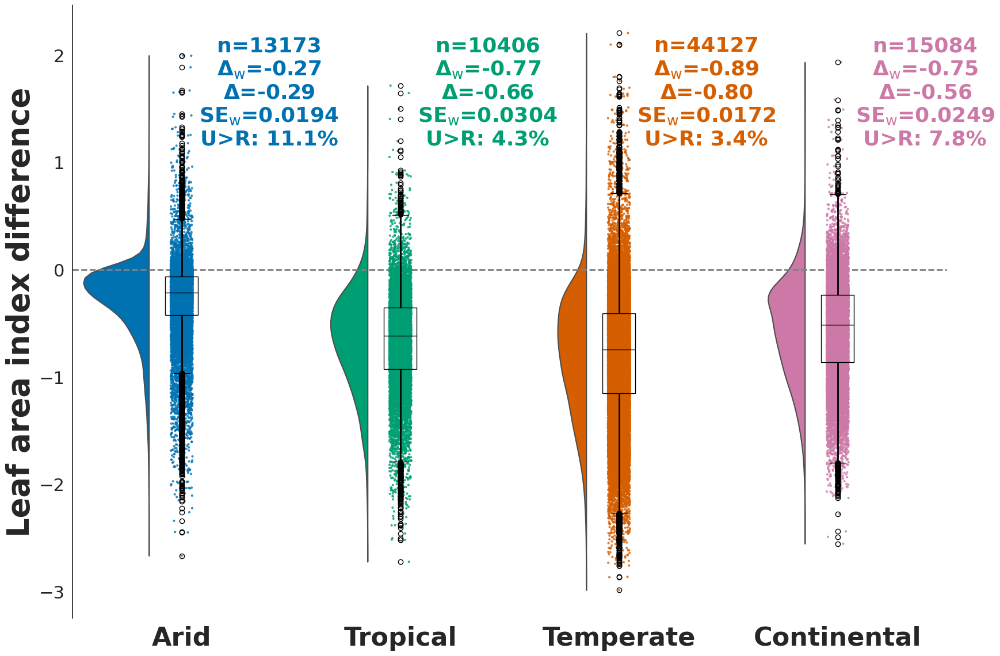

In [32]:
# ────────────────────────────────────────────────────────────────────
# IMPORTS
# ────────────────────────────────────────────────────────────────────
import sys
import warnings
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ptitprince as pt

# Geospatial packages are optional and not used for filtering
try:
    import geopandas as gpd  # noqa: F401
    from shapely.geometry import Point  # noqa: F401
except Exception:
    gpd = None

# ────────────────────────────────────────────────────────────────────
# SILENCE KNOWN FUTUREWARNINGS (to keep console clean)
# ────────────────────────────────────────────────────────────────────
warnings.filterwarnings(
    "ignore",
    message="The default of observed=False is deprecated",
    category=FutureWarning,
    module="seaborn"
)

# ────────────────────────────────────────────────────────────────────
# CONFIGURATION (adjust paths as needed)
# ────────────────────────────────────────────────────────────────────
INPUT_CSV     = Path('/content/urbanRuralLAI_with_countries_global_ns_veg.csv')
OUTPUT_PNG    = Path('/content/Fig3D.pdf')  # saving as PDF is intentional
PCT_DECIMALS  = 1  # decimals for "U>R" percentage in the annotation

# ────────────────────────────────────────────────────────────────────
# HELPERS
# ────────────────────────────────────────────────────────────────────
def _safe_pct(series_bool: pd.Series) -> float:
    """Return 100 * mean of a boolean Series; NaN if empty."""
    n = int(series_bool.size)
    if n == 0:
        return float("nan")
    return float(series_bool.mean() * 100.0)

def _kish_weighted_mean_se(x: np.ndarray, w: np.ndarray):
    """
    Kish weighting:
      μ_w   = Σ w x / Σ w
      Var_w = Σ w (x − μ_w)^2 / Σ w
      n_eff = (Σ w)^2 / Σ w^2
      SE_w  = sqrt(Var_w / n_eff)
    Returns (mu_w, se_w, n_eff, n_raw, W_sum)
    """
    x = np.asarray(x, dtype=float)
    w = np.asarray(w, dtype=float)
    mask = np.isfinite(x) & np.isfinite(w) & (w > 0)
    x, w = x[mask], w[mask]
    n_raw = int(x.size)
    if n_raw == 0:
        return (np.nan, np.nan, 0.0, 0, 0.0)
    W = float(w.sum())
    mu_w = float(np.dot(w, x) / W)
    var_w = float(np.dot(w, (x - mu_w) ** 2) / W)
    w2 = float(np.dot(w, w))
    n_eff = (W * W) / w2 if w2 > 0 else 0.0
    se_w = float(np.sqrt(var_w / max(n_eff, 1.0))) if np.isfinite(var_w) else np.nan
    return (mu_w, se_w, n_eff, n_raw, W)

# ────────────────────────────────────────────────────────────────────
# LOAD DATA (robust I/O with explicit error)
# ────────────────────────────────────────────────────────────────────
try:
    data = pd.read_csv(INPUT_CSV)
except Exception as e:
    raise IOError(f"Error reading CSV file '{INPUT_CSV}': {e}")

# ────────────────────────────────────────────────────────────────────
# VALIDATION & PREPROCESSING
# ────────────────────────────────────────────────────────────────────
required = [
    "lai_mean_urban", "lai_mean_rural", "koppen_name",
    "lat", "lon", "Urban_Area", "Rural_area"  # Rural_area needed for weights
]
missing = [c for c in required if c not in data.columns]
if missing:
    raise ValueError(f"Missing required columns: {missing}")

# Fail fast if any required column has NaNs
for col in required:
    if data[col].isna().any():
        bad = int(data[col].isna().sum())
        raise ValueError(f"Column '{col}' contains {bad} NaNs; please clean or impute before plotting.")

# Compute urban–rural difference; keep 1/10 scaling to match LAI units used elsewhere
data = data.copy()
data["lai_diff"] = (data["lai_mean_urban"] - data["lai_mean_rural"]) / 10.0

# Map first-letter Köppen to broad classes; drop unmapped (e.g., 'E')
koppen_map = {'A': 'Tropical', 'B': 'Arid', 'C': 'Temperate', 'D': 'Continental'}
data['koppen_class'] = data['koppen_name'].astype(str).str[0].map(koppen_map)
data = data.dropna(subset=['koppen_class']).copy()

# ── CHANGED: explicit desired x-axis order ─────────────────────────
desired_order = ['Arid', 'Tropical', 'Temperate', 'Continental']
present = [c for c in desired_order if c in data['koppen_class'].unique()]
categories = present
data.loc[:, 'koppen_class'] = pd.Categorical(data['koppen_class'], categories=categories, ordered=True)
# ────────────────────────────────────────────────────────────────────

# ────────────────────────────────────────────────────────────────────
# PLOTTING
# ────────────────────────────────────────────────────────────────────
plt.rcParams.update({'font.size': 26})
fig, ax = plt.subplots(figsize=(18, 12))

# Color-blind–friendly palette
palette = ['#0072B2', '#009E73', '#D55E00', '#CC79A7']
if len(categories) > len(palette):
    palette = sns.color_palette("colorblind", n_colors=len(categories))

# RainCloud: half-violin
pt.half_violinplot(
    x='koppen_class', y='lai_diff', data=data,
    palette=palette, bw=.2, cut=0, scale="area",
    width=.6, inner=None, orient='v',
    order=categories, ax=ax
)

# Boxplot overlay (transparent fill; black lines; zorder=10)
sns.boxplot(
    x='koppen_class', y='lai_diff', data=data,
    width=.15, showcaps=True,
    boxprops={'facecolor': 'none'},
    whiskerprops={'linewidth': 2},
    color='black', zorder=10,
    order=categories, ax=ax
)

# Stripplot overlay (points)
sns.stripplot(
    x='koppen_class', y='lai_diff', data=data,
    palette=palette, jitter=0.05, size=3,
    alpha=0.8, orient='v',
    order=categories, ax=ax
)

# Zero line & axis cosmetics
ax.axhline(0, color='gray', linestyle='--', linewidth=2)
ax.grid(False)
ax.spines['bottom'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_ylabel('Leaf area index difference', fontsize=38, fontweight='bold')
ax.set_xlabel('')
ax.tick_params(axis='x', rotation=0, labelsize=32)
ax.tick_params(axis='y', labelsize=22)
plt.setp(ax.get_xticklabels(), fontweight='bold')

# ────────────────────────────────────────────────────────────────────
# ANNOTATIONS — weighted (Kish) + simple mean per class
# ────────────────────────────────────────────────────────────────────
ymin, ymax = ax.get_ylim()
y_text = ymax - 0.05 * (ymax - ymin)

for i, cls in enumerate(categories):
    sub = data.loc[data['koppen_class'] == cls, :]

    # Series
    x = pd.to_numeric(sub['lai_diff'], errors='coerce').to_numpy()
    w = (pd.to_numeric(sub['Urban_Area'],  errors='coerce').to_numpy() +
         pd.to_numeric(sub['Rural_area'],  errors='coerce').to_numpy())

    # Weighted stats
    mu_bar, se_w, n_eff, n_raw, W_sum = _kish_weighted_mean_se(x, w)

    # Simple mean
    mu_simple = float(np.nanmean(x)) if x.size else float('nan')

    # U>R %
    upr = _safe_pct(pd.Series(x) > 0)

    # UPDATED notation: subscript w (no overlines)
    ann = (
        f"n={n_raw}\n"
        r"$\boldsymbol{\Delta}_{\mathrm{w}}$" + f"={mu_bar:.2f}\n"
        r"$\boldsymbol{\Delta}$"               + f"={mu_simple:.2f}\n"
        r"$\mathbf{SE}_{\mathrm{w}}$"       + f"={se_w:.4f}\n"
        f"U>R: {upr:.{PCT_DECIMALS}f}%"
    )

    ax.text(
        i + 0.40, y_text, ann,
        ha='center', va='top',
        fontsize=26, fontweight='bold',
        color=palette[i]
    )

plt.tight_layout()

# ────────────────────────────────────────────────────────────────────
# SAVE
# ────────────────────────────────────────────────────────────────────
OUTPUT_PNG.parent.mkdir(parents=True, exist_ok=True)
try:
    fig.savefig(OUTPUT_PNG, format='pdf', bbox_inches='tight', dpi=300)
    print(f"Saved RainCloud plot → {OUTPUT_PNG}")
except Exception as e:
    raise IOError(f"Error saving figure to '{OUTPUT_PNG}': {e}")

plt.show()
